# EXPANSIÓN ESTRATÉGICA DE LABORATORIOS PARA INVESTIGACIÓN Y VACUNACIÓN DE COVID-19

# Avance 1


### Importación de librerias

In [ ]:
#importamos las librerias necesarias para desarrollar el proyecto
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium


In [ ]:
#comandos para instalar correctamente matplotlib y seaborn
#import pip
#pip.main(["install","seaborn"])

In [ ]:
#Ruta del archivo .CSV que se usará para el análisis 
ruta_archivo = "'../csv/data_latinoamerica.csv"

#Creación del DataFrame con los datos del archivo CSV
df_covid=pd.read_csv(ruta_archivo,  parse_dates=['date'])

Comprobamos que el dataset cargado tiene la cantidad de registros y columnas especificadas 


In [ ]:
#Con el comando .info() obtenemos la cantidad de entradas y columnas del DataFrame cargado
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12216057 entries, 0 to 12216056
Data columns (total 50 columns):
 #   Column                                 Dtype         
---  ------                                 -----         
 0   location_key                           object        
 1   date                                   datetime64[ns]
 2   country_code                           object        
 3   country_name                           object        
 4   new_confirmed                          float64       
 5   new_deceased                           float64       
 6   cumulative_confirmed                   float64       
 7   cumulative_deceased                    float64       
 8   cumulative_vaccine_doses_administered  float64       
 9   population                             float64       
 10  population_male                        float64       
 11  population_female                      float64       
 12  population_rural                       float64       


In [ ]:
#con el comendao Shape de Numpy tambien podemos ver el numero de registros y de columnas
#np.shape(df_covid_latinoamerica)

#con el comando shape del mismo DataFrame tambien se puede ver el número de registros y de columnas
df_covid.shape

(12216057, 50)

### Seleccionamos los países con los que se realizará el análisis: Colombia, Argentina, Chile, México, Perú y Brasil.

In [ ]:
paises_selec=['Argentina','Peru','Chile','Colombia','Brazil','Mexico']
df_latinoamerica=df_covid[df_covid['country_name'].isin(paises_selec)]

In [ ]:
#validamos la cantidad de registros y columnas del DataFrame
df_latinoamerica.shape

(11970289, 50)

In [ ]:
#Observamos la cantidad de datos nulos que tiene cada una de las columnas del DataFrame
df_latinoamerica.isnull().sum()

location_key                                    0
date                                            0
country_code                                    0
country_name                                    0
new_confirmed                             5620283
new_deceased                              5661788
cumulative_confirmed                      5619937
cumulative_deceased                       5661426
cumulative_vaccine_doses_administered    11706131
population                                 521266
population_male                           1122803
population_female                         1122803
population_rural                         11964343
population_urban                         11964343
population_density                       11964343
human_development_index                   6472221
population_age_00_09                      1465689
population_age_10_19                      1465689
population_age_20_29                      1465689
population_age_30_39                      1465689


In [ ]:
df_latinoamerica.location_key.value_counts()

location_key
AR              991
MX_GRO_12040    991
MX_GRO_12031    991
MX_GRO_12032    991
MX_GRO_12033    991
               ... 
BR_PR_411880    991
BR_PR_411885    991
BR_PR_411890    991
BR_PR_411900    991
PE_UCA_0401     991
Name: count, Length: 12079, dtype: int64

In [ ]:
#filtramos el Dataframe por el Location_Key que representa a los paises del estudio
codigos_paises=['AR','PE','MX','CL','CO','BR']
df_paises=df_covid[df_covid['location_key'].isin(codigos_paises)]
df_paises.shape

(5946, 50)

### Datos con la fecha mayor o igual al 01/01/2021

In [ ]:
#Filtramos los datos de los registros que sean mayores o igual al 01/01/2021
df_paises_fecha=df_paises[df_paises['date']>='2021-01-01']

#vemos la cantidad de registros resultantes despues del filtrado
df_paises_fecha.shape


(3750, 50)

### Manejo de valores Nulos

In [ ]:
#Obtenemos el numero de valores nulos que quedan en cada una de las columnas del DataFrame
df_valores_nulos_fecha=df_paises_fecha.isnull().sum()[df_paises_fecha.isnull().sum()>0]
print(df_valores_nulos_fecha)
#print(np.shape(df_paises_fecha.shape))

new_confirmed                              21
new_deceased                               21
cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     589
average_temperature_celsius                42
minimum_temperature_celsius                41
maximum_temperature_celsius                41
rainfall_mm                                90
relative_humidity                          42
new_recovered                            2119
cumulative_recovered                     2740
dtype: int64


In [ ]:
#Actualizamos por cada país los valores nulos de las columnas indicadas con el valor promedio del pais en esa medida
for codigo_pais in codigos_paises:
    for columna in df_valores_nulos_fecha.index :
        if columna in ('new_confirmed', 'new_deceased', 'average_temperature_celsius', 'minimum_temperature_celsius',
                       'maximum_temperature_celsius', 'rainfall_mm', 'relative_humidity'):
            df_paises_fecha.loc[df_paises_fecha['country_code']==codigo_pais,columna]=df_paises_fecha[columna].fillna(df_paises_fecha.loc[df_paises_fecha['country_code']==codigo_pais,columna].mean())

In [ ]:
#comprobamos que valores nulos quedan en el DataFrame
df_valores_nulos_fecha=df_paises_fecha.isnull().sum()[df_paises_fecha.isnull().sum()>0]
print(df_valores_nulos_fecha)

cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     589
new_recovered                            2119
cumulative_recovered                     2740
dtype: int64


In [ ]:
#Mediante un ciclo For recorremos cada uno de los paises para actualizar en 0 
for codigo_pais in codigos_paises:
    df_paises_fecha.loc[df_paises_fecha['country_code']==codigo_pais,'new_recovered']=df_paises_fecha['new_recovered'].fillna(0)
    df_paises_fecha.loc[df_paises_fecha['country_code']==codigo_pais,'cumulative_recovered']=df_paises_fecha['cumulative_recovered'].fillna(0)
    df_paises_fecha.loc[df_paises_fecha['country_code']==codigo_pais,'cumulative_vaccine_doses_administered']=df_paises_fecha['cumulative_vaccine_doses_administered'].fillna(0)

In [ ]:
#comprobamos que valores nulos quedan en el DataFrame
df_valores_nulos_fecha=df_paises_fecha.isnull().sum()[df_paises_fecha.isnull().sum()>0]
print(df_valores_nulos_fecha)

cumulative_confirmed    21
cumulative_deceased     21
dtype: int64


In [ ]:
#ordenamos por 'loation_key' y 'date' en orden ascendente para preparar los datos para el siguiente paso
#y poder calcular los datos faltantes en las columnas de 'cumulative_cofirmed' y 'cumulative_deceased'
df_paises_ordenados=df_paises_fecha.sort_values(by=['location_key','date'], ascending=[True,True])

In [ ]:
#validamos que estan ordenados los datos por pais y fecha
df_paises_ordenados

,location_key,date,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
366,AR,2021-01-01,AR,Argentina,2685.000000,140.000000,1662867.0,46522.0,18849.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
367,AR,2021-01-02,AR,Argentina,7767.000000,166.000000,1670634.0,46688.0,20334.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
368,AR,2021-01-03,AR,Argentina,4934.000000,157.000000,1675568.0,46845.0,20529.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
369,AR,2021-01-04,AR,Argentina,13953.000000,157.000000,1689521.0,47002.0,25164.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
370,AR,2021-01-05,AR,Argentina,14085.000000,160.000000,1703606.0,47162.0,29852.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253872,PE,2022-09-13,PE,Peru,1150.000000,22.000000,4127612.0,216173.0,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
10253873,PE,2022-09-14,PE,Peru,5025.251208,197.165862,NaN,NaN,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
10253874,PE,2022-09-15,PE,Peru,5025.251208,197.165862,NaN,NaN,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
10253875,PE,2022-09-16,PE,Peru,5025.251208,197.165862,NaN,NaN,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0


In [ ]:

#Mediante  el ciclo While recorremos todos los valores nulos en la columna 'cumulative_confirmed' para buscar el 
#valor anterior acumulador valido con el comando shift(1) y le sumamos el valor de 'new_confirmed' para calcular
#el nuevo valor acumulado de la comumna
while df_paises_ordenados['cumulative_confirmed'].isnull().sum() > 0:
    df_paises_ordenados['cumulative_confirmed'] = round(df_paises_ordenados['cumulative_confirmed'].fillna(df_paises_ordenados['cumulative_confirmed'].shift(1) + df_paises_ordenados['new_confirmed']),2)



In [ ]:

#Mediante  el ciclo While recorremos todos los valores nulos en la columna 'cumulative_deceased' para buscar el 
#valor anterior acumulador valido con el comando shift(1) y le sumamos el valor de 'new_deceased' para calcular
#el nuevo valor acumulado de la comumna
while df_paises_ordenados['cumulative_deceased'].isnull().sum() > 0: 
    df_paises_ordenados['cumulative_deceased'] = round(df_paises_ordenados['cumulative_deceased'].fillna(df_paises_ordenados['cumulative_deceased'].shift(1) + df_paises_ordenados['new_deceased']),2)


In [ ]:
#validamos que no queda ningun valor nulo en el DataFrame
df_valores_nulos_fecha=df_paises_ordenados.isnull().sum()[df_paises_ordenados.isnull().sum()>0]
print(df_valores_nulos_fecha)

Series([], dtype: int64)


#### Guardamos los datos filtrados en un archivo con el nombre DatosFinalesFiltrado.csv a fin de poder utilizarlo luego y no tener que repetir el proceso de filtrado y limpieza.


In [ ]:
#guardamos el dataframe en un archivo CSV
df_paises_ordenados.to_csv('DatosFinalesFiltrado.csv',  index = False)

### Extra para arreglar un dato anomalo en la columna 'new_deceased' y 'cumulate_deceased' para el país Chile

In [ ]:
#Se carga el dataFrame desde el CSV guardado con los datos finales filtrados y se 
#cambia el campo 'date' a fecha mediante el comando parse_dates=
df_paises_covid=pd.read_csv('DatosFinalesFiltrado.csv',parse_dates=['date'])

In [ ]:
# Crear un índice único combinando 'location_key' y 'date'
df_paises_covid.set_index(['location_key', 'date'], inplace=True)

# Filtrar el DataFrame para obtener el registro específico
filtro1 = (df_paises_covid.index.get_level_values('location_key') == 'CL') & (df_paises_covid.index.get_level_values('date') == '2022-03-21')

# Actualizar el valor de la columna 'new_deceased' a 20 para el registro filtrado
df_paises_covid.loc[filtro1, 'new_deceased'] = 20

filtro2 = (df_paises_covid.index.get_level_values('location_key') == 'CL') & (df_paises_covid.index.get_level_values('date') >= '2022-03-21')
df_chile = df_paises_covid[filtro2]
  
# Obtener el valor acumulado de fallecidos hasta el día anterior a '2022-03-21'
valor_acumulado_anterior = df_paises_covid.loc[('CL', '2022-03-20'), 'cumulative_deceased'] if ('CL', '2022-03-20') in df_paises_covid.index else 0

# Actualizar los valores acumulados desde '2022-03-21' en adelante
df_chile['cumulative_deceased'] = valor_acumulado_anterior + df_chile['new_deceased'].cumsum()

# Actualizar el DataFrame original con los nuevos valores acumulados
df_paises_covid.update(df_chile)

# Verificar la actualización en el DataFrame filtrado
df_paises_covid

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\2311640929.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_chile['cumulative_deceased'] = valor_acumulado_anterior + df_chile['new_deceased'].cumsum()


country_code country_name  new_confirmed  \
location_key date                                                  
AR           2021-01-01           AR    Argentina    2685.000000   
             2021-01-02           AR    Argentina    7767.000000   
             2021-01-03           AR    Argentina    4934.000000   
             2021-01-04           AR    Argentina   13953.000000   
             2021-01-05           AR    Argentina   14085.000000   
...                              ...          ...            ...   
PE           2022-09-13           PE         Peru    1150.000000   
             2022-09-14           PE         Peru    5025.251208   
             2022-09-15           PE         Peru    5025.251208   
             2022-09-16           PE         Peru    5025.251208   
             2022-09-17           PE         Peru    5025.251208   

                         new_deceased  cumulative_confirmed  \
location_key date                                             
AR           2021-01-01    140.000000            1662867.00   
             2021-01-02    166.000000            1670634.00   
             2021-01-03    157.000000            1675568.00   
             2021-01-04    157.000000            1689521.00   
             2021-01-05    160.000000            1703606.00   
...                               ...                   ...   
PE           2022-09-13     22.000000            4127612.00   
             2022-09-14    197.165862            4132637.25   
             2022-09-15    197.165862            4137662.50   
             2022-09-16    197.165862            4142687.75   
             2022-09-17    197.165862            4147713.00   

                         cumulative_deceased  \
location_key date                              
AR           2021-01-01             46522.00   
             2021-01-02             46688.00   
             2021-01-03             46845.00   
             2021-01-04             47002.00   
             2021-01-05             47162.00   
...                                      ...   
PE           2022-09-13            216173.00   
             2022-09-14            216370.17   
             2022-09-15            216567.34   
             2022-09-16            216764.51   
             2022-09-17            216961.68   

                         cumulative_vaccine_doses_administered  population  \
location_key date                                                            
AR           2021-01-01                                18849.0  44938712.0   
             2021-01-02                                20334.0  44938712.0   
             2021-01-03                                20529.0  44938712.0   
             2021-01-04                                25164.0  44938712.0   
             2021-01-05                                29852.0  44938712.0   
...                                                        ...         ...   
PE           2022-09-13                                    0.0  29381884.0   
             2022-09-14                                    0.0  29381884.0   
             2022-09-15                                    0.0  29381884.0   
             2022-09-16                                    0.0  29381884.0   
             2022-09-17                                    0.0  29381884.0   

                         population_male  population_female  ...  \
location_key date                                            ...   
AR           2021-01-01       19523766.0         20593330.0  ...   
             2021-01-02       19523766.0         20593330.0  ...   
             2021-01-03       19523766.0         20593330.0  ...   
             2021-01-04       19523766.0         20593330.0  ...   
             2021-01-05       19523766.0         20593330.0  ...   
...                                  ...                ...  ...   
PE           2022-09-13       14450757.0         14931127.0  ...   
             2022-09-14       14450757.0         14931127.0  ...   

In [ ]:

#Validamos que se hayan actualizado de correctamente los campos de new_deceased y cumulative_deceased para Chile en esas fechas
filtro = (df_paises_covid.index.get_level_values('location_key') == 'CL') & (df_paises_covid.index.get_level_values('date') >= '2022-03-21')
df_validar = df_paises_covid[filtro]

df_validar

country_code country_name  new_confirmed  \
location_key date                                                  
CL           2022-03-21           CL        Chile    7555.000000   
             2022-03-22           CL        Chile    5045.000000   
             2022-03-23           CL        Chile    8025.000000   
             2022-03-24           CL        Chile    9414.000000   
             2022-03-25           CL        Chile    8247.000000   
...                              ...          ...            ...   
             2022-09-13           CL        Chile    1906.000000   
             2022-09-14           CL        Chile    6105.185185   
             2022-09-15           CL        Chile    6105.185185   
             2022-09-16           CL        Chile    6105.185185   
             2022-09-17           CL        Chile    6105.185185   

                         new_deceased  cumulative_confirmed  \
location_key date                                             
CL           2022-03-21     20.000000            3401145.00   
             2022-03-22     11.000000            3406540.00   
             2022-03-23     16.000000            3415989.00   
             2022-03-24    155.000000            3426147.00   
             2022-03-25     75.000000            3434908.00   
...                               ...                   ...   
             2022-09-13     10.000000            4568495.00   
             2022-09-14     71.198068            4574600.19   
             2022-09-15     71.198068            4580705.38   
             2022-09-16     71.198068            4586810.57   
             2022-09-17     71.198068            4592915.76   

                         cumulative_deceased  \
location_key date                              
CL           2022-03-21         44538.000000   
             2022-03-22         44549.000000   
             2022-03-23         44565.000000   
             2022-03-24         44720.000000   
             2022-03-25         44795.000000   
...                                      ...   
             2022-09-13         49395.000000   
             2022-09-14         49466.198068   
             2022-09-15         49537.396135   
             2022-09-16         49608.594203   
             2022-09-17         49679.792271   

                         cumulative_vaccine_doses_administered  population  \
location_key date                                                            
CL           2022-03-21                             50253530.0  17574003.0   
             2022-03-22                             50334653.0  17574003.0   
             2022-03-23                             50408333.0  17574003.0   
             2022-03-24                             50475544.0  17574003.0   
             2022-03-25                             50556319.0  17574003.0   
...                                                        ...         ...   
             2022-09-13                             62204235.0  17574003.0   
             2022-09-14                                    0.0  17574003.0   
             2022-09-15                                    0.0  17574003.0   
             2022-09-16                                    0.0  17574003.0   
             2022-09-17                                    0.0  17574003.0   

                         population_male  population_female  ...  \
location_key date                                            ...   
CL           2022-03-21        8972014.0          8601989.0  ...   
             2022-03-22        8972014.0          8601989.0  ...   
             2022-03-23        8972014.0          8601989.0  ...   
             2022-03-24        8972014.0          8601989.0  ...   
             2022-03-25        8972014.0          8601989.0  ...   
...                                  ...                ...  ...   
             2022-09-13        8972014.0          8601989.0  ...   
             2022-09-14        8972014.0          8601989.0  ...   

### Estadistica Descriptiva : Mediante el comando describe() 

In [ ]:
#Mediante el comando describe() se obtienen valores de estadistica descriptiva para cada una de las 
#columnas del dataframe df_paises_covid
for i in df_paises_covid.columns:
    print('*****************************')
    print('-----------------------------')
    print(i)
    print('-----------------------------')
    print(df_paises_covid[i].describe())
    

*****************************
-----------------------------
country_code
-----------------------------
count     3750
unique       6
top         AR
freq       625
Name: country_code, dtype: object
*****************************
-----------------------------
country_name
-----------------------------
count          3750
unique            6
top       Argentina
freq            625
Name: country_name, dtype: object
*****************************
-----------------------------
new_confirmed
-----------------------------
count      3750.000000
mean      13910.259713
std       24203.874308
min        -573.000000
25%        1538.250000
50%        5199.500000
75%       14827.750000
max      298408.000000
Name: new_confirmed, dtype: float64
*****************************
-----------------------------
new_deceased
-----------------------------
count    3750.000000
mean      273.977514
std       473.050751
min         0.000000
25%        26.000000
50%       101.000000
75%       312.000000
max      424

Observamos que hay valores negativos en unas columnas, procedemos a actualizar esos datos

In [ ]:
#1ro ordenamos en forma ascendente por el campo 'new_confirmed' para ver si hay mas valores negativos
df_paises_covid.sort_values(by=['new_confirmed'], ascending=[True])

country_code country_name  new_confirmed  \
location_key date                                                  
BR           2021-09-21           BR       Brazil         -573.0   
CO           2022-08-23           CO     Colombia            0.0   
             2022-06-18           CO     Colombia            0.0   
             2022-06-17           CO     Colombia            0.0   
             2022-06-15           CO     Colombia            0.0   
...                              ...          ...            ...   
BR           2022-01-19           BR       Brazil       204854.0   
             2022-01-26           BR       Brazil       224567.0   
             2022-01-27           BR       Brazil       228954.0   
             2022-01-28           BR       Brazil       269968.0   
             2022-02-03           BR       Brazil       298408.0   

                         new_deceased  cumulative_confirmed  \
location_key date                                             
BR           2021-09-21         485.0            21247094.0   
CO           2022-08-23           0.0             6293130.0   
             2022-06-18           0.0             6131657.0   
             2022-06-17           0.0             6131657.0   
             2022-06-15           0.0             6117847.0   
...                               ...                   ...   
BR           2022-01-19         338.0            23416748.0   
             2022-01-26         570.0            24535884.0   
             2022-01-27         672.0            24764838.0   
             2022-01-28         799.0            25034806.0   
             2022-02-03        1041.0            26091520.0   

                         cumulative_deceased  \
location_key date                              
BR           2021-09-21             591440.0   
CO           2022-08-23             141406.0   
             2022-06-18             139918.0   
             2022-06-17             139918.0   
             2022-06-15             139894.0   
...                                      ...   
BR           2022-01-19             621855.0   
             2022-01-26             624413.0   
             2022-01-27             625085.0   
             2022-01-28             625884.0   
             2022-02-03             630001.0   

                         cumulative_vaccine_doses_administered   population  \
location_key date                                                             
BR           2021-09-21                            221952593.0  212559409.0   
CO           2022-08-23                                    0.0   50882884.0   
             2022-06-18                                    0.0   50882884.0   
             2022-06-17                                    0.0   50882884.0   
             2022-06-15                                    0.0   50882884.0   
...                                                        ...          ...   
BR           2022-01-19                            305846569.0  212559409.0   
             2022-01-26                            308639778.0  212559409.0   
             2022-01-27                            309240912.0  212559409.0   
             2022-01-28                            309748802.0  212559409.0   
             2022-02-03                            312144194.0  212559409.0   

                         population_male  population_female  ...  \
location_key date                                            ...   
BR           2021-09-21      104435783.0        108123626.0  ...   
CO           2022-08-23       24984564.0         25898320.0  ...   
             2022-06-18       24984564.0         25898320.0  ...   
             2022-06-17       24984564.0         25898320.0  ...   
             2022-06-15       24984564.0         25898320.0  ...   
...                                  ...                ...  ...   
BR           2022-01-19      104435783.0        108123626.0  ...   
             2022-01-26      104435783.0        108123

In [ ]:
#al comprobar que es el único valor negativo se actualiza con 0 , o tambien se podria asumir que solo se equivoaron en el simbolo y deberia ser positivo con 573
df_paises_covid.loc[df_paises_covid['new_confirmed'] == -573, 'new_confirmed'] = 0

#comprobamos que no hay valores negativosen la columna 'new_confirmed'
df_paises_covid[df_paises_covid['new_confirmed'] < 0] 

,,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,population_male,population_female,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
location_key,date,,,,,,,,,,,,,,,,,,,,,


In [ ]:
#Se observo que tambien habian valores negativos en la columna 'new_recovered'
# asumiendo que se equivocaron en el signo, actualizamos con el valor absoluto de la misma columna
df_paises_covid['new_recovered'] = df_paises_covid['new_recovered'].abs()

In [ ]:
#volvemos a validar que no queda ningun valor negativo en la columna 'new_recovered'
df_paises_covid[df_paises_covid['new_recovered'] < 0] 

country_code country_name  new_confirmed  \
location_key date                                                  
BR           2021-09-19           BR       Brazil         9458.0   
             2021-09-20           BR       Brazil         7884.0   
             2022-01-01           BR       Brazil         3986.0   
             2022-01-09           BR       Brazil        24382.0   
             2022-01-15           BR       Brazil        48520.0   
             2022-01-16           BR       Brazil        24934.0   
             2022-01-21           BR       Brazil       166539.0   
             2022-01-24           BR       Brazil        83340.0   
             2022-01-29           BR       Brazil       179816.0   
             2022-04-22           BR       Brazil         8068.0   
             2022-06-04           BR       Brazil        15590.0   
             2022-06-12           BR       Brazil        11728.0   

                         new_deceased  cumulative_confirmed  \
location_key date                                             
BR           2021-09-19         244.0            21239783.0   
             2021-09-20         203.0            21247667.0   
             2022-01-01          49.0            22291507.0   
             2022-01-09          44.0            22523907.0   
             2022-01-15         175.0            22975723.0   
             2022-01-16          74.0            23000657.0   
             2022-01-21         358.0            23751782.0   
             2022-01-24         259.0            24127595.0   
             2022-01-29         640.0            25214622.0   
             2022-04-22          51.0            30338697.0   
             2022-06-04          26.0            31153069.0   
             2022-06-12          36.0            31456865.0   

                         cumulative_deceased  \
location_key date                              
BR           2021-09-19             590752.0   
             2021-09-20             590955.0   
             2022-01-01             619105.0   
             2022-01-09             619981.0   
             2022-01-15             620971.0   
             2022-01-16             621045.0   
             2022-01-21             622563.0   
             2022-01-24             623356.0   
             2022-01-29             626524.0   
             2022-04-22             662557.0   
             2022-06-04             666997.0   
             2022-06-12             668110.0   

                         cumulative_vaccine_doses_administered   population  \
location_key date                                                             
BR           2021-09-19                            219114311.0  212559409.0   
             2021-09-20                            220225160.0  212559409.0   
             2022-01-01                            300313209.0  212559409.0   
             2022-01-09                            301639432.0  212559409.0   
             2022-01-15                            302982848.0  212559409.0   
             2022-01-16                            303990283.0  212559409.0   
             2022-01-21                            306623497.0  212559409.0   
             2022-01-24                            307803551.0  212559409.0   
             2022-01-29                            310027494.0  212559409.0   
             2022-04-22                            335321192.0  212559409.0   
             2022-06-04                            339989952.0  212559409.0   
             2022-06-12                            341767376.0  212559409.0   

                         population_male  population_female  ...  \
location_key date                                            ...   
BR           2021-09-19      104435783.0        108123626.0  ...   
             2021-09-20      104435783.0        108123626.0  ...   
             2022-01-01      104435783.0        108123626.0  ...   
             2022-01-09      104435783.0        108123626.0  ...   


#### Volvemos a ejecutar el comando Describe() para obtener los valores de estadistica descriptiva que ya no contienen valores negativos

In [ ]:
#Mediante el comando describe() se obtienen valores de estadistica descriptiva para cada una de las 
#columnas del dataframe df_paises_covid
for i in df_paises_covid.columns:
    print('*****************************')
    print('-----------------------------')
    print(i)
    print('-----------------------------')
    print(df_paises_covid[i].describe())

*****************************
-----------------------------
country_code
-----------------------------
count     3750
unique       6
top         AR
freq       625
Name: country_code, dtype: object
*****************************
-----------------------------
country_name
-----------------------------
count          3750
unique            6
top       Argentina
freq            625
Name: country_name, dtype: object
*****************************
-----------------------------
new_confirmed
-----------------------------
count      3750.000000
mean      13910.412513
std       24203.784658
min           0.000000
25%        1538.250000
50%        5199.500000
75%       14827.750000
max      298408.000000
Name: new_confirmed, dtype: float64
*****************************
-----------------------------
new_deceased
-----------------------------
count    3750.000000
mean      273.977514
std       473.050751
min         0.000000
25%        26.000000
50%       101.000000
75%       312.000000
max      424

### Crea una función que permita obtener la mediana, varianza y el rango. 

In [ ]:
def obtenerMedianaVarianzaRango(data):
    for i in data.columns:
        if data[i].dtype=='float64' or data[i].dtype=='int64':
            print('******************************')
            print(i)
            print('------------------------------')
            print('Mediana: ', round(data[i].median(),2))
            print('Varianza: ', round(data[i].var(),2))
            print('Rango: ', round(data[i].max() - data[i].min(),2))
            print('------------------------------')

#se llama por cada pais

obtenerMedianaVarianzaRango(df_paises_covid)

******************************
new_confirmed
------------------------------
Mediana:  5199.5
Varianza:  585823191.79
Rango:  298408.0
------------------------------
******************************
new_deceased
------------------------------
Mediana:  101.0
Varianza:  223777.01
Rango:  4249.0
------------------------------
******************************
cumulative_confirmed
------------------------------
Mediana:  3640785.5
Varianza:  64020940143925.38
Rango:  34654195.42
------------------------------
******************************
cumulative_deceased
------------------------------
Mediana:  139614.0
Varianza:  33611408224.97
Rango:  686775.84
------------------------------
******************************
cumulative_vaccine_doses_administered
------------------------------
Mediana:  32384815.0
Varianza:  8545114516992614.0
Rango:  347868481.0
------------------------------
******************************
population
------------------------------
Mediana:  47910798.0
Varianza:  45074765128

In [ ]:
#guardamos el dataframe en un archivo CSV para trabajarlo despues en el Avance 2
#se guardan incluyendo los indices, porque en realidad son las columnas location_key y date
df_paises_covid.to_csv('DatosFinalesFiltrado.csv')

# Avance 2


### Análisis Estadístico con Pandas y Numpy: Explora las propiedades estadísticas del dataset. Calcula medidas de tendencia central, dispersión y correlaciones entre las variables para entender mejor la situación actual y las necesidades de las áreas en estudio 

In [ ]:
#importamos las librerias necesarias para desarrollar el Avance 2 cuando no se ejecuta seguido al Avance 1
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Se carga el dataFrame desde el CSV guardado con los datos finales filtrados y se 
#cambia el campo 'date' a fecha mediante el comando parse_dates=
df_paises_covid=pd.read_csv('DatosFinalesFiltrado.csv',parse_dates=['date'])

In [ ]:
df_paises_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3750 entries, 0 to 3749
Data columns (total 50 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   location_key                           3750 non-null   object        
 1   date                                   3750 non-null   datetime64[ns]
 2   country_code                           3750 non-null   object        
 3   country_name                           3750 non-null   object        
 4   new_confirmed                          3750 non-null   float64       
 5   new_deceased                           3750 non-null   float64       
 6   cumulative_confirmed                   3750 non-null   float64       
 7   cumulative_deceased                    3750 non-null   float64       
 8   cumulative_vaccine_doses_administered  3750 non-null   float64       
 9   population                             3750 non-null   float64 

Nos piden un acercamiento a las estadisticas basicas de los datos. Usamos un ciclo For para recorrer las comlumnas y obtener la media, mediana, desviacion estadar, valor m{aximo y minimo}

In [ ]:
for i in df_paises_covid.columns:
    print(i)
    print(df_paises_covid[i].describe())
    print('------------------------')

location_key
count     3750
unique       6
top         AR
freq       625
Name: location_key, dtype: object
------------------------
date
count                             3750
mean     2021-11-08 23:59:59.999999744
min                2021-01-01 00:00:00
25%                2021-06-06 00:00:00
50%                2021-11-09 00:00:00
75%                2022-04-14 00:00:00
max                2022-09-17 00:00:00
Name: date, dtype: object
------------------------
country_code
count     3750
unique       6
top         AR
freq       625
Name: country_code, dtype: object
------------------------
country_name
count          3750
unique            6
top       Argentina
freq            625
Name: country_name, dtype: object
------------------------
new_confirmed
count      3750.000000
mean      13910.412513
std       24203.784658
min           0.000000
25%        1538.250000
50%        5199.500000
75%       14827.750000
max      298408.000000
Name: new_confirmed, dtype: float64
---------------------

In [ ]:
paises_seleccionados=['Peru','Argentina','Brazil','Colombia','Mexico','Chile']

In [ ]:
#ponemos como indice la columna 'date' para poder hacer analisis de datos con la variable de tiempo
df_paises_covid['date']=pd.to_datetime(df_paises_covid['date'])
df_paises_covid.set_index('date', inplace=True)

In [ ]:
df_paises_covid

,location_key,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,population_male,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
date,,,,,,,,,,,,,,,,,,,,,
2021-01-01,AR,AR,Argentina,2685.000000,140.000000,1662867.00,46522.00,18849.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-02,AR,AR,Argentina,7767.000000,166.000000,1670634.00,46688.00,20334.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-03,AR,AR,Argentina,4934.000000,157.000000,1675568.00,46845.00,20529.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-04,AR,AR,Argentina,13953.000000,157.000000,1689521.00,47002.00,25164.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-05,AR,AR,Argentina,14085.000000,160.000000,1703606.00,47162.00,29852.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-13,PE,PE,Peru,1150.000000,22.000000,4127612.00,216173.00,0.0,29381884.0,14450757.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
2022-09-14,PE,PE,Peru,5025.251208,197.165862,4132637.25,216370.17,0.0,29381884.0,14450757.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
2022-09-15,PE,PE,Peru,5025.251208,197.165862,4137662.50,216567.34,0.0,29381884.0,14450757.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0


In [ ]:
#validamos la cantidad de filas cargadas y las columnas, asi como el indice creado con 'date'
df_paises_covid.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3750 entries, 2021-01-01 to 2022-09-17
Data columns (total 49 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3750 non-null   object 
 1   country_code                           3750 non-null   object 
 2   country_name                           3750 non-null   object 
 3   new_confirmed                          3750 non-null   float64
 4   new_deceased                           3750 non-null   float64
 5   cumulative_confirmed                   3750 non-null   float64
 6   cumulative_deceased                    3750 non-null   float64
 7   cumulative_vaccine_doses_administered  3750 non-null   float64
 8   population                             3750 non-null   float64
 9   population_male                        3750 non-null   float64
 10  population_female                      3750 non-null  

## 1. Gráficos de Barras de países contra el resto de variables

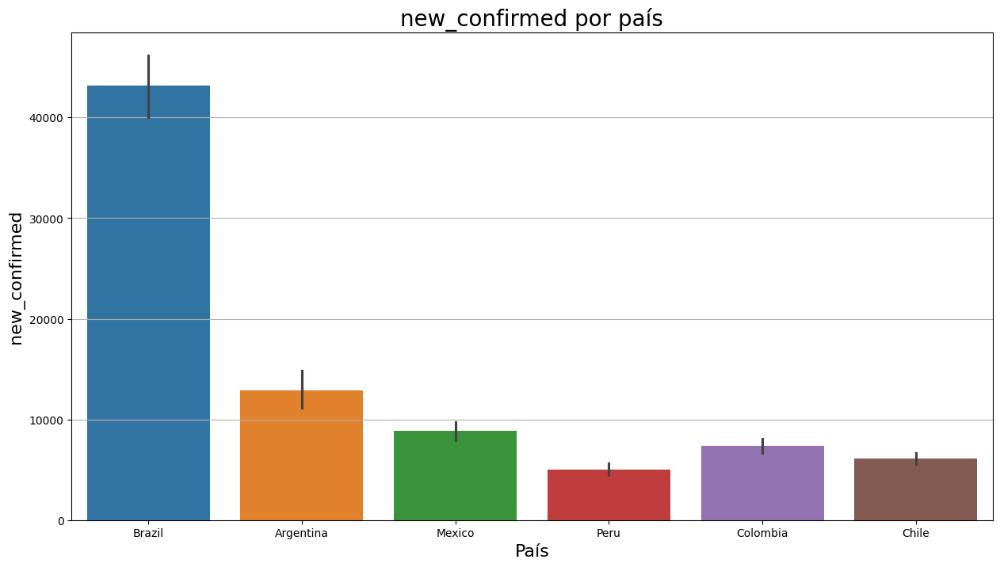

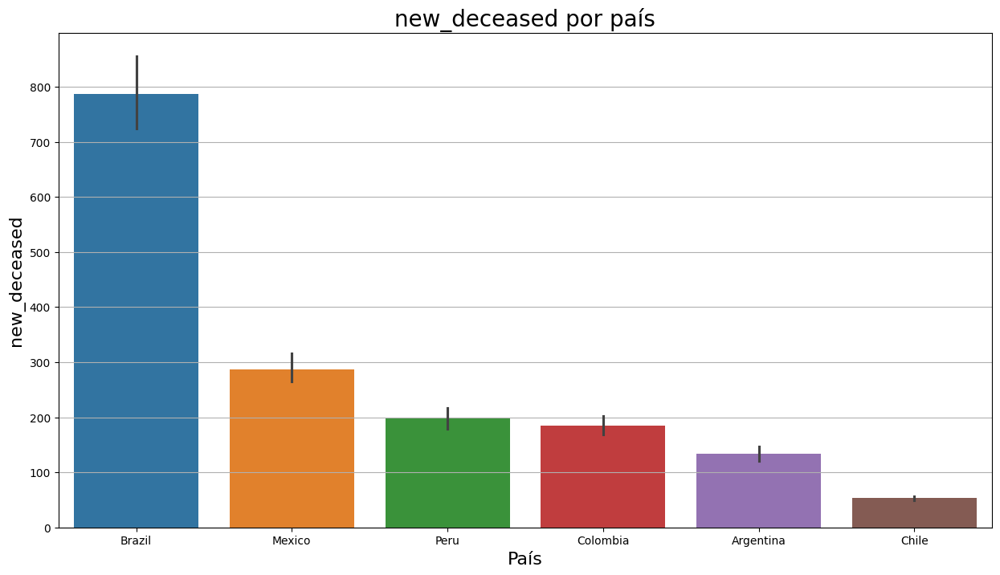

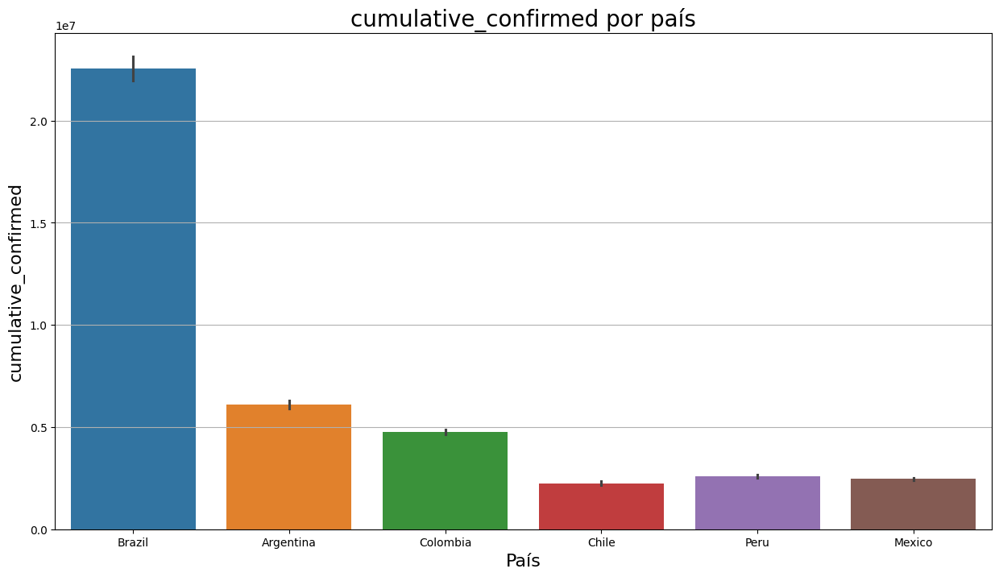

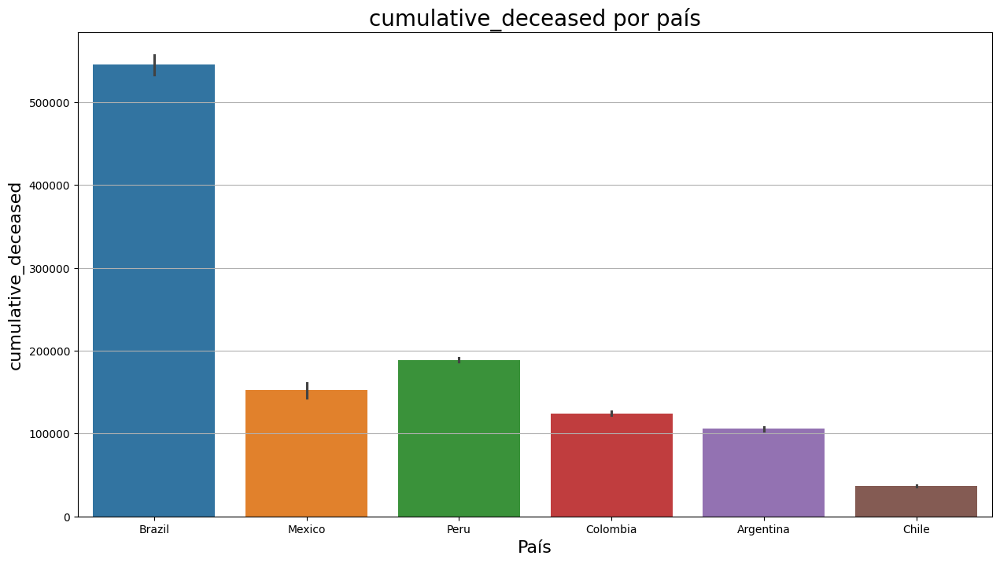

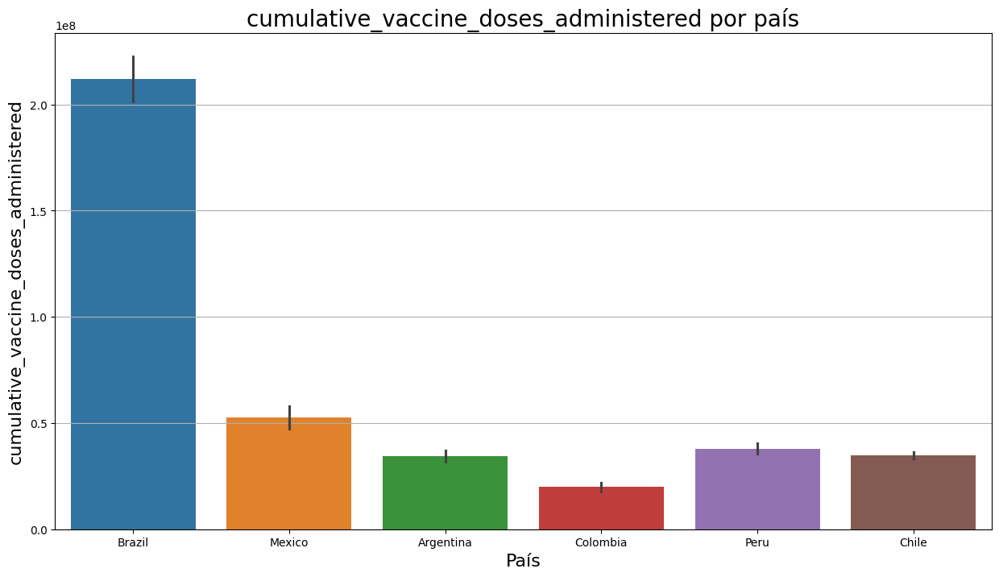

...

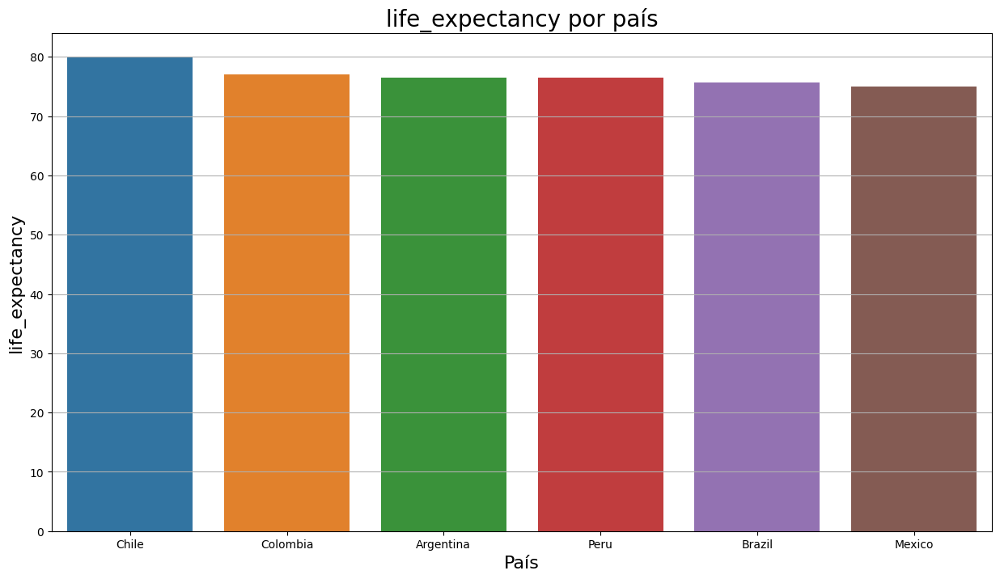

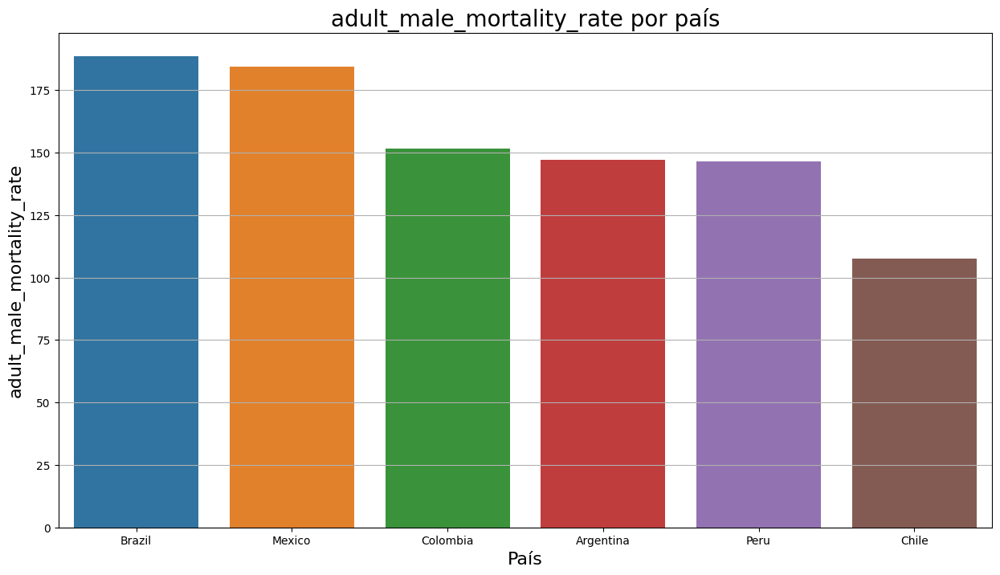

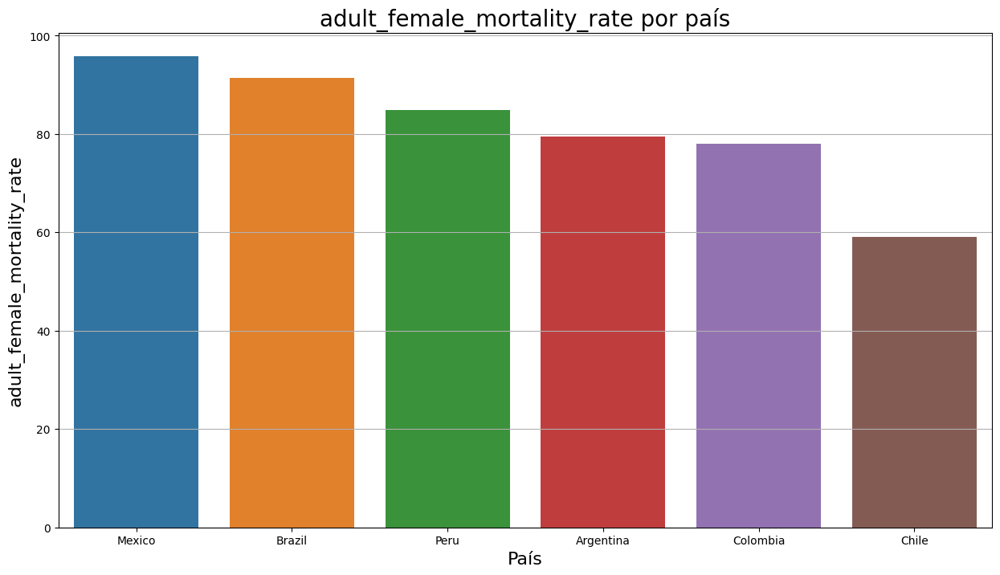

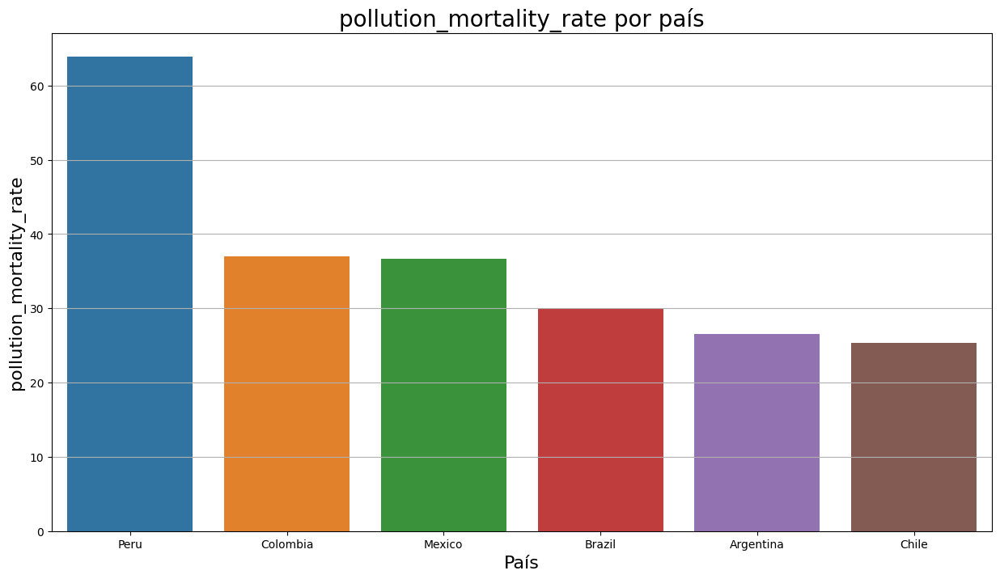

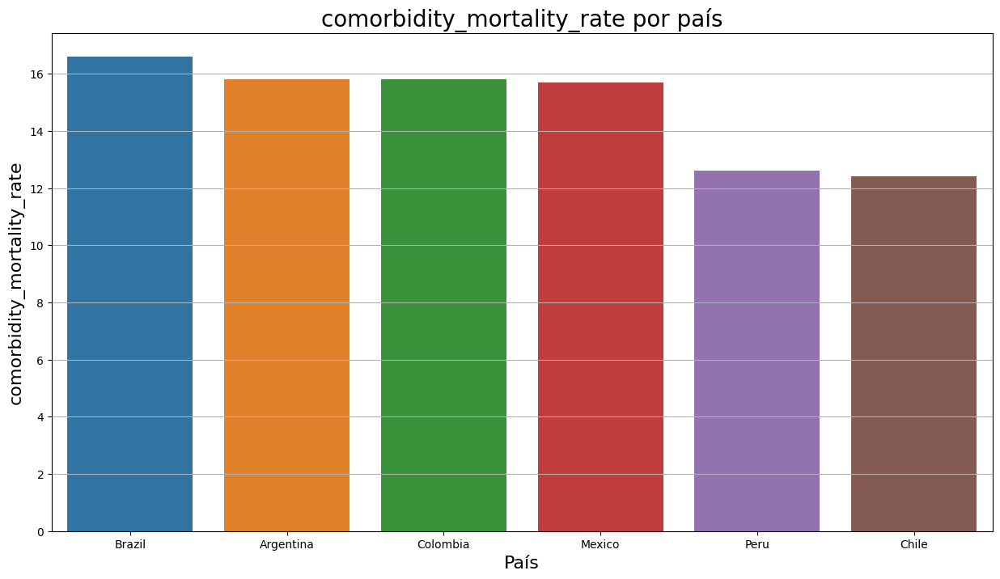

In [ ]:
# Este código genera gráficos de barras para cada columna en df_paises_covid que no está en la lista de columnas excluidas.
# Cada gráfico muestra los valores de la columna para cada país.

# Se define la lista de columnas a excluir
excluded_columns = ['location_key','date','country_code','country_name','latitude',
                    'longitude','cumulative_recovered','new_recovered']

# Se itera sobre cada columna en df_paises_covid
for column in df_paises_covid.columns:
    # Se verifica si la columna actual no está en la lista de columnas excluidas
    if column not in excluded_columns:
        # Se crea una nueva figura y un conjunto de subtramas con un tamaño específico
        fig, ax = plt.subplots(figsize=(15, 8))
        
        # Se ordena el DataFrame por la columna actual en orden descendente
        sorted_df = df_paises_covid.sort_values(by=column, ascending=False)
        
        # Se crea un gráfico de barras con 'country_name' en el eje x y la columna actual en el eje y
        sns.barplot(x='country_name', y=column, data=sorted_df, ax=ax, hue='country_name')
        
        # Se establece el título del gráfico como el nombre de la columna actual seguido de "por país"
        plt.title(f'{column} por país', fontsize=20)
        
        # Se ajusta el tamaño de la fuente de las etiquetas de los ejes
        plt.xlabel('País', fontsize=16)
        plt.ylabel(column, fontsize=16)
        
         # Se añade una cuadrícula en el eje Y para facilitar la lectura de los datos
        ax.yaxis.grid(True)
        
        # Se muestra el gráfico
        plt.show()

## 2. Matriz de Correlación, trata de crear una submascara para solo tomar una parte del gráfico y filtrar por los valores mayores a 0.5


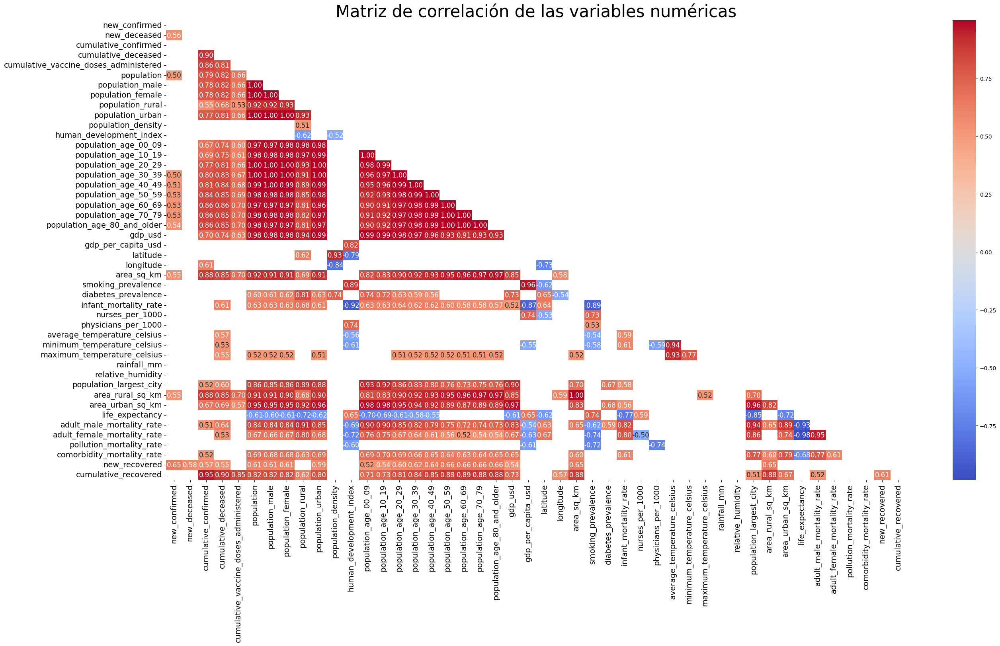

In [42]:
# Este código genera una gráfica de matriz de correlación para las variables numéricas en df_paises_covid.

# Se seleccionan las columnas numéricas en df_paises_covid
columnas_numericas = df_paises_covid.select_dtypes(include=['float64', 'int64']).columns

# Se calcula la matriz de correlación de las columnas numéricas
matriz_correlacion = df_paises_covid[columnas_numericas].corr()

# Se crea una máscara para el triángulo superior de la matriz de correlación
mask = np.triu(np.ones_like(matriz_correlacion, dtype=bool))

# Se filtran los valores de correlación que son absolutamente mayores que 0.5
matriz_correlacion = matriz_correlacion[abs(matriz_correlacion) > abs(0.5)]

# Se crea una nueva figura con un tamaño específico
plt.figure(figsize=(30, 15))

# Se crea una gráfica de mapa de calor usando seaborn
heatmap = sns.heatmap(
    matriz_correlacion, 
    mask=mask, 
    annot=True, 
    cmap='coolwarm', 
    fmt=".2f", 
    annot_kws={"size": 12}  # Se ajusta el tamaño de la fuente de las anotaciones
)

# Se ajusta el tamaño de la fuente de las etiquetas de los ejes
heatmap.set_xticklabels(heatmap.get_xmajorticklabels(), fontsize = 14)
heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize = 14)

# Se establece el título de la gráfica
plt.title('Matriz de correlación de las variables numéricas', fontsize=30)

# Se muestra la gráfica
plt.show()

En la grafica anterior se presentan las variables con mayor correlacion, para identificarlas mas rapido, se definio un umbral cuyo valor absoluto sea mayor a 0.5 y se graficaron en un heatmap.

Ya teniendo una idea de las variales que tienen mayor correlacion, podria hacer un analisis mas detallado de estas variables , esto se podria hacer en una analisis posterrior y una toma de decisiones para la creacion de un modelo ML.

Sin embargo podemos proceder a realizar una rapida revision grafica de la gran mayoria de las columnas para ver como se comportan los datos, para esta primera aproximacion vamos a utilizar un ciclo for y la libreria seaborn


## 3. Histogramas de las variables que "Si" tenga cambios de valores

Ahora repetimos el proceson con un ciclo for para realizar histogramas para ver la distribucion de algunos de los datos

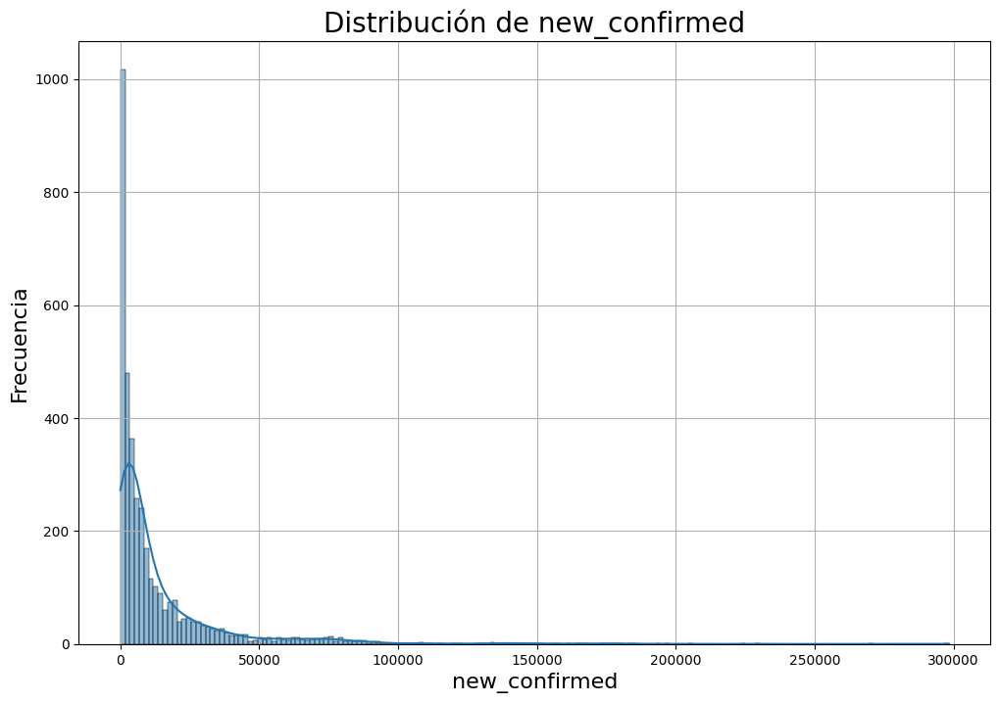

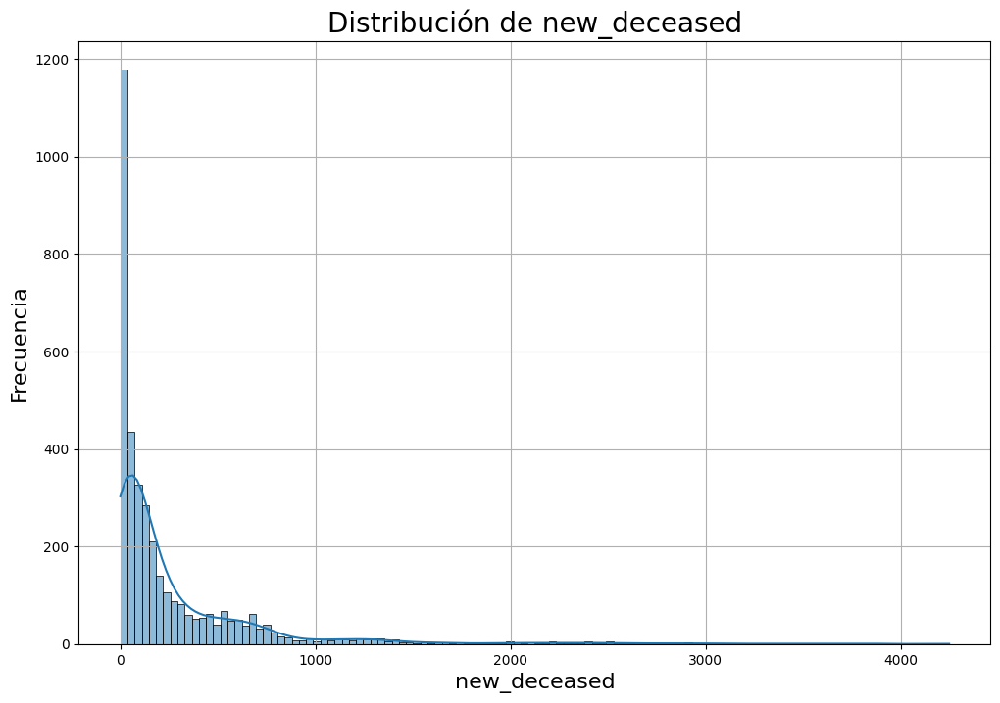

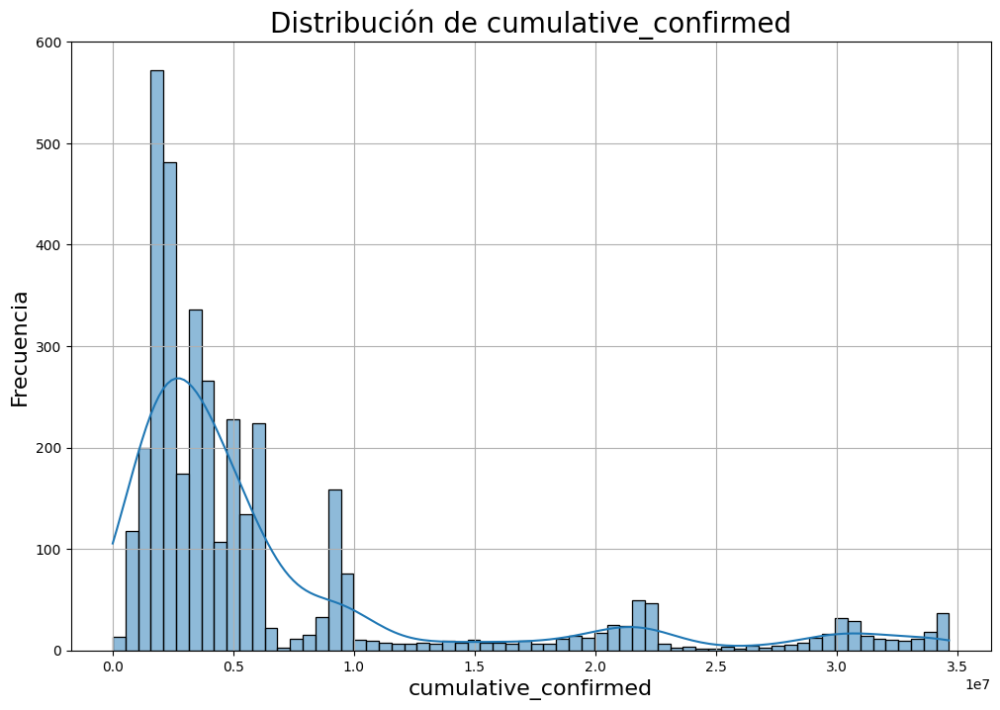

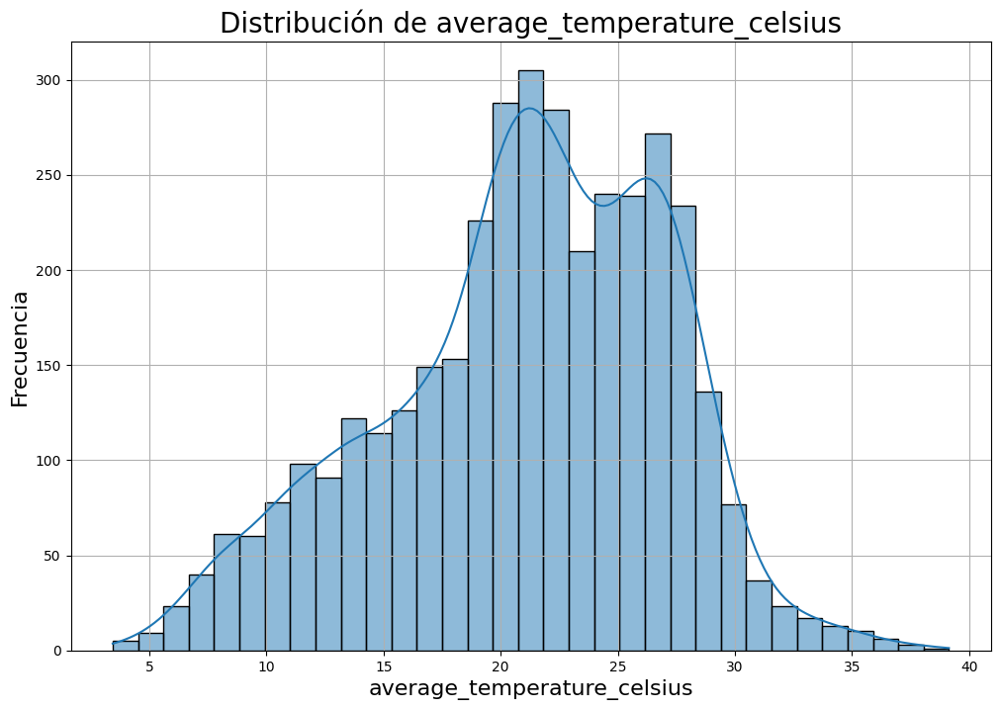

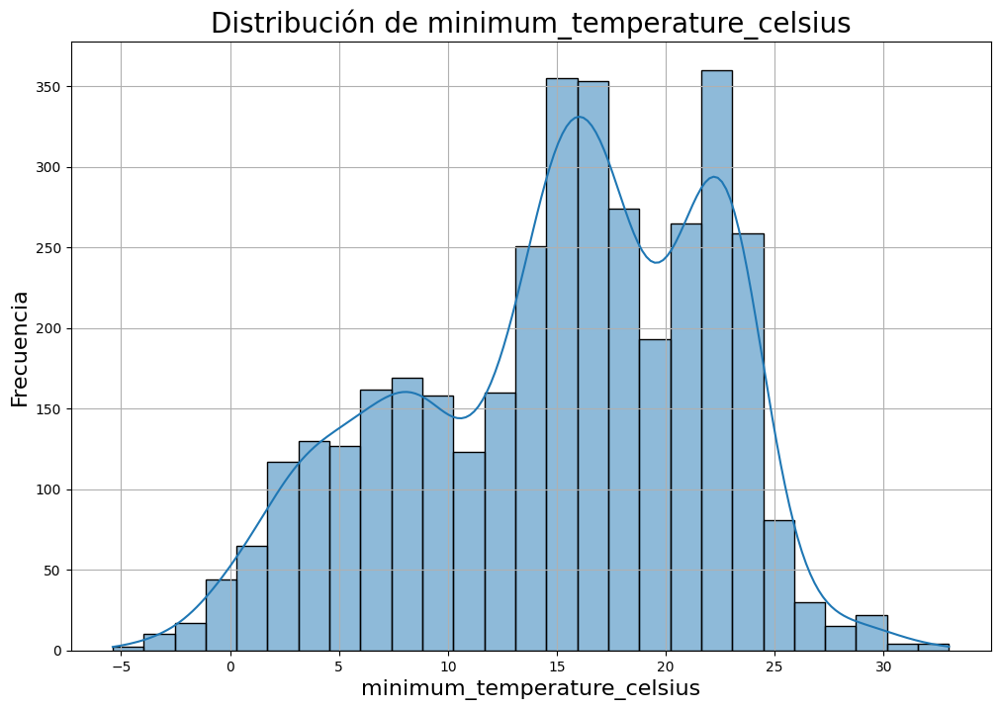

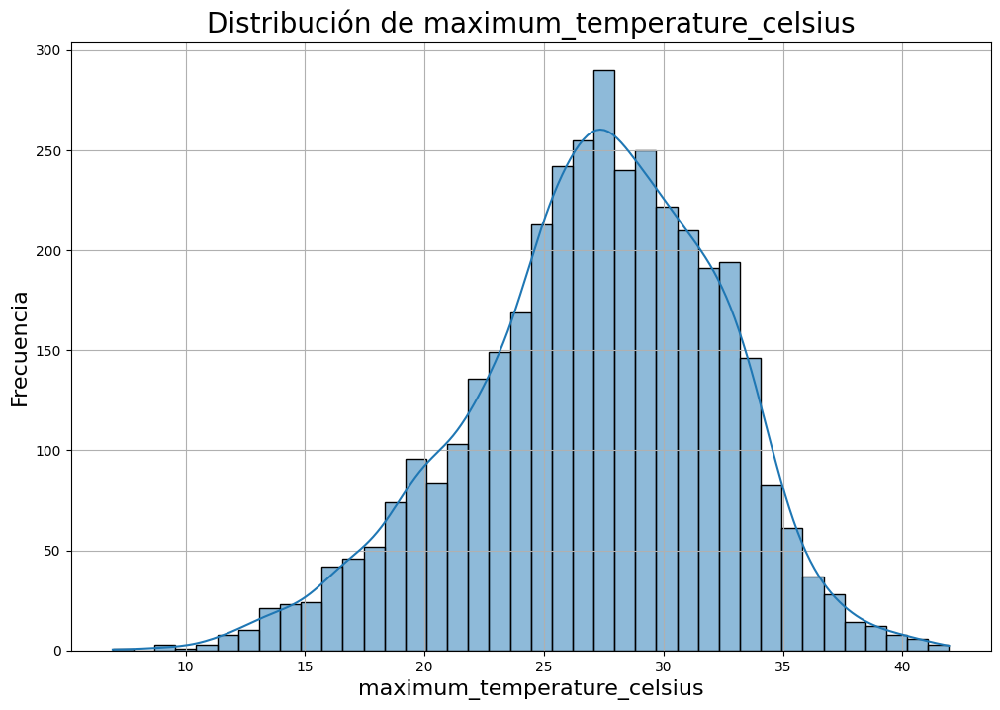

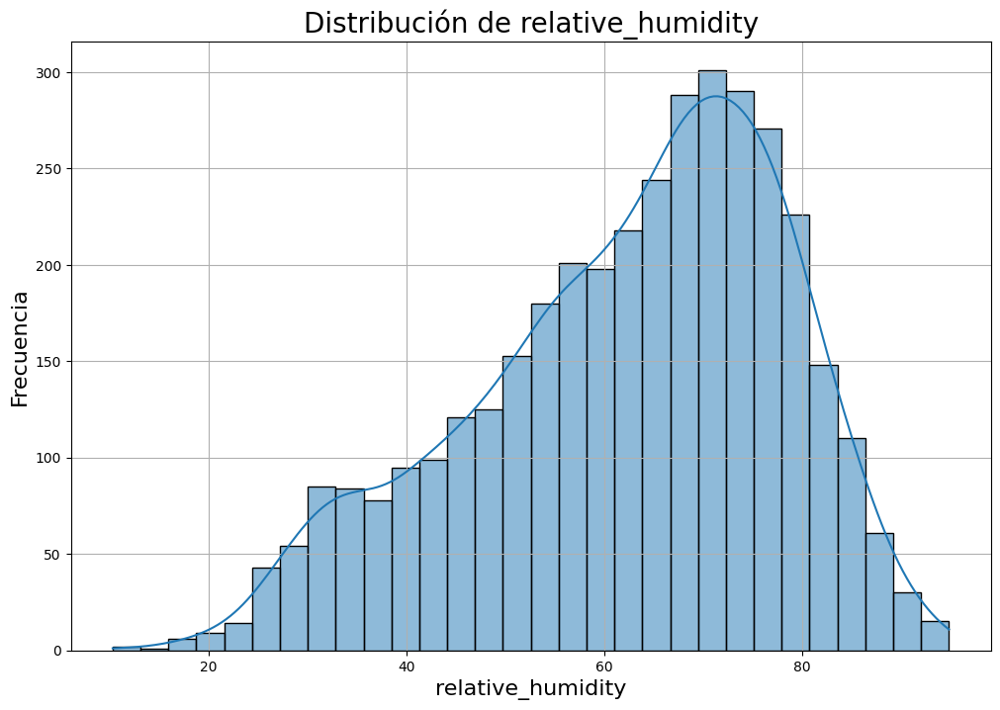

In [43]:
# Se seleccionan las columnas para el estudio
lista_columnas=['new_confirmed','new_deceased','cumulative_confirmed','cumulative_deceases',
                'cumulative_vaccine_doses_administrated','average_temperature_celsius','minimum_temperature_celsius',
                'maximum_temperature_celsius','relative_humidity']

# Se itera sobre cada columna en df_paises_covid
for i in df_paises_covid:
    # Se verifica si la columna actual está en la lista de columnas seleccionadas
    if i in lista_columnas:
        # Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
        fig, ax = plt.subplots(figsize=(12,8))
        # Se crea un histograma con la columna actual
        sns.histplot(df_paises_covid[i], kde=True)
        # Se añade una cuadrícula
        plt.grid(True)
        # Se establece el título del gráfico como el nombre de la columna actual con un tamaño de fuente mayor
        plt.title('Distribución de ' + i, fontsize=20)
        # Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
        plt.xlabel(i, fontsize=16)
        plt.ylabel('Frecuencia', fontsize=16)
        # Se muestra el gráfico
        plt.show()

## 4. Diagrama de dispersión de la temperatura media contra los casos confirmados

Procedemos a realizar un analisis enfocados en algunas variables especificas, en ese vaso vam a analizar la variable de average_temperature y la variable new_confirmed, con el fin de tratar de entender el compotamiento de los casos respecto a la temperatura

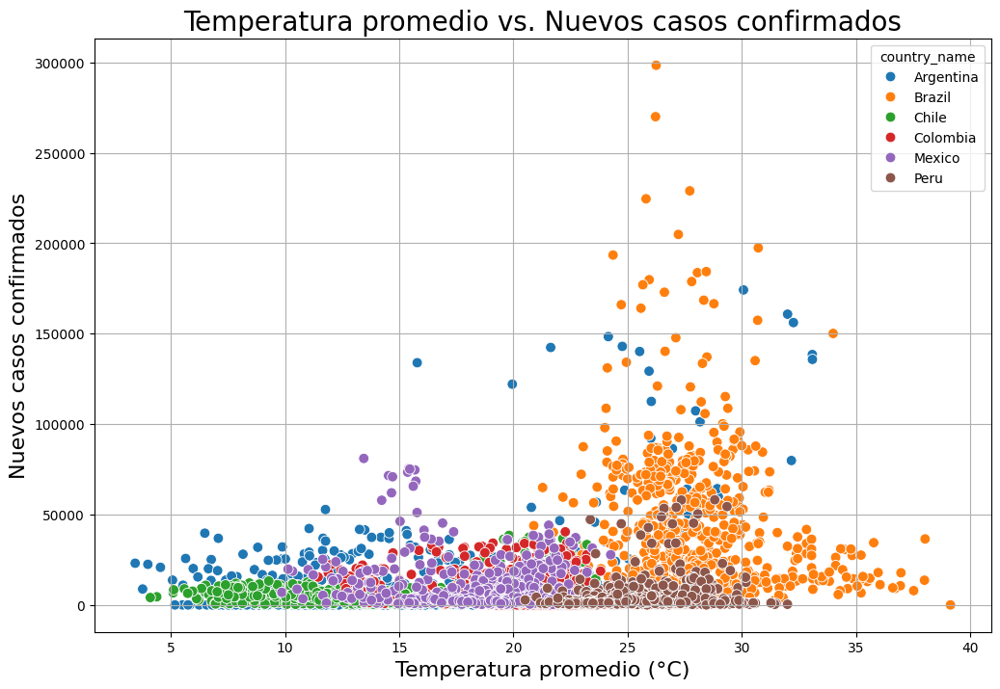

In [44]:
# Este código genera un gráfico de dispersión de 'average_temperature_celsius' vs 'new_confirmed' en el DataFrame df_paises_covid.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
fig, ax = plt.subplots(figsize=(12,8))

# Se crea un gráfico de dispersión con 'average_temperature_celsius' en el eje x y 'new_confirmed' en el eje y
# Se utiliza 'country_name' como leyenda (hue) y se ajusta el tamaño de los puntos (s)
sns.scatterplot(x='average_temperature_celsius', y='new_confirmed', data=df_paises_covid, hue='country_name', s=60)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico como 'Temperatura promedio vs. Nuevos casos confirmados' con un tamaño de fuente mayor
plt.title('Temperatura promedio vs. Nuevos casos confirmados', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Temperatura promedio (°C)', fontsize=16)
plt.ylabel('Nuevos casos confirmados', fontsize=16)

# Se muestra el gráfico
plt.show()

Procedemos a realizar un analiss enfocados en algunas variables especificas, en ese vaso vam a analizar la variable de average_temperature y la variable new_confirmed, con el fin de tratar de entender el compotamiento de los casos respecto a la temperatura

Se ha podido observar que en elgunos paises la temperatura no influye en la cantidad de casos confirmados, sin embargo en otros paises si se puede observar una relacion entre temperaura y la cantidad de casos confirmados


## 5. Diagrama de dispersión de la temperatura media contra las muertes confirmadas


Ahora veremos la relacion de la temperatura con la cantidad de muertes

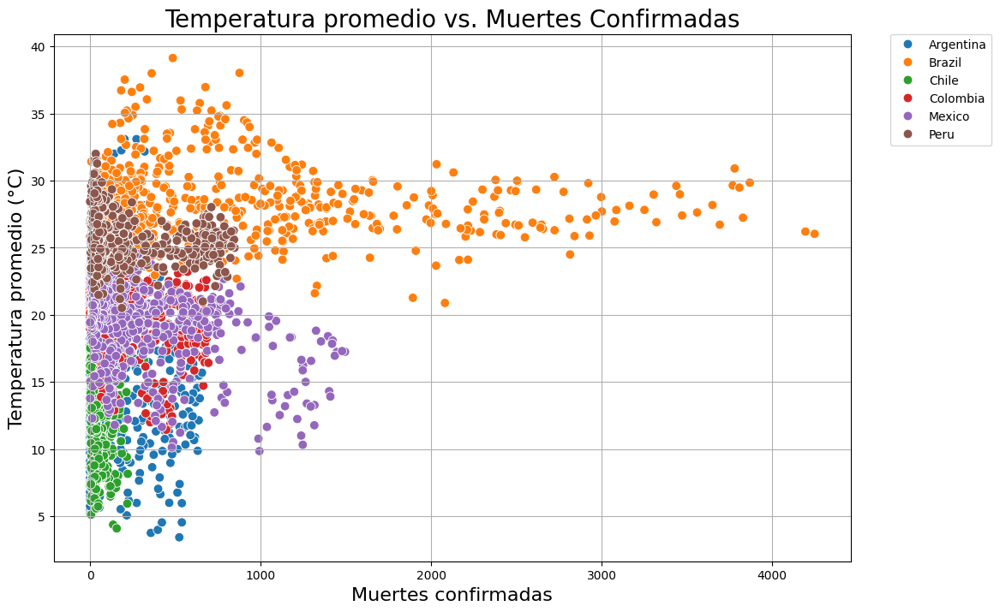

In [45]:
# Este código genera un gráfico de dispersión de 'average_temperature_celsius' vs 'new_deceased' en el DataFrame df_paises_covid.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
fig, ax = plt.subplots(figsize=(12,8))

# Se crea un gráfico de dispersión con 'average_temperature_celsius' en el eje y y 'new_deceased' en el eje x
# Se utiliza 'country_name' como leyenda (hue) y se ajusta el tamaño de los puntos (s)
sns.scatterplot(y='average_temperature_celsius', x='new_deceased', data=df_paises_covid, hue='country_name', s=60)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico como 'Temperatura promedio vs. Nuevos fallecimientos' con un tamaño de fuente mayor
plt.title('Temperatura promedio vs. Muertes Confirmadas', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Muertes confirmadas', fontsize=16)
plt.ylabel('Temperatura promedio (°C)', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Se muestra el gráfico
plt.show()

En la grafica anterior se ve un comportamiento similar al de los casos confirmados, en algunos paises la temperatura no influye en la cantidad de muertes, sin embargo en otros paises si se puede observar una relacion entre la temperatura y la cantidad de muertes.



## 6. Comportamiento de las dosis administradas de todos los paises (valor medio)


Ahora si veamos como se comportan las variables en un estudio a lo largo del tiempo

Por lo tanto, se hace una primera aproximacion y observaremos las dosis administradas por mes en todos los paises

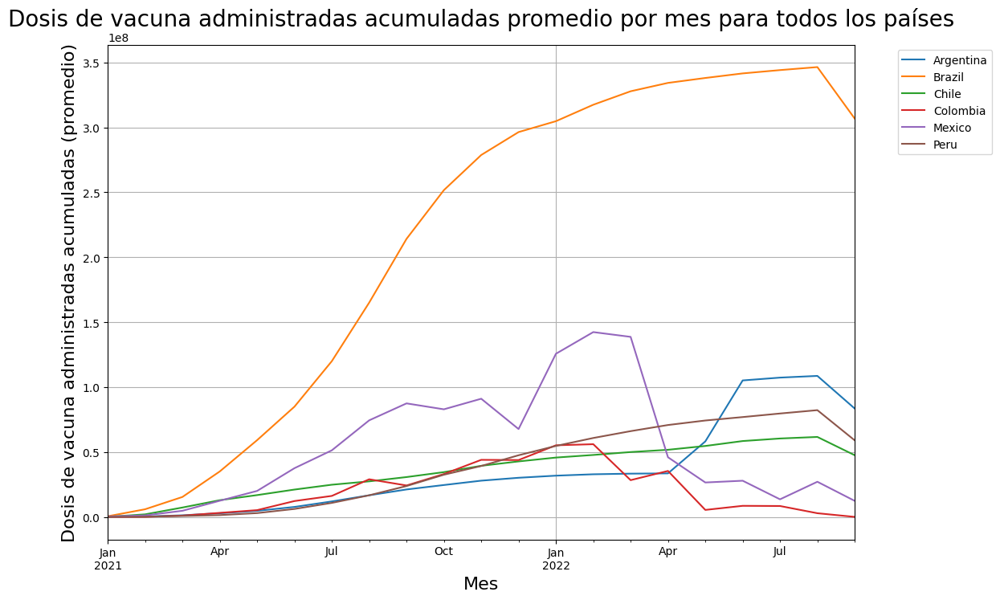

In [46]:
# Este código genera un gráfico de línea que muestra los valores medios mensuales de 'cumulative_vaccine_doses_administered' para cada país.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
fig, ax = plt.subplots(figsize=(12,8))

# Se agrupan los datos por 'country_name'
grouped = df_paises_covid.groupby('country_name')

# Se itera sobre cada grupo
for name, group in grouped:
    # Se calcula el valor medio mensual de 'cumulative_vaccine_doses_administered' y se genera un gráfico de línea
    # Se cambia el color y el estilo de la línea para que sea más visible
    group.resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot(label=name)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico como 'Dosis de vacuna administradas acumuladas promedio por mes para todos los países' 
plt.title('Dosis de vacuna administradas acumuladas promedio por mes para todos los países', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Dosis de vacuna administradas acumuladas (promedio)', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

## 7. Evolución de dosis administradas por mes de cada país

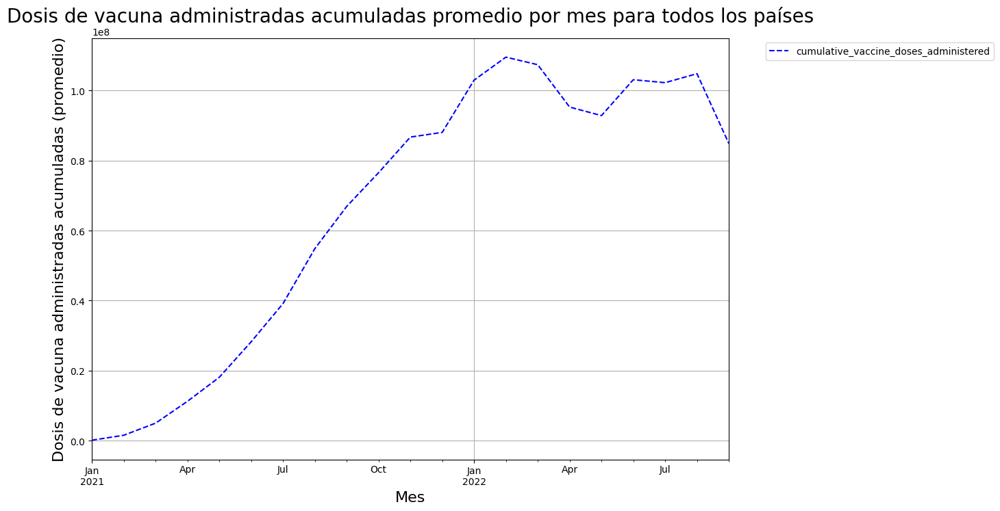

In [47]:
# Este código genera un gráfico de línea que muestra los valores medios mensuales de 'cumulative_vaccine_doses_administered' para todos los países.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
fig, ax = plt.subplots(figsize=(12,8))

# Se calcula el valor medio mensual de 'cumulative_vaccine_doses_administered' y se genera un gráfico de línea
# Se cambia el color y el estilo de la línea para que sea más visible
df_paises_covid.resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot(color='blue', linestyle='--')

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico como 'Dosis de vacuna administradas acumuladas promedio por mes para todos los países' con un tamaño de fuente mayor
plt.title('Dosis de vacuna administradas acumuladas promedio por mes para todos los países', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Dosis de vacuna administradas acumuladas (promedio)', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

En la anterior grafica se puede observar que la cantidad de dosis administradas en los paises ha ido aumentando a lo largo del tiempo, recordemos que es un analisis general y no se ha hecho un analiss detallado

Como la anterior grafica no nos da mucha informacion, vamos a realizar un analisis mas detallado de las dosis acumuladas por mes en cada pais

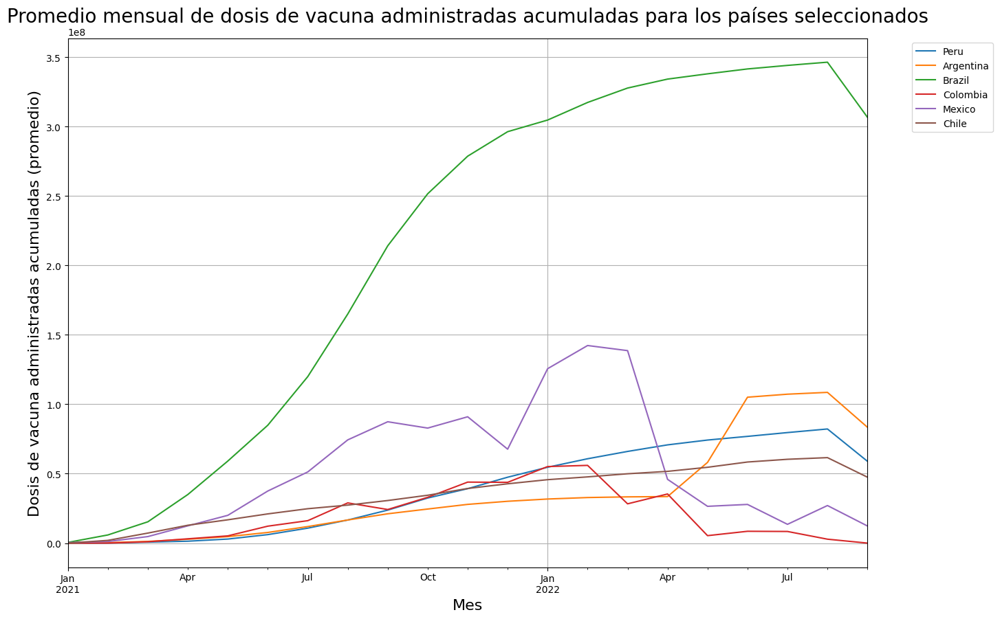

In [48]:
# Este código genera un gráfico de línea que muestra los valores promedios mensuales de 'cumulative_vaccine_doses_administered' para cada país seleccionado.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
fig, ax = plt.subplots(figsize=(15,10))

# Se itera sobre cada país seleccionado
for pais in paises_seleccionados:
    # Se seleccionan los datos para el país actual
    data_pais = df_paises_covid[df_paises_covid['country_name']==pais]
    # Se calcula el valor promedio de 'cumulative_vaccine_doses_administered' de cada mes y se genera un gráfico de línea
    data_pais.resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot(label=pais, linewidth=2.5)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico como 'Promedio mensual de dosis de vacuna administradas acumuladas para los países seleccionados'
plt.title('Promedio mensual de dosis de vacuna administradas acumuladas para los países seleccionados', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Dosis de vacuna administradas acumuladas (promedio)', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

Si realizamos un analisis mas detallado de las dosis administradas por mes en cada pais, podemos observar que en algunos paises la cantidad de dossis administradas ha ido aumentando a lo largo del tiempo, sin embargo en otros paises la cantidad de dosis administradas ha ido disminuyendo. Esto puede ser debido a muchos factores, como la cantidad de vacunas disponibles, la cantidad de personas que se han vacunados, entre otros.

## 8. Muertes por mes de cada país

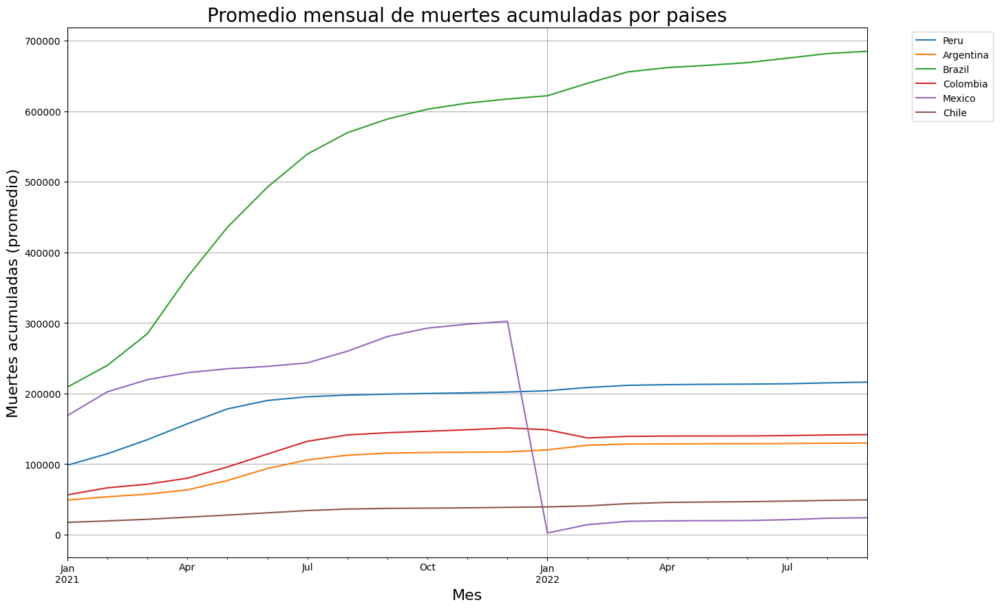

In [49]:
# Este código genera un gráfico de línea que muestra los valores promedios mensuales de 'cumulative_deceased' para cada país seleccionado.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño más grande
fig, ax = plt.subplots(figsize=(15,10))

# Se itera sobre cada país seleccionado
for pais in paises_seleccionados:
    # Se seleccionan los datos para el país actual
    data_pais = df_paises_covid[df_paises_covid['country_name']==pais]
    # Se calcula el valor promedio de 'cumulative_deceased' de cada mes y se genera un gráfico de línea
    data_pais.resample('ME').mean(numeric_only=True)['cumulative_deceased'].plot(label=pais)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico como 'Promedio mensual de muertes acumuladas para los países seleccionados' con un tamaño de fuente mayor
plt.title('Promedio mensual de muertes acumuladas por paises', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Muertes acumuladas (promedio)', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

El pais que mas muertes a tenido es Brasil, seguido de Mexico, Peru, Colombia, Argentina y Chile. Sin embargo, esto no quiere decir que estos paises sean los que peor han manejado la pandemia, ya que ha hay que tener en cuenta la cantidad de habitantes de cada pais ademas de otros factores y cantidad de datos que tenemos.
La disminucion de casos en Mexico puede ser una perdida datos

## 9. Casos confirmados por mes de cada país

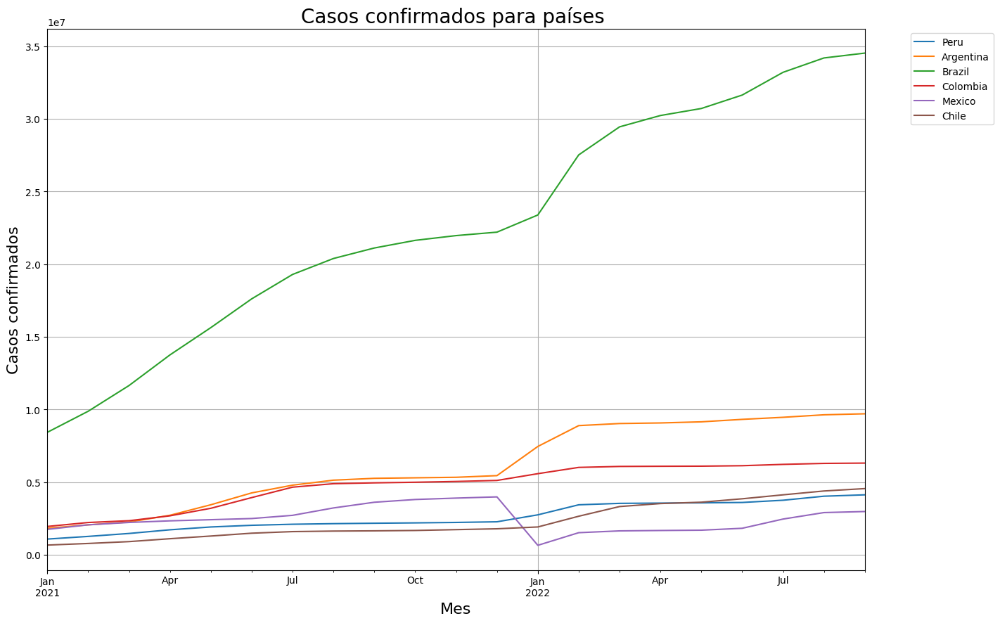

In [50]:
# Este código genera un gráfico de línea que muestra los valores promedios mensuales de 'cumulative_confirmed' para cada país.

# Se crea una nueva figura y un conjunto de subtramas 
fig, ax = plt.subplots(figsize=(15,10))

# Se itera sobre cada país seleccionado
for pais in paises_seleccionados:
    # Se seleccionan los datos para el país actual
    data_pais = df_paises_covid[df_paises_covid['country_name']==pais]
    # Se calcula el valor promedio de 'cumulative_confirmed' de cada mes y se genera un gráfico de línea
    data_pais.resample('ME').mean(numeric_only=True)['cumulative_confirmed'].plot(label=pais)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico 
plt.title('Casos confirmados para países ', fontsize=20)

# Se añaden etiquetas a los ejes x e y 
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Casos confirmados', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

## 10. Recuperaciones de casos por mes de cada país

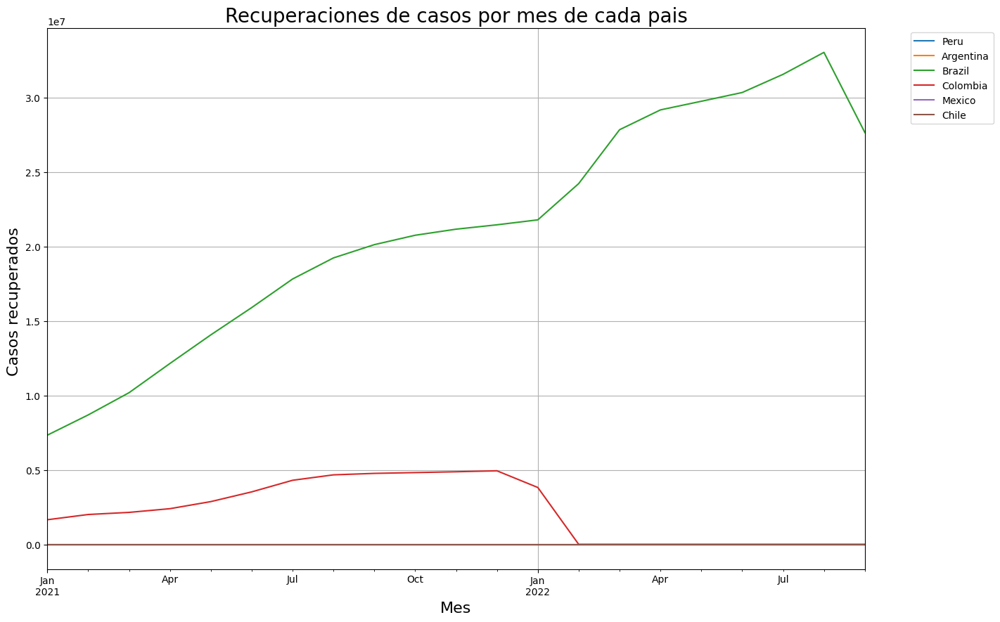

In [51]:
# Este código genera un gráfico de línea que muestra los valores promedios mensuales de 'cumulative_recovered' para cada país seleccionado.

# Se crea una nueva figura y un conjunto de subtramas
fig, ax = plt.subplots(figsize=(15,10))

# Se itera sobre cada país seleccionado
for pais in paises_seleccionados:
    # Se seleccionan los datos para el país actual
    data_pais = df_paises_covid[df_paises_covid['country_name']==pais]
    # Se calcula el valor promedio de 'cumulative_recovered' de cada mes y se genera un gráfico de línea
    data_pais.resample('ME').mean(numeric_only=True)['cumulative_recovered'].plot(label=pais)

# Se añade una cuadrícula
plt.grid(True)

# Se establece el título del gráfico 
plt.title('Recuperaciones de casos por mes de cada pais', fontsize=20)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Casos recuperados ', fontsize=16)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

Solo existen datos para Brasil, los otros paises estan con datos en 0 y Colombia tiene algunos datos pero faltan muchos meses para poder hacer un analisis completo en ese pa+is, por lo que solo se puede realizar algun análisis con Brasil

## 11. Comparación de número de casos nuevos entre paises

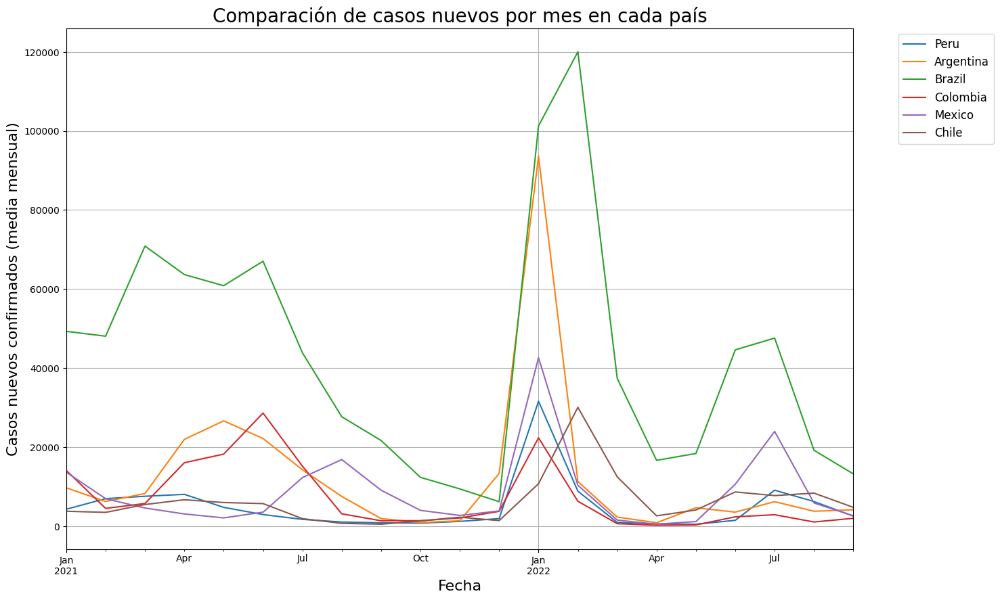

In [52]:
# Este código genera un gráfico de líneas que muestra la media mensual de los casos nuevos confirmados de COVID-19 para cada país seleccionado.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño específico
fig, ax = plt.subplots(figsize=(15, 10))

# Se itera sobre cada país en la lista de países seleccionados
for pais in paises_seleccionados:
    # Se seleccionan los datos para el país actual, se resamplan a una frecuencia mensual y se calcula la media de los casos nuevos confirmados
    # Luego, se genera un gráfico de líneas para estos datos
    df_paises_covid[df_paises_covid['country_name']==pais].resample('ME').mean(numeric_only=True)['new_confirmed'].plot(ax=ax)

# Se establece el título del gráfico
plt.title('Comparación de casos nuevos por mes en cada país', fontsize=20)

# Se añaden etiquetas a los ejes x e y
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Casos nuevos confirmados (media mensual)', fontsize=16)

# Se añade una cuadrícula
plt.grid(True)

# Se ajusta la posición de la leyenda y se añaden los nombres de los países
plt.legend(paises_seleccionados, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Se muestra el gráfico
plt.show()

## 12. Dosis acumuladas por país

<Figure size 2000x1500 with 0 Axes>

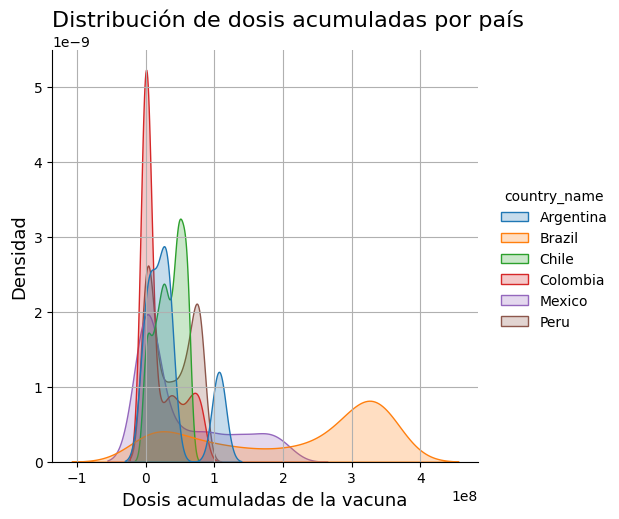

In [53]:
# Este código genera un gráfico de densidad que muestra la distribución de las dosis acumuladas de la vacuna COVID-19 para cada país.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño específico
plt.figure(figsize=(20, 15))

# Se genera un gráfico de densidad con 'cumulative_vaccine_doses_administered' en el eje x y 'country_name' como la variable de agrupación
sns.displot(df_paises_covid, x="cumulative_vaccine_doses_administered", hue="country_name", kind="kde", fill=True)

# Se establece el título del gráfico
plt.title('Distribución de dosis acumuladas por país', fontsize=16,loc='left')

# Se añaden etiquetas a los ejes x e y
plt.xlabel('Dosis acumuladas de la vacuna', fontsize=13)
plt.ylabel('Densidad', fontsize=13)

# Se añade una cuadrícula
plt.grid(True)

# Se ajusta la posición de la leyenda y se añaden los nombres de los países
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Se muestra el gráfico
plt.show()

## 13. Bloxplot de temperatura media de cada país

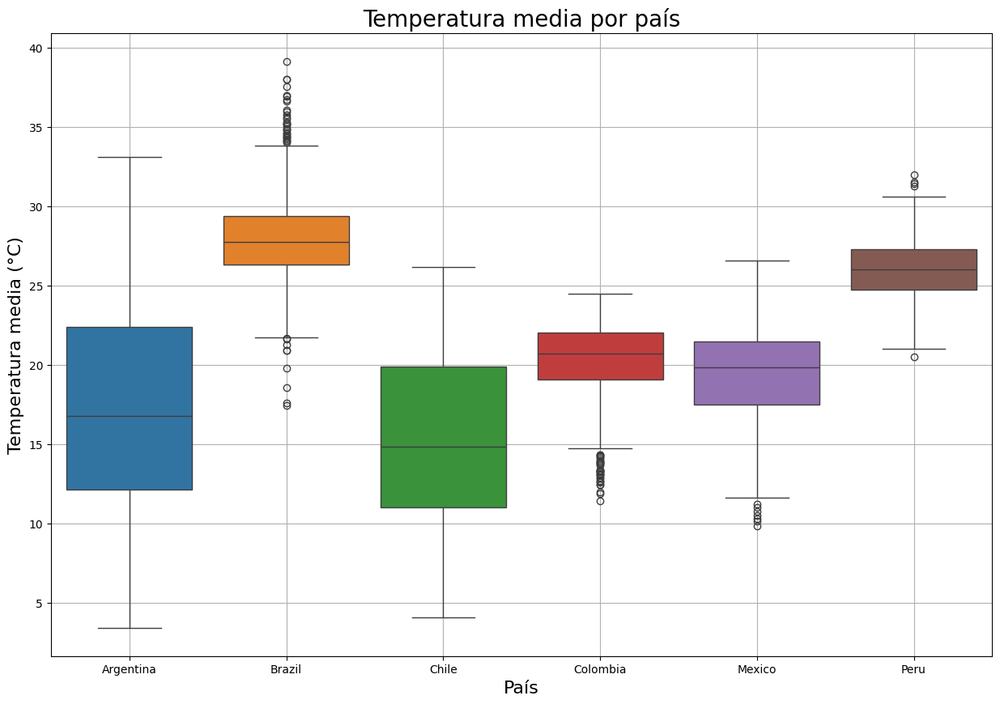

In [54]:
# Este código genera un boxplot que muestra la distribución de la temperatura media en Celsius para cada país.

# Se crea una nueva figura y un conjunto de subtramas con un tamaño específico
fig, ax = plt.subplots(figsize=(15, 10))

# Se genera un boxplot con 'country_name' en el eje x y 'average_temperature_celsius' en el eje y
sns.boxplot(x='country_name', y='average_temperature_celsius', data=df_paises_covid, hue='country_name')

# Se establece el título del gráfico
plt.title('Temperatura media por país', fontsize=20)

# Se añaden etiquetas a los ejes x e y
plt.xlabel('País', fontsize=16)
plt.ylabel('Temperatura media (°C)', fontsize=16)

# Se añade una cuadrícula
plt.grid(True)

# Se muestra el gráfico
plt.show()

## 14. Violinplot de las variables que "Si" tenga cambios de valores

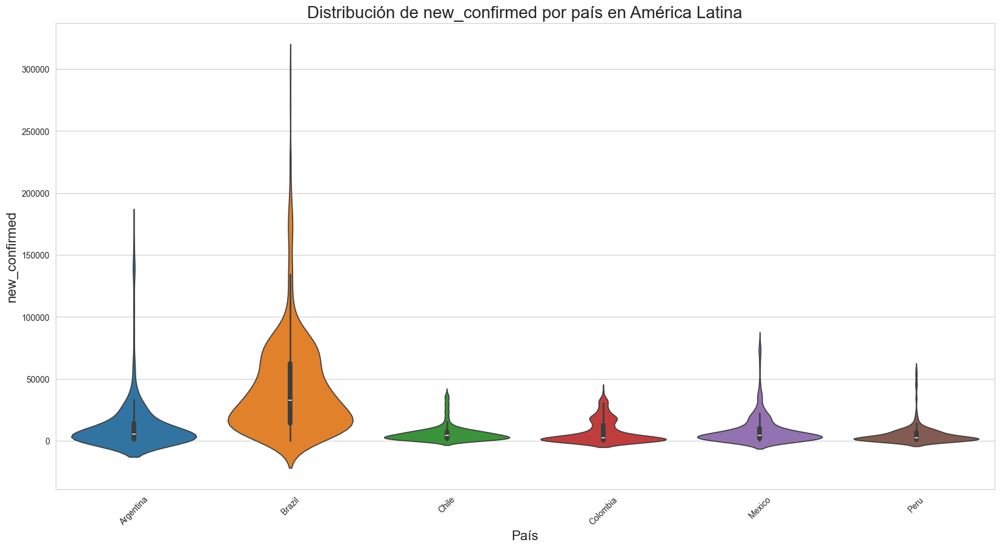

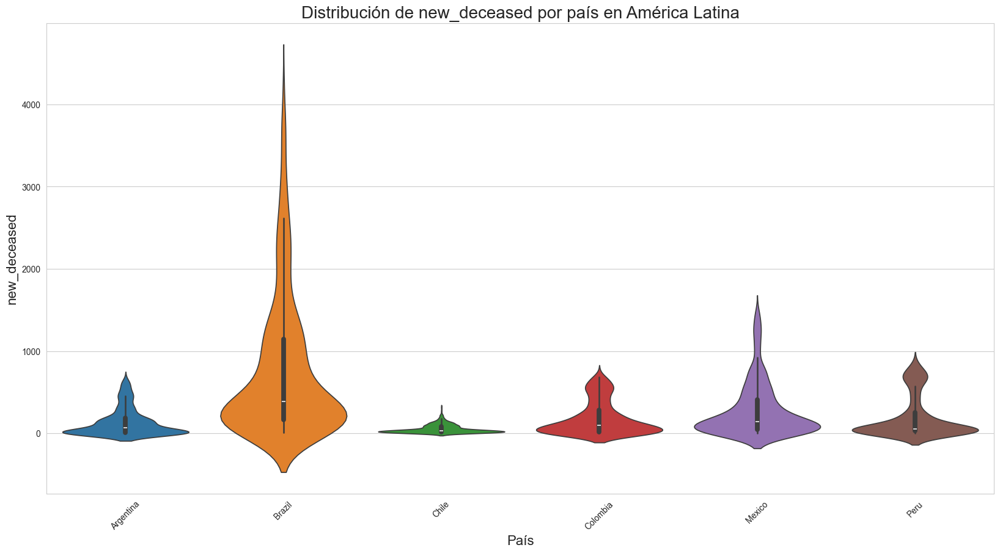

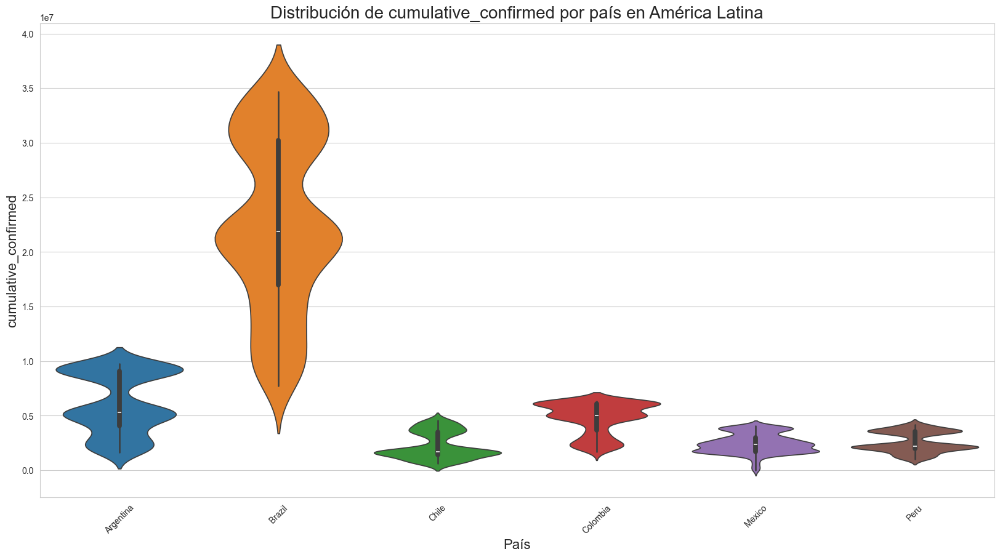

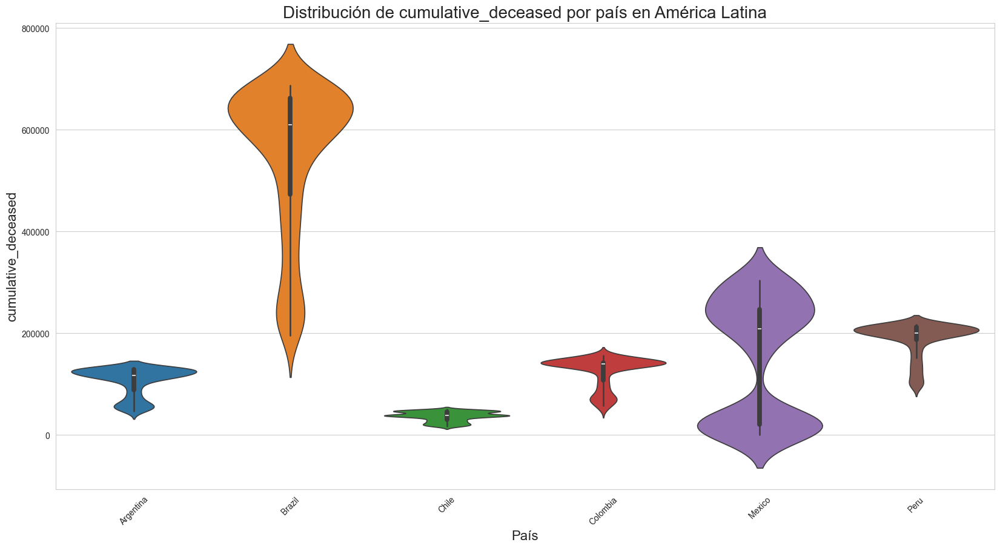

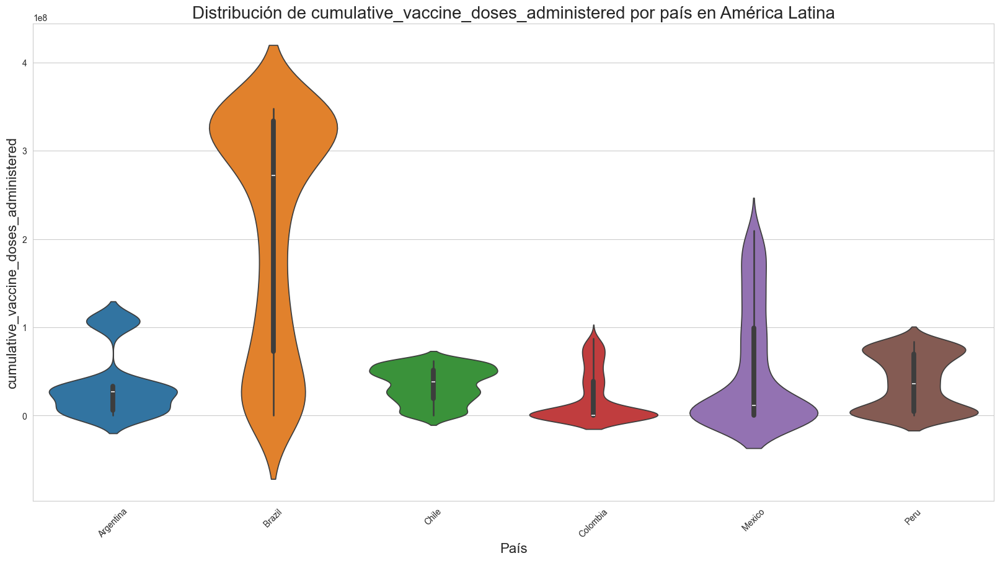

...

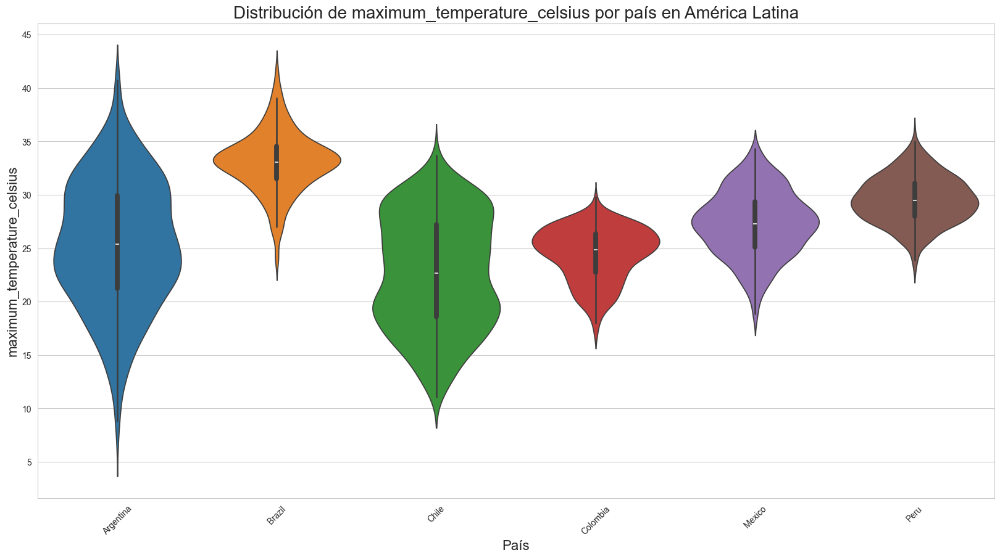

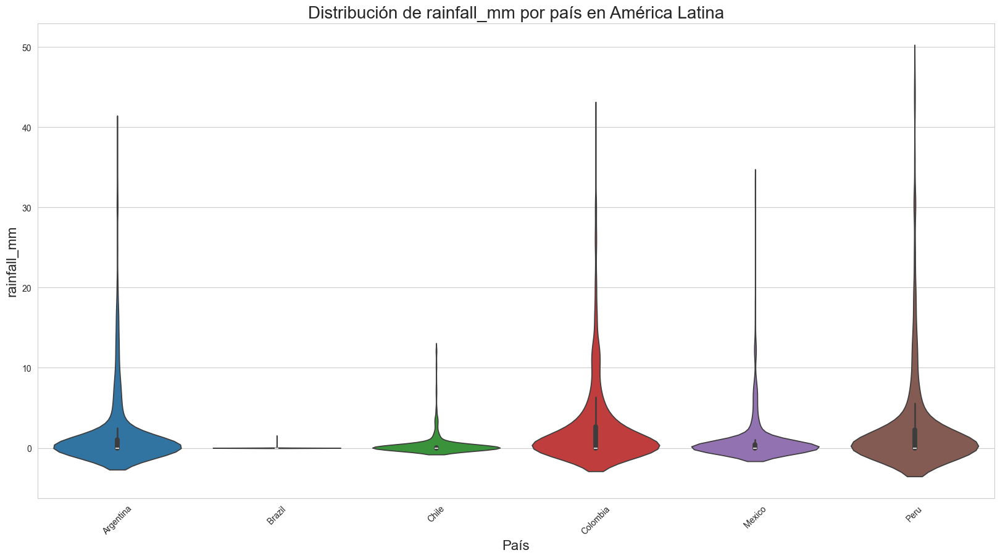

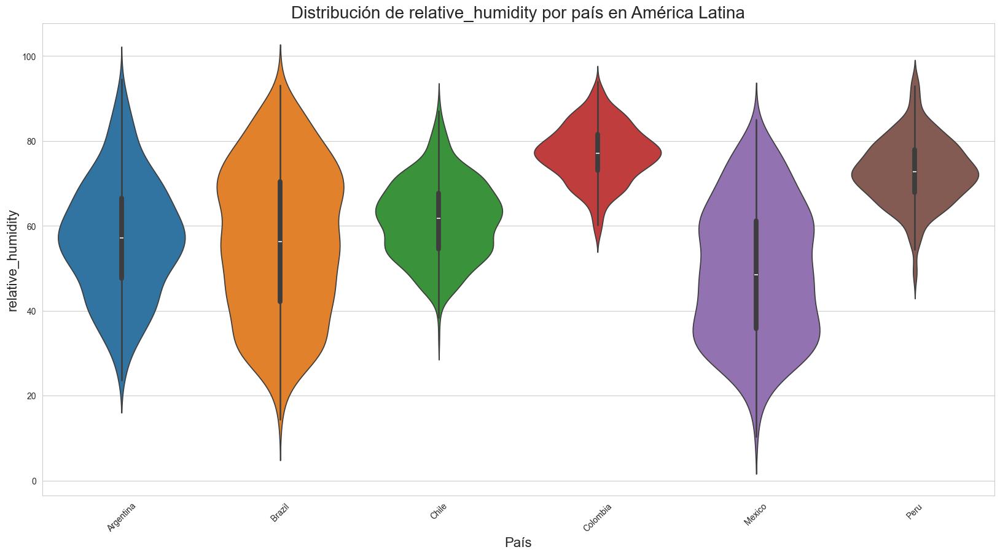

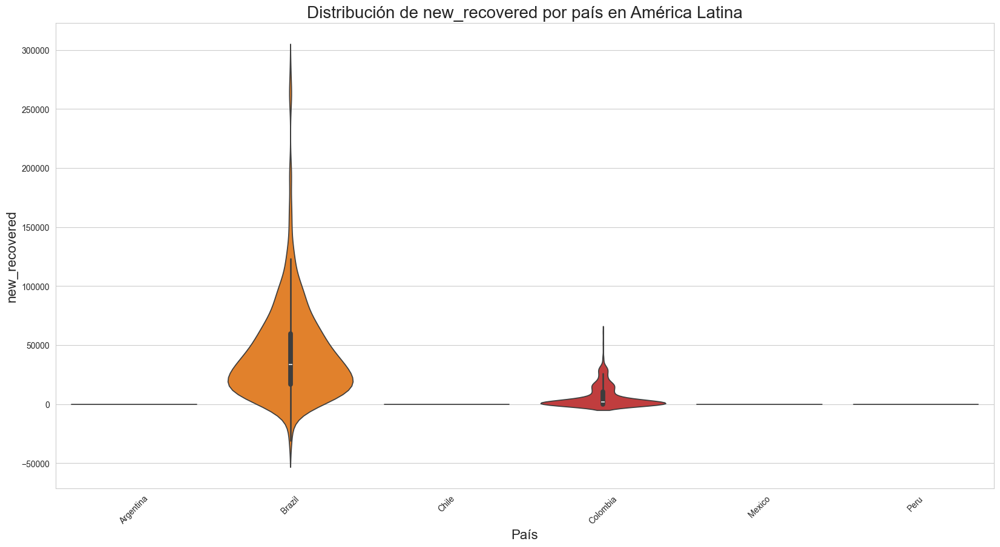

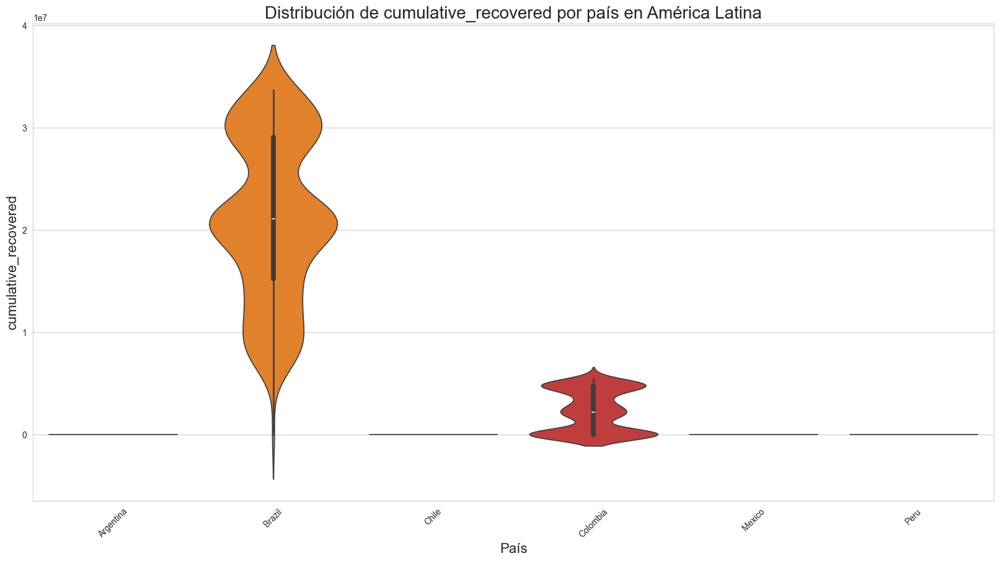

In [55]:


# Configuramos el estilo de Seaborn para mejorar la estética del gráfico
sns.set_style("whitegrid")

# Creamos una lista para almacenar las columnas con más de 6 valores únicos
columnas_mayores = []

# Iteramos sobre todas las columnas del DataFrame
for i in df_paises_covid.columns:
    # Excluimos las columnas que no queremos considerar
    if i not in ['location_key','date','country_code','latitude','longitude']:
        # Si la columna tiene más de 6 valores únicos, la añadimos a la lista
        if df_paises_covid[i].nunique() > 6:
            columnas_mayores.append(i)

# Añadimos la columna 'country_name' a la lista
columnas_mayores.append('country_name')

# Creamos un nuevo DataFrame con solo las columnas de la lista
df_paises_covid_mayores = df_paises_covid[columnas_mayores]

# Iteramos sobre todas las columnas del nuevo DataFrame
for i in df_paises_covid_mayores.columns:
    # Excluimos las columnas que no queremos considerar
    if i not in ['location_key','date','country_code','latitude','longitude','country_name']:
        # Creamos una nueva figura con un tamaño más grande
        plt.figure(figsize=(20, 10))
        
        # Creamos un gráfico de violín con Seaborn
        sns.violinplot(x='country_name', y=i, data=df_paises_covid_mayores, hue='country_name')
        
        # Añadimos un título y aumentamos el tamaño de la fuente
        plt.title(f'Distribución de {i} por país en América Latina', fontsize=20)
        
        # Aumentamos el tamaño de la fuente de las etiquetas de los ejes
        plt.xlabel('País', fontsize=16)
        plt.ylabel(i, fontsize=16)
        
        # Rotamos las etiquetas del eje x para evitar la superposición
        plt.xticks(rotation=45)
        
        # Mostramos el gráfico
        plt.show()

## 15. Distribución de la población por grupos de edad

Procedemos a analizar la distribucion de la poblacion por grupos de edad en los paises seleccionados, para trara de entender como se comporta la poblacion en cada pais y en un futuro poder tomar decisiones mas acertadas

Esta grafica es interesante porque nos permite ver la poblacion por grupos de edad en cada pais, lo que nos puede ayudar a entender cómo se comporta la pobación y también nos genera la idea de que podriamos graficar la cantidad de vacunas por cada grupo etario

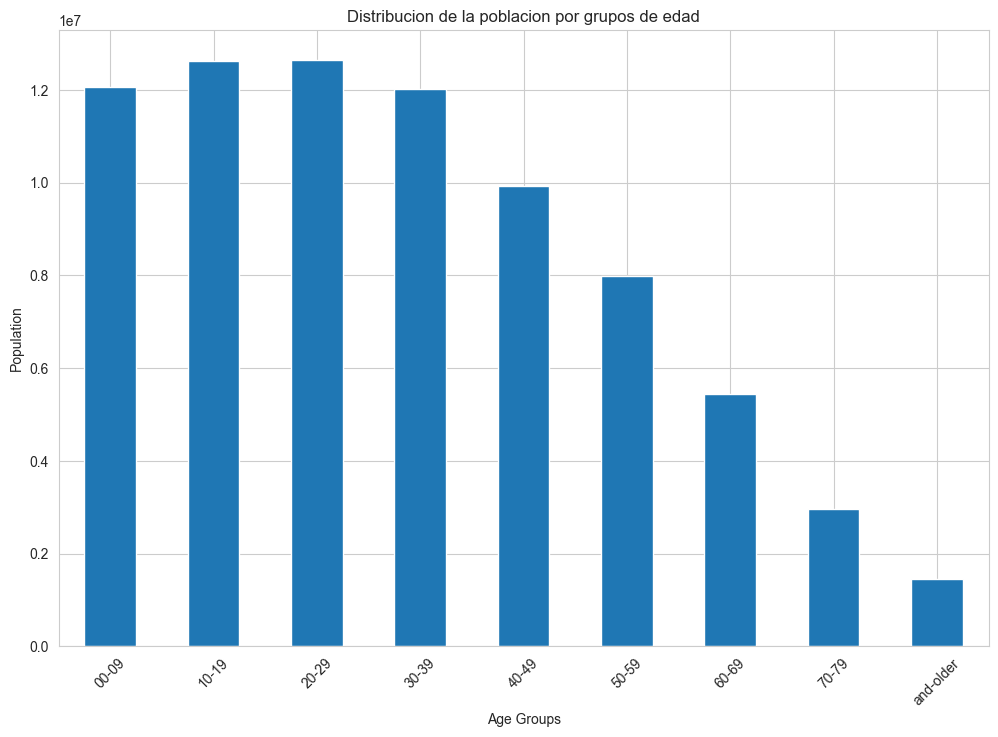

In [56]:
#calculamos la distribucion de la poblacion por grupos de edad

age_columns=['population_age_00_09','population_age_10_19','population_age_20_29','population_age_30_39',
             'population_age_40_49','population_age_50_59','population_age_60_69','population_age_70_79','population_age_80_and_older']
age_distribution = df_paises_covid[age_columns].mean()

plt.figure(figsize=(12,8))
age_distribution.plot(kind='bar', stacked=True)
plt.xlabel('Age Groups')
plt.ylabel('Population')
plt.title('Distribucion de la poblacion por grupos de edad')
plt.xticks(range(len(age_columns)), [col.split('_')[-2] + '-' + col.split('_')[-1] for col in age_columns], rotation=45)
plt.show()

Ahora podemos agrupar los grupos de edad en rangos más amplios, es decir de 00 a 19, 20 a 39,  40 a 59,  60 a 79 y de 80 a más años

In [57]:
df_paises_covid_grafico=df_paises_covid.copy()

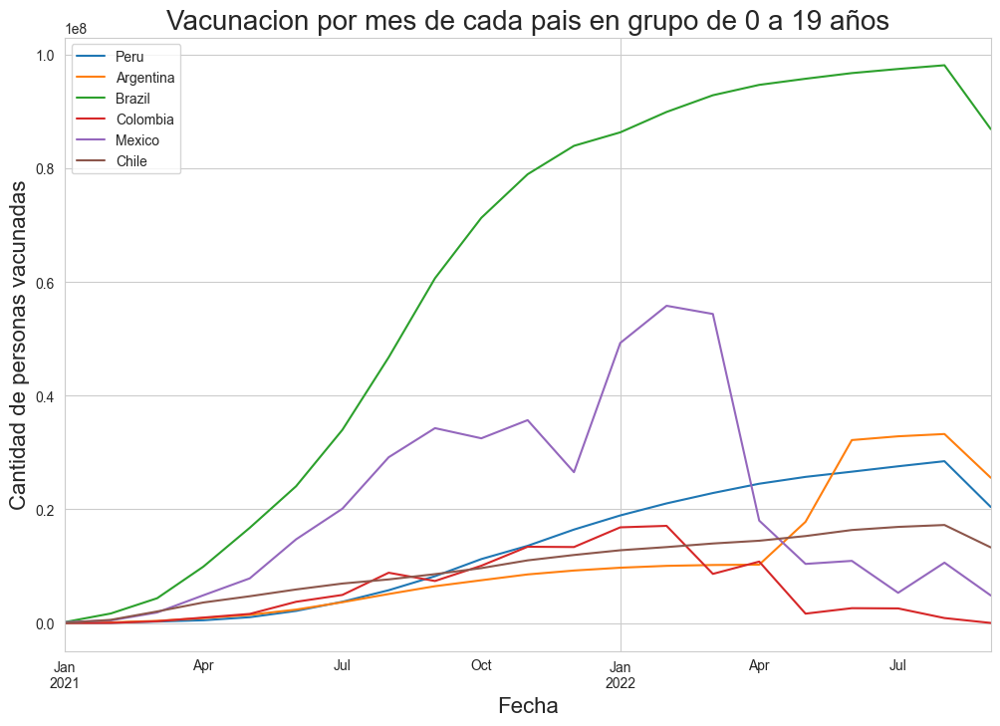

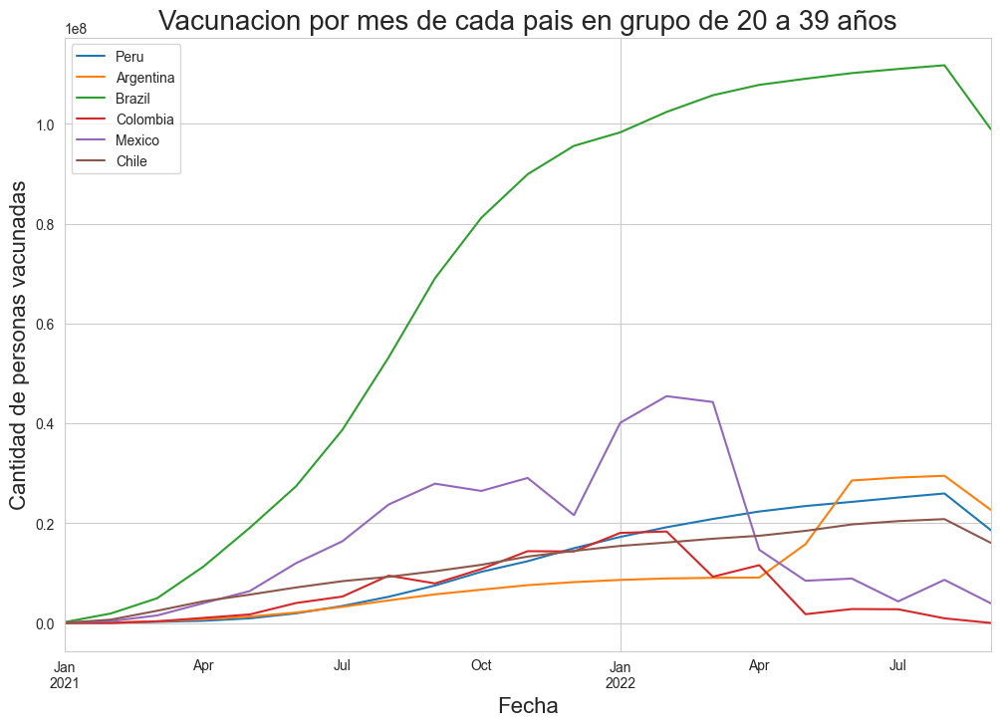

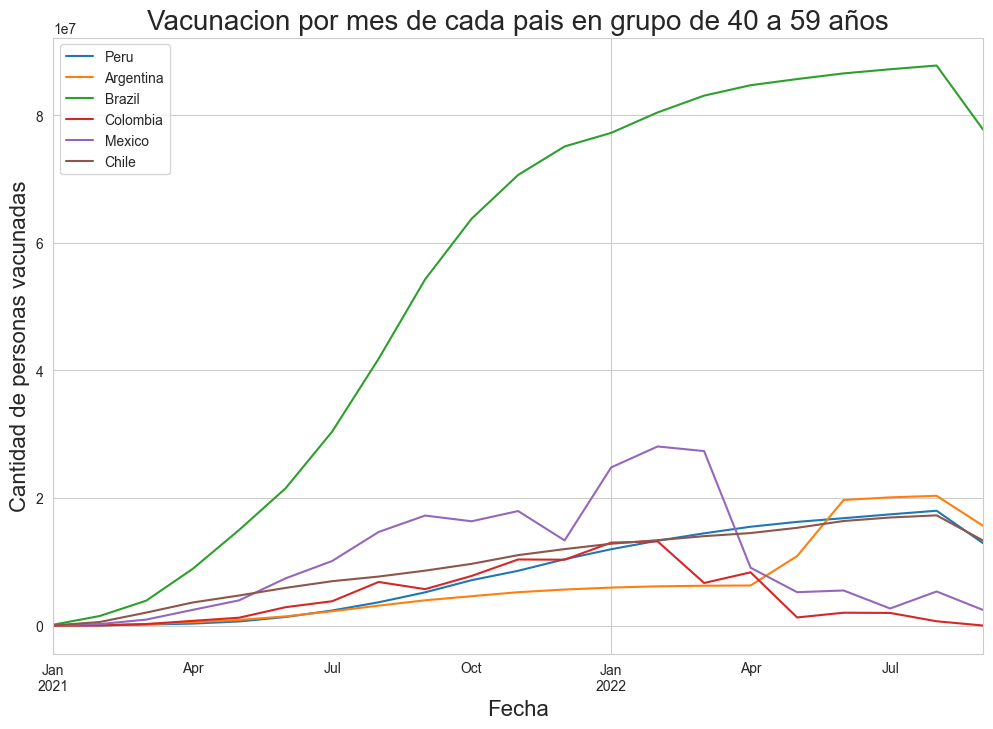

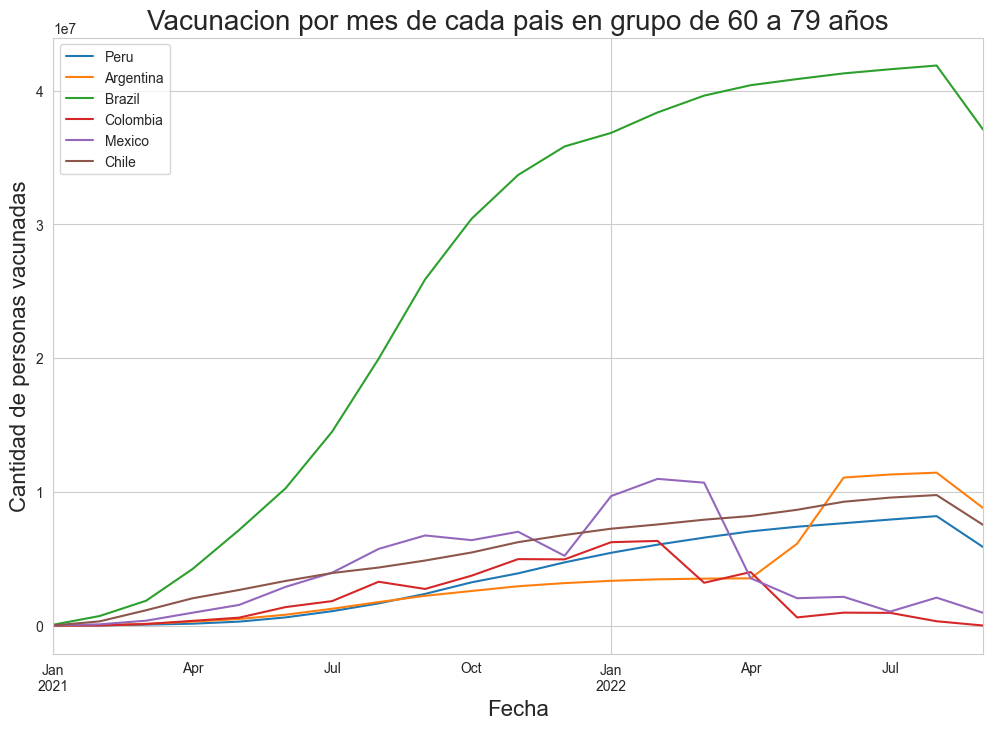

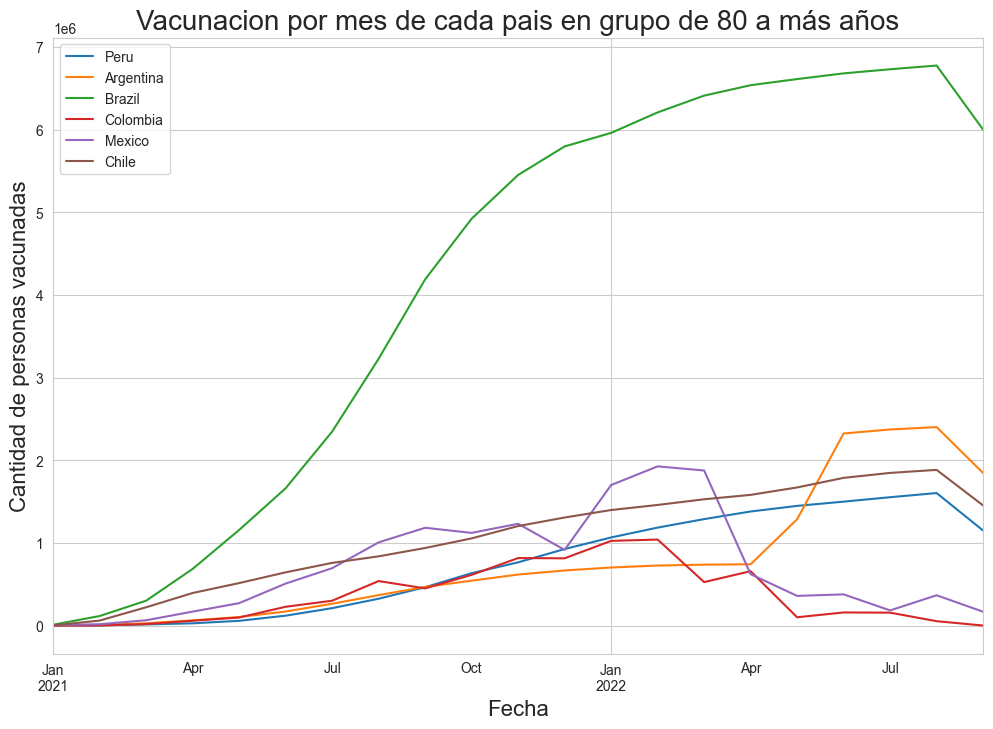

In [58]:
df_paises_covid_grafico=df_paises_covid.copy()

df_paises_covid_grafico['population_age_00_19'] = df_paises_covid_grafico['population_age_00_09'] + df_paises_covid_grafico['population_age_10_19']
df_paises_covid_grafico['population_age_20_39'] = df_paises_covid_grafico['population_age_20_29'] + df_paises_covid_grafico['population_age_30_39']
df_paises_covid_grafico['population_age_40_59'] = df_paises_covid_grafico['population_age_40_49'] + df_paises_covid_grafico['population_age_50_59']
df_paises_covid_grafico['population_age_60_79'] = df_paises_covid_grafico['population_age_60_69'] + df_paises_covid_grafico['population_age_70_79']
df_paises_covid_grafico['population_age_80_and_older'] = df_paises_covid_grafico['population_age_80_and_older']

df_paises_covid_grafico['population_age_00_19_vacunados'] = df_paises_covid_grafico['cumulative_vaccine_doses_administered'] * df_paises_covid_grafico['population_age_00_19'] / df_paises_covid_grafico['population']
df_paises_covid_grafico['population_age_20_39_vacunados'] = df_paises_covid_grafico['cumulative_vaccine_doses_administered'] * df_paises_covid_grafico['population_age_20_39'] / df_paises_covid_grafico['population']
df_paises_covid_grafico['population_age_40_59_vacunados'] = df_paises_covid_grafico['cumulative_vaccine_doses_administered'] * df_paises_covid_grafico['population_age_40_59'] / df_paises_covid_grafico['population']
df_paises_covid_grafico['population_age_60_79_vacunados'] = df_paises_covid_grafico['cumulative_vaccine_doses_administered'] * df_paises_covid_grafico['population_age_60_79'] / df_paises_covid_grafico['population']
df_paises_covid_grafico['population_age_80_and_older_vacunados'] = df_paises_covid_grafico['cumulative_vaccine_doses_administered'] * df_paises_covid_grafico['population_age_80_and_older'] / df_paises_covid_grafico['population']

df_paises_covid_grafico['population_age_00_19_vacunados'] = df_paises_covid_grafico['population_age_00_19_vacunados'].fillna(0)
df_paises_covid_grafico['population_age_20_39_vacunados'] = df_paises_covid_grafico['population_age_20_39_vacunados'].fillna(0)
df_paises_covid_grafico['population_age_40_59_vacunados'] = df_paises_covid_grafico['population_age_40_59_vacunados'].fillna(0)
df_paises_covid_grafico['population_age_60_79_vacunados'] = df_paises_covid_grafico['population_age_60_79_vacunados'].fillna(0)
df_paises_covid_grafico['population_age_80_and_older_vacunados'] = df_paises_covid_grafico['population_age_80_and_older_vacunados'].fillna(0)

df_paises_covid_grafico['population_age_00_19_vacunados'] = df_paises_covid_grafico['population_age_00_19_vacunados'].astype(int)
df_paises_covid_grafico['population_age_20_39_vacunados'] = df_paises_covid_grafico['population_age_20_39_vacunados'].astype(int)
df_paises_covid_grafico['population_age_40_59_vacunados'] = df_paises_covid_grafico['population_age_40_59_vacunados'].astype(int)
df_paises_covid_grafico['population_age_60_79_vacunados'] = df_paises_covid_grafico['population_age_60_79_vacunados'].astype(int)
df_paises_covid_grafico['population_age_80_and_older_vacunados'] = df_paises_covid_grafico['population_age_80_and_older_vacunados'].astype(int)

df_paises_covid_grafico['population_age_00_19_vacunados'].sum()
df_paises_covid_grafico['population_age_20_39_vacunados'].sum()
df_paises_covid_grafico['population_age_40_59_vacunados'].sum()
df_paises_covid_grafico['population_age_60_79_vacunados'].sum()
df_paises_covid_grafico['population_age_80_and_older_vacunados'].sum()



#grupo de 0 a 19 años
 # Se crea una nueva figura con un tamaño específico
fig, ax= plt.subplots(figsize=(12,8))
# Se genera un gráfico de líneas con la cantidad de personas vacunadas por mes para cada país
for pais in paises_seleccionados:
    df_paises_covid_grafico[df_paises_covid_grafico['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_00_19_vacunados'].plot()
# Se establece el título del gráfico
plt.title('Vacunacion por mes de cada pais en grupo de 0 a 19 años', fontsize=20)
# Se añaden etiquetas a los ejes x e y
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Cantidad de personas vacunadas', fontsize=16)
#Se agrega la legenda de los paises seleccionados
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
# Se añade una cuadrícula
plt.grid(True) 
# Se muestra el gráfico
plt.show() 


#grupo de 20 a 39 años
 # Se crea una nueva figura con un tamaño específico
fig, ax= plt.subplots(figsize=(12,8))

for pais in paises_seleccionados:
    df_paises_covid_grafico[df_paises_covid_grafico['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_20_39_vacunados'].plot()

plt.title('Vacunacion por mes de cada pais en grupo de 20 a 39 años', fontsize=20)
# Se añaden etiquetas a los ejes x e y
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Cantidad de personas vacunadas', fontsize=16)
#Se agrega la legenda de los paises seleccionados
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
# Se añade una cuadrícula
plt.grid(True) 
# Se muestra el gráfico
plt.show() 

#grupo de 40 a 59 años
 # Se crea una nueva figura con un tamaño específico
fig, ax= plt.subplots(figsize=(12,8))
for pais in paises_seleccionados:
    df_paises_covid_grafico[df_paises_covid_grafico['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_40_59_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 40 a 59 años', fontsize=20)
# Se añaden etiquetas a los ejes x e y
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Cantidad de personas vacunadas', fontsize=16)
#Se agrega la legenda de los paises seleccionados
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
# Se añade una cuadrícula
plt.grid(True) 
# Se muestra el gráfico
plt.show() 

#grupo de 60 a 79 años
 # Se crea una nueva figura con un tamaño específico
fig, ax= plt.subplots(figsize=(12,8))

for pais in paises_seleccionados:
    df_paises_covid_grafico[df_paises_covid_grafico['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_60_79_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 60 a 79 años', fontsize=20)
# Se añaden etiquetas a los ejes x e y
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Cantidad de personas vacunadas', fontsize=16)
#Se agrega la legenda de los paises seleccionados
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
# Se añade una cuadrícula
plt.grid(True) 
# Se muestra el gráfico
plt.show() 

#grupo de 80 a más años
 # Se crea una nueva figura con un tamaño específico
fig, ax= plt.subplots(figsize=(12,8))

for pais in paises_seleccionados:
    df_paises_covid_grafico[df_paises_covid_grafico['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_80_and_older_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 80 a más años', fontsize=20)
# Se añaden etiquetas a los ejes x e y
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Cantidad de personas vacunadas', fontsize=16)
#Se agrega la legenda de los paises seleccionados
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
# Se añade una cuadrícula
plt.grid(True) 
# Se muestra el gráfico
plt.show() 

## 16. Mapa de calor de métricas por país

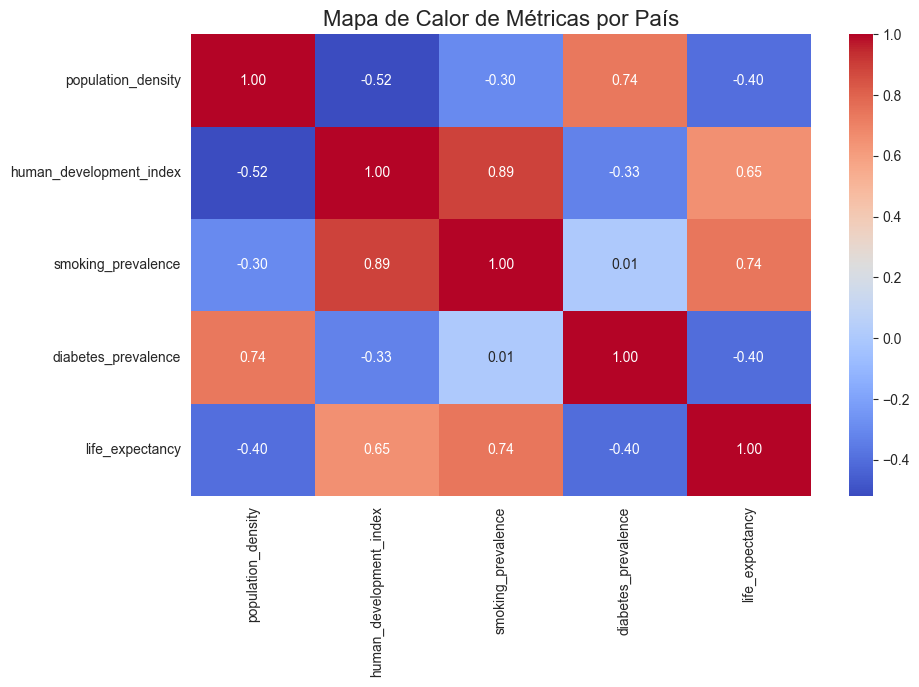

In [59]:
# Seleccionar las métricas a incluir en el mapa de calor
metricas = ['population_density', 'human_development_index', 'smoking_prevalence', 'diabetes_prevalence', 'life_expectancy']

# Filtrar los datos para los países seleccionados
datos_filtrados = df_paises_covid[df_paises_covid['country_name'].isin(paises_seleccionados)]

# Calcular la matriz de correlación entre las métricas seleccionadas
correlacion = datos_filtrados[metricas].corr()

# Crear el mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 10})

# Configurar el título
plt.title('Mapa de Calor de Métricas por País', fontsize=16)

# Mostrar el mapa de calor
plt.show()


## 17. Diagrama de barras apilado de la comparación de la tasa de mortalidad masculina vs. femenina por país

Revisemos la mortalidad por genero para identificar la poblacion mas vulnerable den cada país, con esto ya podriamos tener una idea de cuál seria la población a vacunar primero

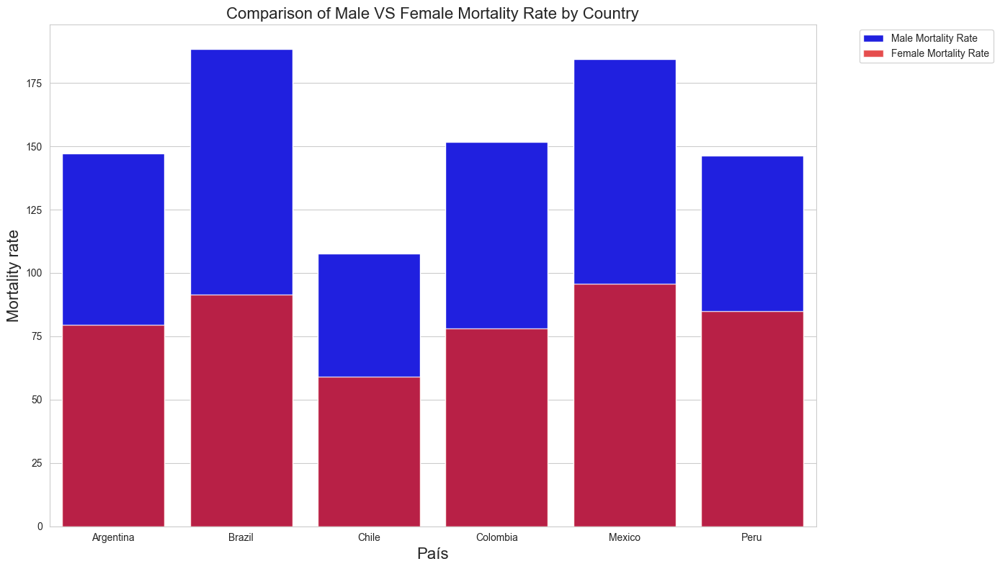

In [60]:

# Establecemos el tamaño de la figura
plt.figure(figsize=(14,8))

# Creamos un gráfico de barras para la tasa de mortalidad masculina
sns.barplot(data=df_paises_covid, x='country_name', y='adult_male_mortality_rate', color='blue', label='Male Mortality Rate')

# Creamos un gráfico de barras para la tasa de mortalidad femenina
sns.barplot(data=df_paises_covid, x='country_name', y='adult_female_mortality_rate', color='red', alpha=0.8, label='Female Mortality Rate')

# Establecemos la etiqueta del eje y
plt.ylabel('Mortality rate', fontsize=16)
plt.xlabel('País', fontsize=16)

# Establecemos el título del gráfico
plt.title('Comparison of Male VS Female Mortality Rate by Country', fontsize=16)

# Ajustamos la leyenda del gráfico
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')

# Mejoramos el layout para una mejor presentación
plt.tight_layout()

# Mostramos el gráfico
plt.show()

## 18. Matriz de Correlación de indicadores demográficos y de salud


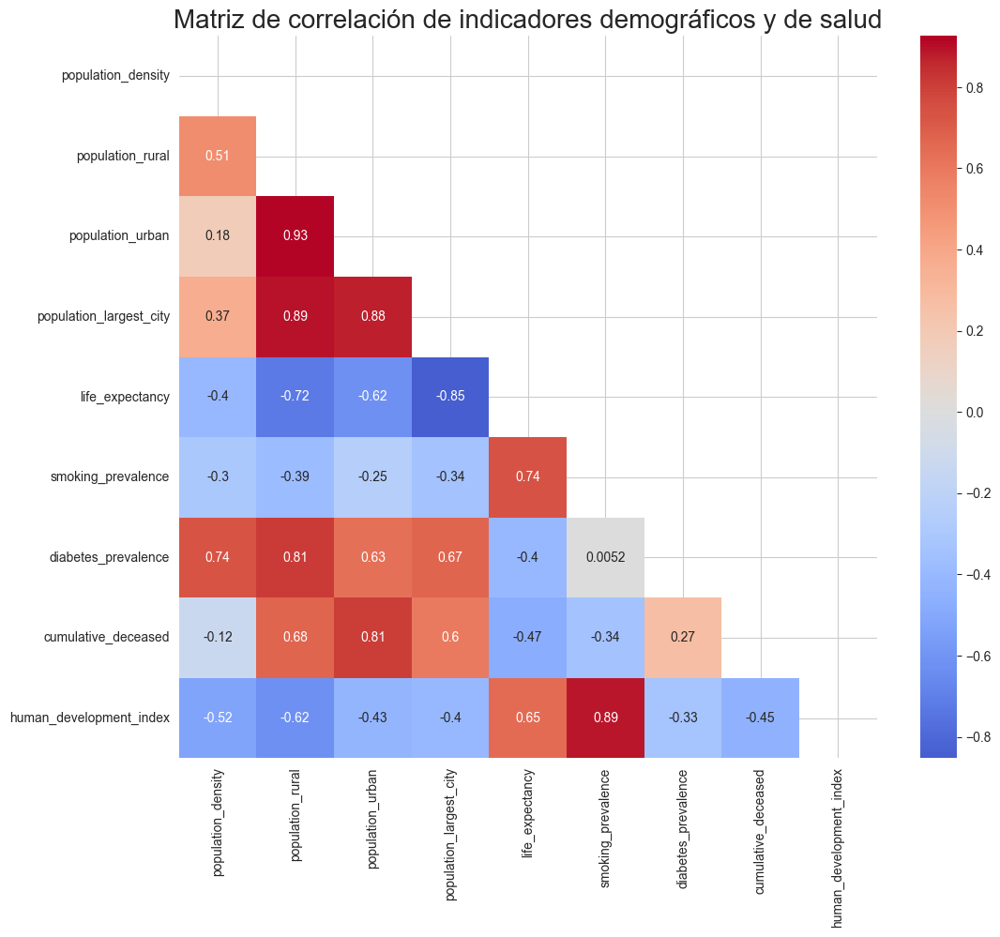

In [61]:
# Este código genera un mapa de calor que muestra la mitad inferior de la matriz de correlación de ciertos indicadores demográficos y de salud.

# Se seleccionan las columnas para el análisis de correlación
columnas=['population_density','population_rural', 'population_urban','population_largest_city',
        'life_expectancy', 'smoking_prevalence','diabetes_prevalence','cumulative_deceased','human_development_index']

# Se calcula la matriz de correlación de las columnas seleccionadas
matriz_correlacion=df_paises_covid[columnas].corr()

# Se obtienen los valores absolutos de la matriz de correlación y se filtran aquellos que son mayores a 0
matriz_correlacion = matriz_correlacion[abs(matriz_correlacion)>0]

# Se crea una máscara para ocultar la mitad superior de la matriz de correlación
mask = np.triu(np.ones_like(matriz_correlacion, dtype=bool))

# Se crea una nueva figura con un tamaño más grande
plt.figure(figsize=(12,10))

# Se genera el mapa de calor usando seaborn, aplicando la máscara
sns.heatmap(matriz_correlacion, mask=mask, annot=True, cmap='coolwarm', center=0)

# Se establece el título del gráfico como 'Matriz de correlación de indicadores demográficos y de salud' con un tamaño de fuente mayor
plt.title('Matriz de correlación de indicadores demográficos y de salud', fontsize=20)

# Se muestra el gráfico
plt.show()

## 19. Comparación de la Prevalencia de Diabetes y la Tasa de Mortlidad

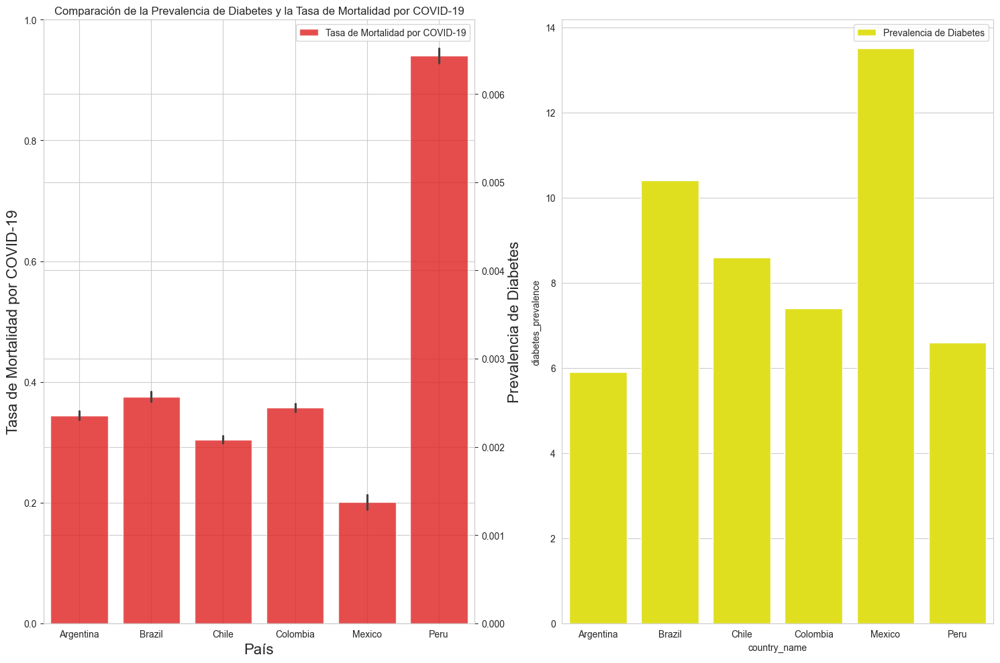

In [62]:
# Se crea una nueva figura con dos subtramas 
fig,(ax,ax2)= plt.subplots(1,2,figsize=(15,10))

# Se genera el primer gráfico de barras 
sns.barplot(data=df_paises_covid, x=df_paises_covid['country_name'], y=df_paises_covid['diabetes_prevalence'], 
            color='yellow', label='Prevalencia de Diabetes')

ax2=ax.twinx()

# Se genera el segundo gráfico de barras 
sns.barplot(data=df_paises_covid, x=df_paises_covid['country_name'], y=df_paises_covid['cumulative_deceased']/df_paises_covid['population'], 
            color='Red', label = 'Tasa de Mortalidad por COVID-19', ax=ax2, alpha=0.8)

plt.xticks(rotation=90)

#Se establecen etiquetes en los ejes
ax2.set_ylabel('Prevalencia de Diabetes', fontsize=16)
ax.set_xlabel('País', fontsize=16)
ax2.set_xlabel('País', fontsize=16)
ax.set_ylabel('Tasa de Mortalidad por COVID-19', fontsize=16)

#Se establece el título
plt.title('Comparación de la Prevalencia de Diabetes y la Tasa de Mortalidad por COVID-19')
# Se ajusta el diseño para evitar la superposición de elementos
plt.tight_layout()

# Se muestra el gráfico
plt.show()

# Avance 3

In [63]:
#importamos las librerias necesarias para desarrollar el Avance 2 cuando no se ejecuta seguido al Avance 1
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Se carga el dataFrame desde el CSV guardado con los datos finales filtrados y se 
#cambia el campo 'date' a fecha mediante el comando parse_dates=
df_paises_covid=pd.read_csv('../csv/DatosFinalesFiltrado.csv')

df_paises_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3750 entries, 0 to 3749
Data columns (total 50 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3750 non-null   object 
 1   date                                   3750 non-null   object 
 2   country_code                           3750 non-null   object 
 3   country_name                           3750 non-null   object 
 4   new_confirmed                          3750 non-null   float64
 5   new_deceased                           3750 non-null   float64
 6   cumulative_confirmed                   3750 non-null   float64
 7   cumulative_deceased                    3750 non-null   float64
 8   cumulative_vaccine_doses_administered  3750 non-null   float64
 9   population                             3750 non-null   float64
 10  population_male                        3750 non-null   float64
 11  popu

In [64]:
#ponemos como indice la columna 'date' para poder hacer analisis de datos con la variable de tiempo
df_paises_covid['date']=pd.to_datetime(df_paises_covid['date'])
df_paises_covid.set_index('date', inplace=True)

In [65]:
df_paises_covid.head()

,location_key,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,population_male,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
date,,,,,,,,,,,,,,,,,,,,,
2021-01-01,AR,AR,Argentina,2685.0,140.0,1662867.0,46522.0,18849.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-02,AR,AR,Argentina,7767.0,166.0,1670634.0,46688.0,20334.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-03,AR,AR,Argentina,4934.0,157.0,1675568.0,46845.0,20529.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-04,AR,AR,Argentina,13953.0,157.0,1689521.0,47002.0,25164.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-05,AR,AR,Argentina,14085.0,160.0,1703606.0,47162.0,29852.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,0.0,0.0


## 1. Evolución de Casos Activos vs. Recuperados

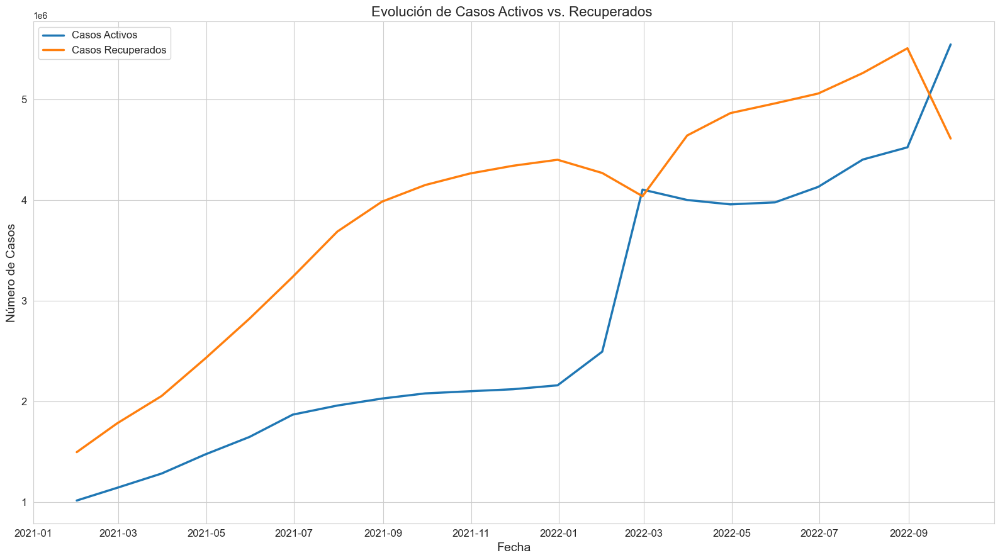

In [89]:


# Calculamos los casos activos en cada país de América Latina
# Los casos activos se calculan como el total de casos confirmados menos los casos fallecidos y recuperados
df_paises_covid['active_cases'] = df_paises_covid['cumulative_confirmed'] - df_paises_covid['cumulative_deceased'] - df_paises_covid['cumulative_recovered']

# Creamos una nueva figura con un tamaño específico
plt.figure(figsize=(16, 9))

# Creamos un gráfico de líneas para los casos activos, resample('ME') se usa para agrupar los datos por el final de cada mes y calcular la media
# Usamos seaborn (sns) para el gráfico de líneas porque proporciona una interfaz de alto nivel para dibujar gráficos estadísticos atractivos
sns.lineplot(data=df_paises_covid.resample('ME').mean(numeric_only=True), x='date', y='active_cases', label='Casos Activos', linewidth=2.5,color='red')

# Creamos un gráfico de líneas para los casos recuperados
sns.lineplot(data=df_paises_covid.resample('ME').mean(numeric_only=True), x='date', y='cumulative_recovered', label='Casos Recuperados', linewidth=2.5, color='blue')

# Configuramos las etiquetas de los ejes y el título del gráfico
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Número de Casos', fontsize=14)
plt.title('Evolución de Casos Activos vs. Recuperados ', fontsize=16)

# Añadimos una leyenda para indicar qué línea representa a qué grupo de casos
plt.legend(fontsize=12)

plt.yticks(fontsize=12)
plt.xticks(fontsize=12)

# Creamos un gráfico de líneas para los casos activos y lo configuramos en color rojo
sns.lineplot(data=df_paises_covid.resample('ME').mean(numeric_only=True), x='date', y='active_cases', label='Casos Activos', linewidth=2.5, color='red')

# Creamos un gráfico de líneas para los casos recuperados y lo configuramos en color azul
sns.lineplot(data=df_paises_covid.resample('ME').mean(numeric_only=True), x='date', y='cumulative_recovered', label='Casos Recuperados', linewidth=2.5, color='blue')

# Mejoramos el layout para una mejor presentación
plt.tight_layout()

# Mostramos el gráfico
plt.show()

Graficamos todos los paises para que se vea como estan incompletos los datos de los Casos Recuperados, muchos paises estan en 0

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1663785576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']


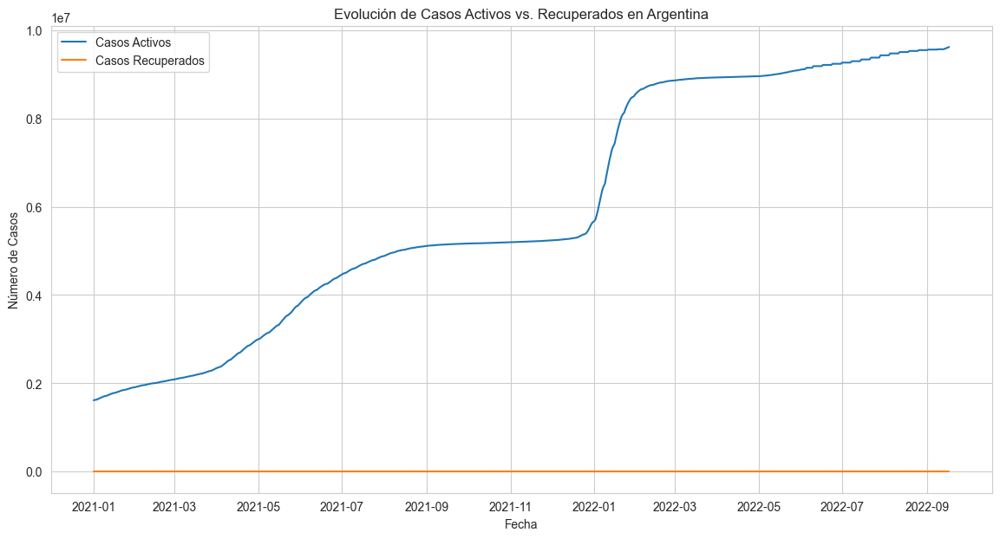

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1663785576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']


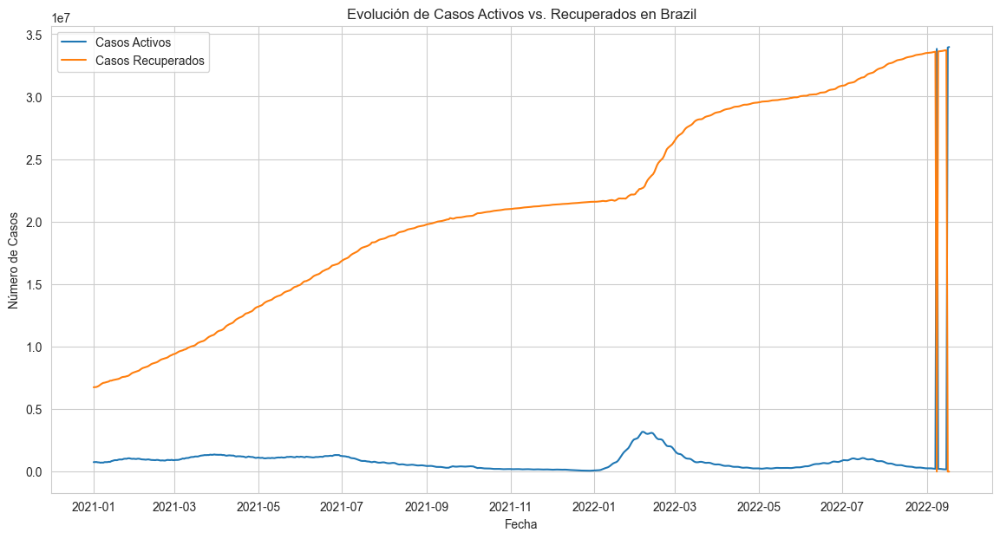

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1663785576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']


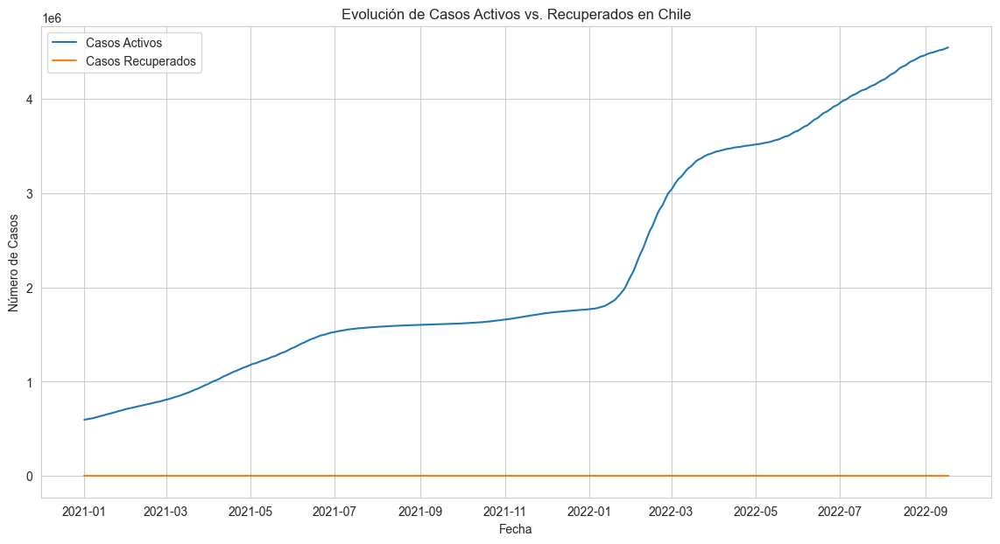

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1663785576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']


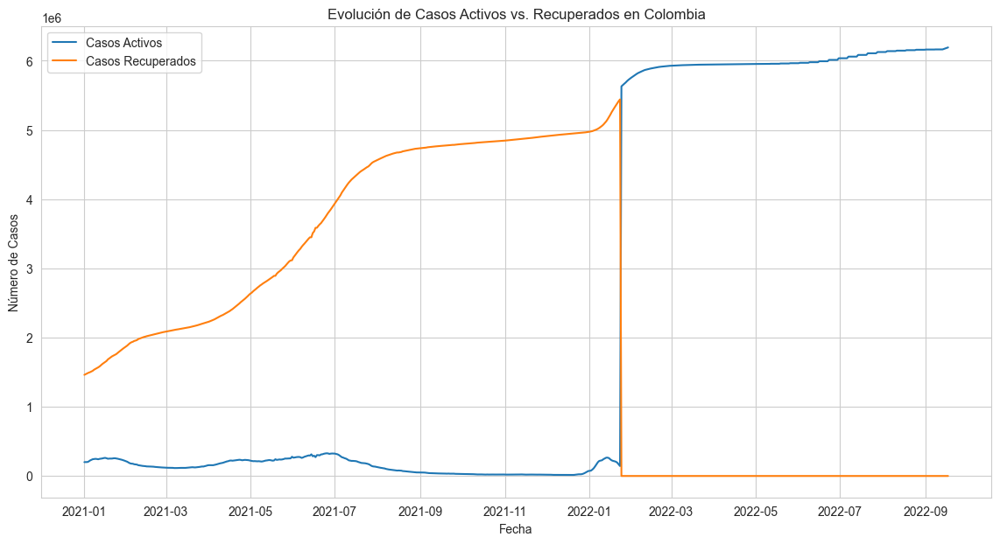

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1663785576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']


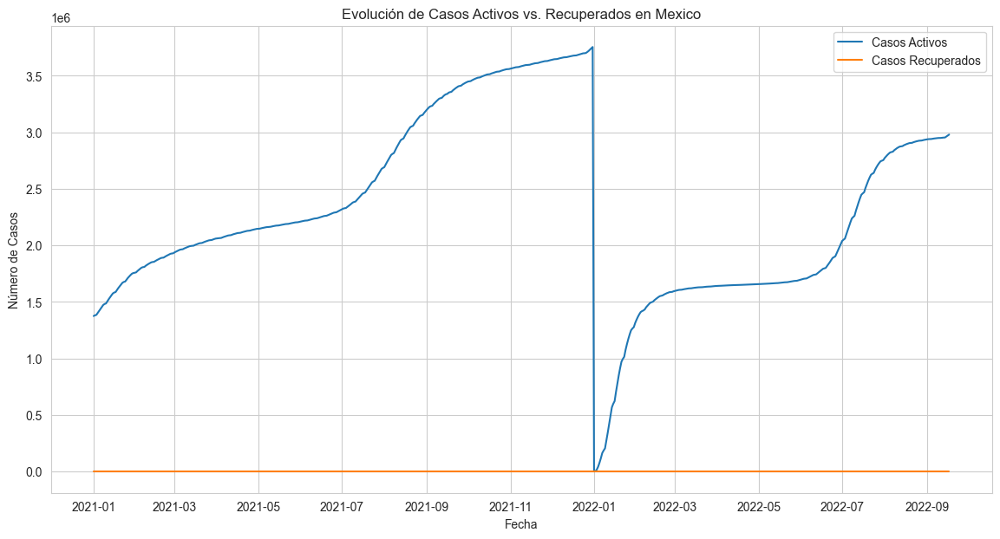

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1663785576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']


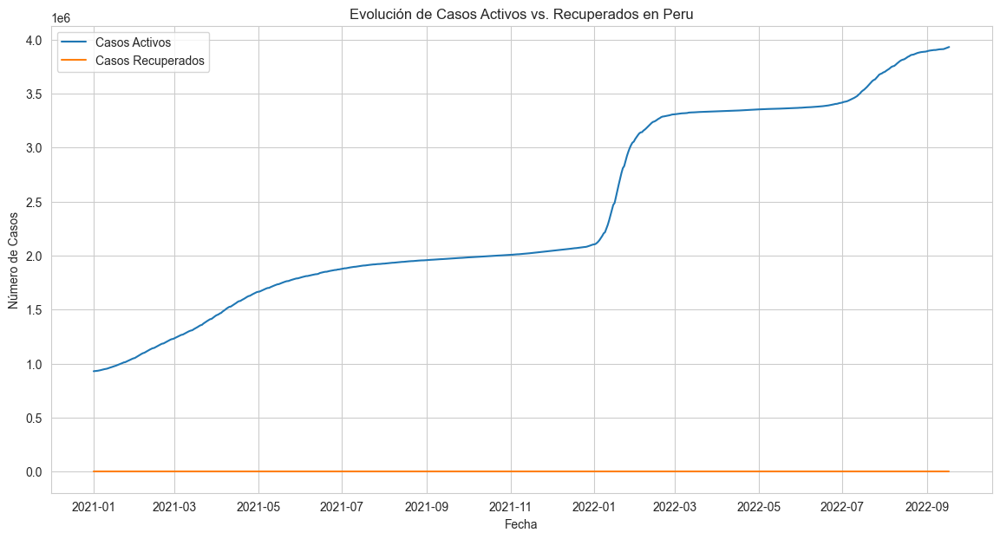

In [67]:
# Lista de países únicos en el DataFrame
countries = df_paises_covid['country_name'].unique()

# Para cada país en la lista de países
for country in countries:
    # Filtramos el DataFrame para incluir solo los datos de ese país
    df_country = df_paises_covid[df_paises_covid['country_name'] == country]
    
    # Calculamos los casos activos para ese país
    df_country['active_cases'] = df_country['cumulative_confirmed'] - df_country['cumulative_deceased'] - df_country['cumulative_recovered']
    
    # Creamos una nueva figura
    plt.figure(figsize=(14, 7))
    
    # Creamos un gráfico de líneas para los casos activos y recuperados
    sns.lineplot(data=df_country, x='date', y='active_cases', label='Casos Activos')
    sns.lineplot(data=df_country, x='date', y='cumulative_recovered', label='Casos Recuperados')
    
    # Añadimos etiquetas y título
    plt.xlabel('Fecha')
    plt.ylabel('Número de Casos')
    plt.title(f'Evolución de Casos Activos vs. Recuperados en {country}')
    
    # Mostramos la leyenda y el gráfico
    plt.legend()
    plt.show()

## 2. Tasa de Crecimiento (%)

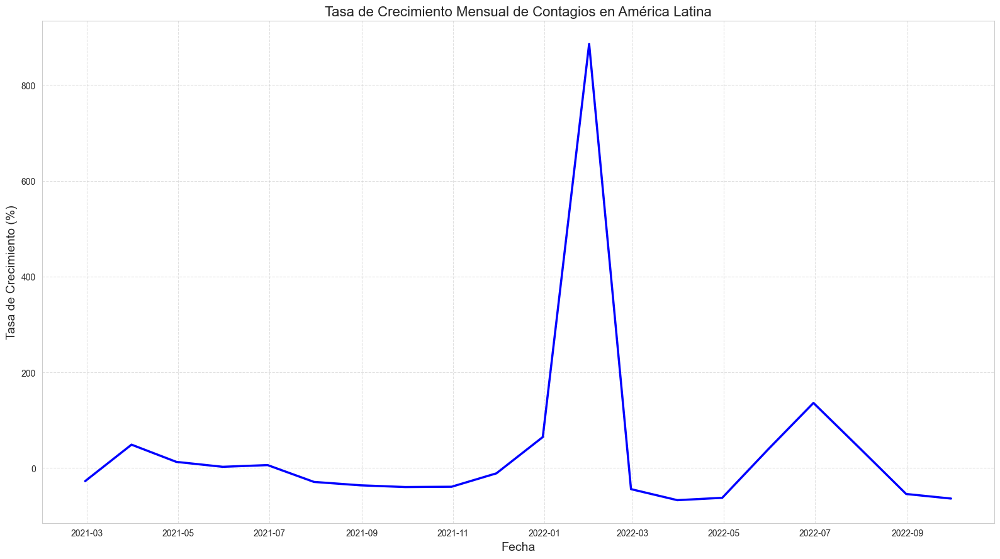

In [88]:


# Calculamos la tasa de crecimiento mensual de los nuevos casos confirmados
# Resample('ME') se usa para agrupar los datos por el final de cada mes
# pct_change() se usa para calcular el cambio porcentual de un mes al siguiente
# Multiplicamos por 100 para convertir la tasa a porcentaje
tasa_crecimiento_mensual = df_paises_covid.resample('ME')['new_confirmed'].sum().pct_change() * 100

# Creamos una nueva figura con un tamaño específico
plt.figure(figsize=(16, 9))

# Creamos un gráfico de líneas para la tasa de crecimiento mensual
# Usamos seaborn (sns) para el gráfico de líneas porque proporciona una interfaz de alto nivel para dibujar gráficos estadísticos atractivos
sns.lineplot(x=tasa_crecimiento_mensual.index, y=tasa_crecimiento_mensual, color='blue', linewidth=2.5)

# Configuramos las etiquetas de los ejes y el título del gráfico
plt.xlabel('Fecha', fontsize=14)
plt.ylabel('Tasa de Crecimiento (%)', fontsize=14)
plt.title('Tasa de Crecimiento Mensual de Contagios en América Latina', fontsize=16)

# Añadimos una cuadrícula para facilitar la lectura de los datos
plt.grid(True, linestyle='--', alpha=0.6)

# Mejoramos el layout para una mejor presentación
plt.tight_layout()

# Mostramos el gráfico
plt.show()

## 3. Relación de la cobertura de Vacunación y la Reducción de casos

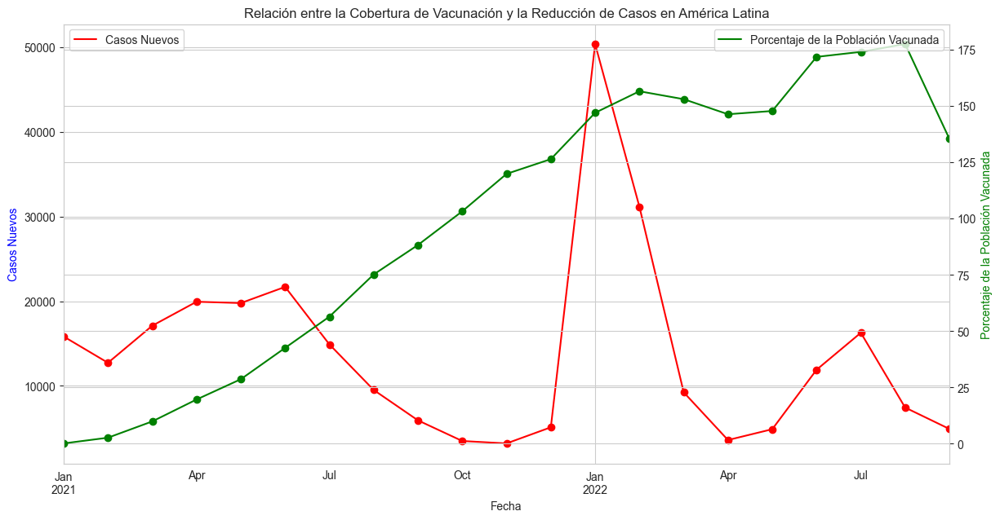

In [69]:
# Como evoluciona la vacunación en América Latina y la reducción de casos de COVID-19
plt.figure(figsize=(14, 7))
ax1 = plt.gca()
ax2 = ax1.twinx()

# Crea porcentajes de vacunación
df_paises_covid['percentage_vaccinated'] = (df_paises_covid['cumulative_vaccine_doses_administered'] / df_paises_covid['population']) * 100

# Gráfico de casos nuevos
df_paises_covid.resample('ME').mean(numeric_only=True)['new_confirmed'].plot(ax=ax1, color='red', label='Casos Nuevos')

# Gráfico del porcentaje de vacunación
df_paises_covid.resample('ME').mean(numeric_only=True)['percentage_vaccinated'].plot(ax=ax2, color='green', label='Porcentaje de la Población Vacunada')

# Agregamos puntos a cada cambio de mes
ax1.scatter(df_paises_covid.resample('ME').mean(numeric_only=True).index, df_paises_covid.resample('ME').mean(numeric_only=True)['new_confirmed'], color='red')
ax2.scatter(df_paises_covid.resample('ME').mean(numeric_only=True).index, df_paises_covid.resample('ME').mean(numeric_only=True)['percentage_vaccinated'], color='green')

# Configuración del gráfico
ax1.set_xlabel('Fecha')
ax1.set_ylabel('Casos Nuevos', color='blue')
ax2.set_ylabel('Porcentaje de la Población Vacunada', color='green')
ax1.set_title('Relación entre la Cobertura de Vacunación y la Reducción de Casos en América Latina')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Mostrar el gráfico
plt.show()


## 4. Progreso de la vacunación por país

C:\Users\artur\AppData\Local\Temp\ipykernel_14272\1106112191.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=vaccination_data.values, y=vaccination_data.index, palette='viridis')


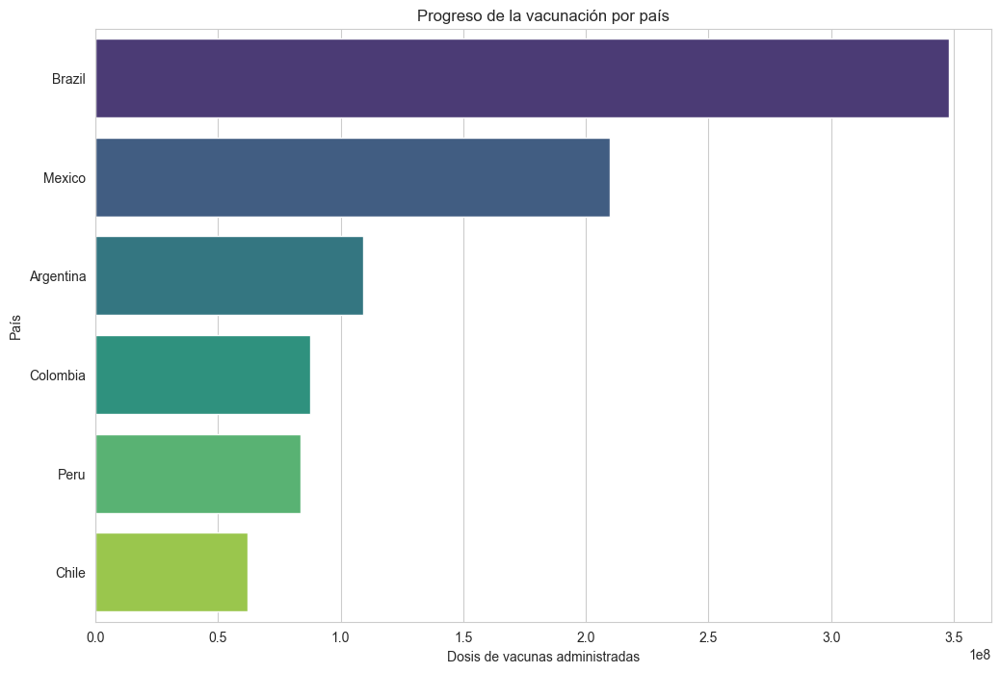

In [70]:
# Agrupar los datos de vacunación por país, calculando el máximo de dosis de vacunas administradas y ordenando de mayor a menor
vaccination_data = df_paises_covid.groupby('country_name')['cumulative_vaccine_doses_administered'].max().sort_values(ascending=False)

# Crear una figura para la gráfica con tamaño especificado
plt.figure(figsize=(12, 8))

# Graficar un gráfico de barras con los datos de vacunación
sns.barplot(x=vaccination_data.values, y=vaccination_data.index, palette='viridis')

# Etiquetas de los ejes y título de la gráfica
plt.xlabel('Dosis de vacunas administradas')
plt.ylabel('País')
plt.title('Progreso de la vacunación por país')

# Mostrar la gráfica
plt.show()


El pais con mayor cantidad de dosis es Brasil, seguido de Mexico, Argentina, Colmbia y Peru. Se contradice con los hallazgos anteriores sin embaro recordemos que se debe tener en cuenta la población de cada país y la cantidad de vacunas disponibles.

## 5. Nuevos casos y temperatura promedio

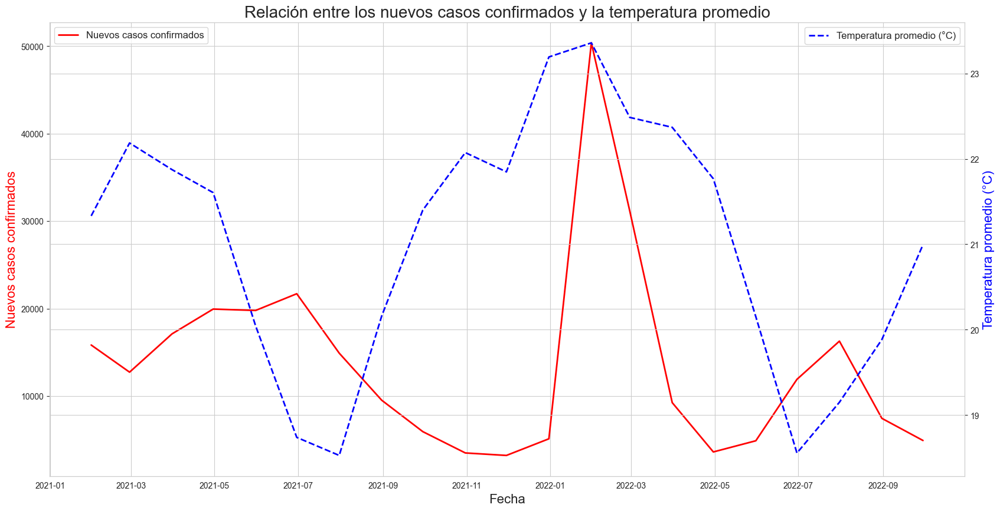

In [71]:
# Este código genera un gráfico de línea que muestra la relación entre la temperatura promedio y los nuevos casos confirmados de COVID-19.

# Se crea una nueva figura con un tamaño más grande
plt.figure(figsize=(20, 10))

# Se crea el primer eje (ax1) para los casos confirmados
ax1 = plt.gca()

# Se crea un segundo eje (ax2) que comparte el mismo eje x que ax1 para la temperatura
ax2 = ax1.twinx()

# Se grafican los nuevos casos confirmados, promediados mensualmente, en ax1
ax1.plot(
    df_paises_covid.resample('ME').mean(numeric_only=True).index, 
    df_paises_covid.resample('ME').mean(numeric_only=True)['new_confirmed'], 
    color='red', 
    label='Nuevos casos confirmados',
    linewidth=2
)

# Se grafica la temperatura promedio, promediada mensualmente, en ax2
ax2.plot(
    df_paises_covid.resample('ME').mean(numeric_only=True).index, 
    df_paises_covid.resample('ME').mean(numeric_only=True)['average_temperature_celsius'], 
    color='blue', 
    label='Temperatura promedio (°C)',
    linestyle='--',
    linewidth=2
)

# Se configuran las etiquetas de los ejes con un tamaño de fuente mayor
ax1.set_xlabel('Fecha', fontsize=16)
ax1.set_ylabel('Nuevos casos confirmados', color='red', fontsize=16)
ax2.set_ylabel('Temperatura promedio (°C)', color='blue', fontsize=16)

# Se establece el título del gráfico como 'Relación entre la temperatura promedio y los nuevos casos confirmados de COVID-19' con un tamaño de fuente mayor
plt.title('Relación entre los nuevos casos confirmados y la temperatura promedio', fontsize=20)

# Se configuran las leyendas para ambos ejes
ax1.legend(loc='upper left', fontsize=12)
ax2.legend(loc='upper right', fontsize=12)

# Se muestra la gráfica
plt.show()

Podemos observar que la temperatura promedio ha ido aumentando y los casos confirmados ha ido disminuyendo sin embargo hubo un pico antes del mes de marzo pero disminuyo rapidamente, esto puede ser por la cantidad de vacunas administradas o por la cantidad de personas que se han vacunado

## 6. Impacto de la Urbanización en la Propagación del Covid-19

Cada pais tiene un impacto debido a la urbanización y la densidad de su población, por lo que vamos a analizar la densidad de población por cada país

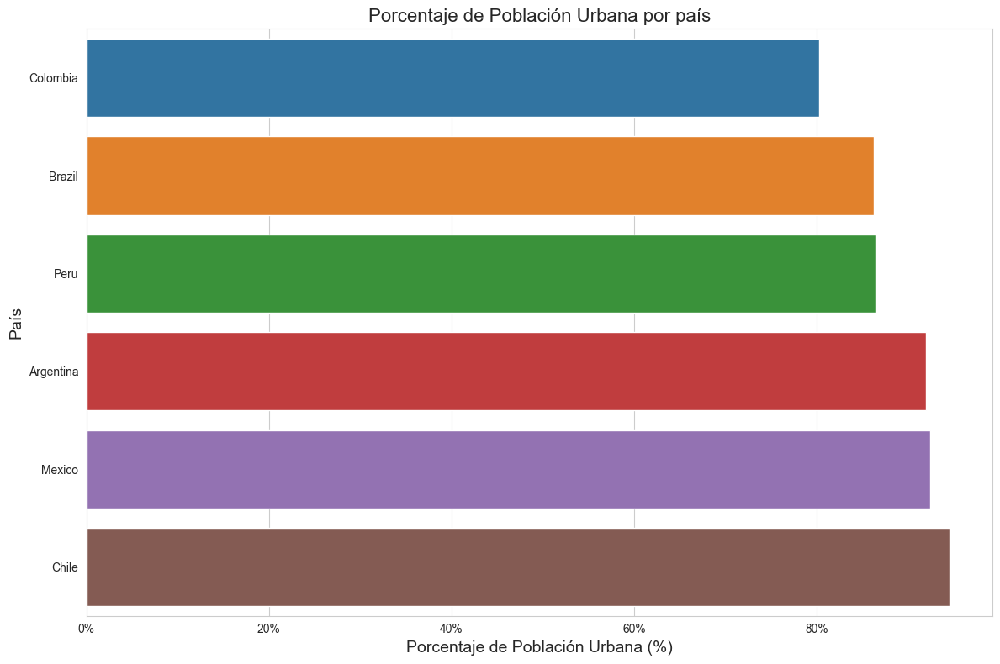

In [72]:

# Calculamos el porcentaje de población urbana
df_paises_covid['urban_population_percentage'] = df_paises_covid['population_urban'] / df_paises_covid['population'] * 100

# Agrupamos los datos por país y tomamos el último valor de cada grupo, luego ordenamos por porcentaje de población urbana
urban_cases = df_paises_covid.groupby('country_name').last().sort_values(by='urban_population_percentage')

# Configuramos el tamaño de la figura
plt.figure(figsize=(12, 8))

# Creamos un gráfico de barras con los porcentajes de población urbana
# Asignamos la variable 'y' a 'hue' y establecemos 'legend=False' para el mismo efecto que 'palette'
sns.barplot(x=urban_cases['urban_population_percentage'], y=urban_cases.index, hue=urban_cases.index, legend=False)

# Añadimos etiquetas y título
plt.xlabel('Porcentaje de Población Urbana (%)', fontsize=14)
plt.ylabel('País', fontsize=14)

plt.title('Porcentaje de Población Urbana por país', fontsize=16)

# Formateamos el eje x para mostrar porcentajes
fmt = '%.0f%%' 
xticks = mtick.FormatStrFormatter(fmt)
plt.gca().xaxis.set_major_formatter(xticks)

# Mejoramos el layout para una mejor presentación
plt.tight_layout()

# Mostramos el gráfico
plt.show()

El pais con mayor impacto en la propagacion fue Chile, aunque es extraño ya que Chile fue uno de los paises que mejor manejo la pandemia, sin embargo esto puede ser debido a la densidad de poblacion en Chile

## 7. Evolución Semanal de Casos Nuevos y 
## 8. Evolución Anual de Casos Nuevos

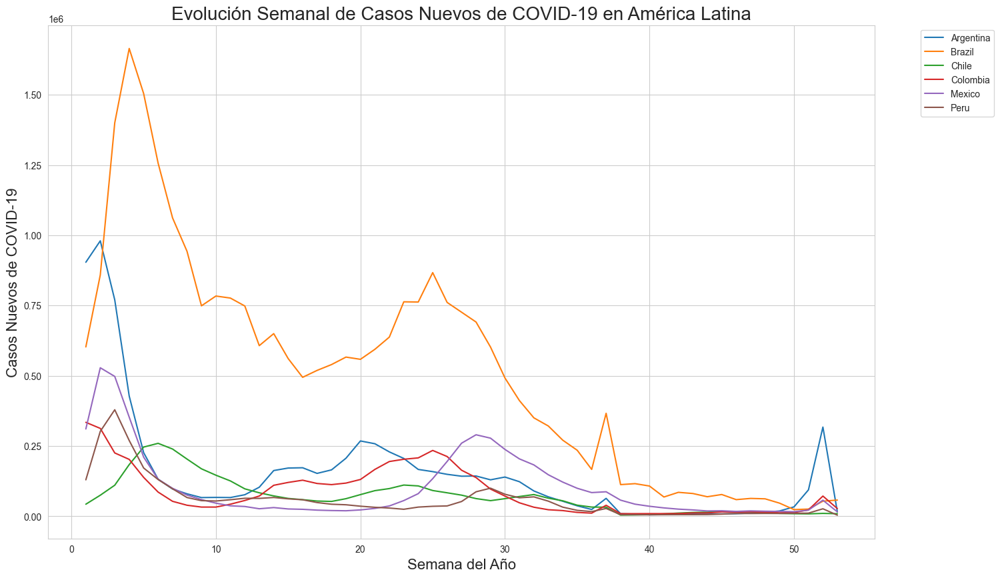

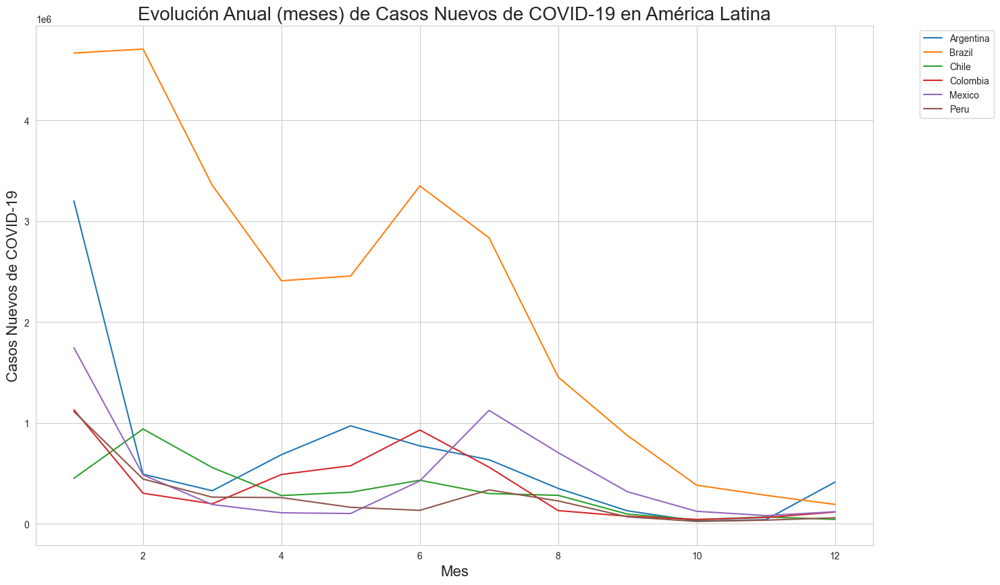

In [73]:
# Este código genera dos gráficos de línea que muestran la evolución de los casos nuevos de COVID-19 en América Latina a lo largo del tiempo, por semana y por mes.

# Se añaden las columnas 'week' y 'year' al DataFrame
df_paises_covid['week'] = df_paises_covid.index.isocalendar().week
df_paises_covid['year'] = df_paises_covid.index.isocalendar().year

# Se calcula la suma de los casos nuevos de COVID-19 por semana para cada país
weekly_cases = df_paises_covid.groupby(['country_name', 'week'])['new_confirmed'].sum().reset_index()

# Se crea una nueva figura con un tamaño más grande
plt.figure(figsize=(16, 10))

# Se genera un gráfico de línea para cada país
for country in weekly_cases['country_name'].unique():
    country_weekly_cases = weekly_cases[weekly_cases['country_name'] == country]
    plt.plot(country_weekly_cases['week'], country_weekly_cases['new_confirmed'], label=country)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Semana del Año', fontsize=16)
plt.ylabel('Casos Nuevos de COVID-19', fontsize=16)

# Se establece el título del gráfico como 'Evolución Semanal de Casos Nuevos de COVID-19 en América Latina' con un tamaño de fuente mayor
plt.title('Evolución Semanal de Casos Nuevos de COVID-19 en América Latina', fontsize=20)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

# Se añade la columna 'month' al DataFrame
df_paises_covid['month'] = df_paises_covid.index.month

# Se calcula la suma de los casos nuevos de COVID-19 por mes para cada país
yearly_cases = df_paises_covid.groupby(['country_name', 'month'])['new_confirmed'].sum().reset_index()

# Se crea una nueva figura con un tamaño más grande
plt.figure(figsize=(16, 10))

# Se genera un gráfico de línea para cada país
for country in yearly_cases['country_name'].unique():
    country_yearly_cases = yearly_cases[yearly_cases['country_name'] == country]
    plt.plot(country_yearly_cases['month'], country_yearly_cases['new_confirmed'], label=country)

# Se añaden etiquetas a los ejes x e y con un tamaño de fuente mayor
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Casos Nuevos de COVID-19', fontsize=16)

# Se establece el título del gráfico como 'Evolución Anual de Casos Nuevos de COVID-19 en América Latina' con un tamaño de fuente mayor
plt.title('Evolución Anual (meses) de Casos Nuevos de COVID-19 en América Latina', fontsize=20)

# Se mueve la leyenda fuera del área de la gráfica
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Se muestra el gráfico
plt.show()

## 9. Distribución de la Población por edad en paises

y la densidad de la población por grupos de edad?

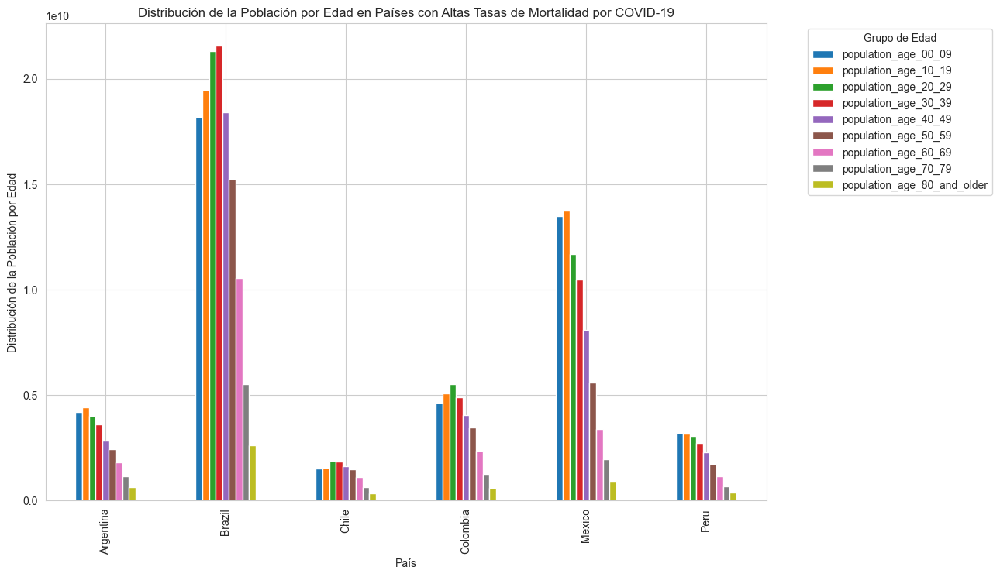

In [74]:
# Se podria tomar  los países con altas tasas de mortalidad por COVID-19,
#high_mortality_countries = df_paises_covid.groupby('country_name')['cumulative_deceased'].max().sort_values(ascending=False).head(3).index

#pero se graficaran todos los paises para ver la distribución completa de los paises por la edad de su población
high_mortality_countries = df_paises_covid.groupby('country_name')['cumulative_deceased'].max().sort_values(ascending=False).index

# Definimos los grupos de edad que queremos analizar
age_groups = [
    'population_age_00_09', 
    'population_age_10_19', 
    'population_age_20_29', 
    'population_age_30_39', 
    'population_age_40_49', 
    'population_age_50_59',
    'population_age_60_69',
    'population_age_70_79',
    'population_age_80_and_older'
]

# Filtramos los datos para obtener la distribución de la población por edad en los países con alta mortalidad
age_distribution = df_paises_covid[df_paises_covid['country_name'].isin(high_mortality_countries)].groupby('country_name')[age_groups].sum()

# Graficamos la distribución de la población por edad
age_distribution.plot(kind='bar', stacked=False, figsize=(12, 8))

# Etiqueta del eje x
plt.xlabel('País')

# Etiqueta del eje y
plt.ylabel('Distribución de la Población por Edad')

# Título de la gráfica
plt.title('Distribución de la Población por Edad en Países con Altas Tasas de Mortalidad por COVID-19')

# Configuración de la leyenda
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Grupo de Edad')

# Mostrar la gráfica
plt.show()


El gráfico muestra claramente la desigualdad en cantidades de pobación por grupos de edad en los paises aunque no proporcione muchas cosas interesantes. 

Sin embargo podemos empezar a ver como fueron de buenas o malas las estrategias de vacunacion para mitigar la mortalidad y los casos confirmados


## 10. Comparación de Estrategias de Vacunación en América Latina

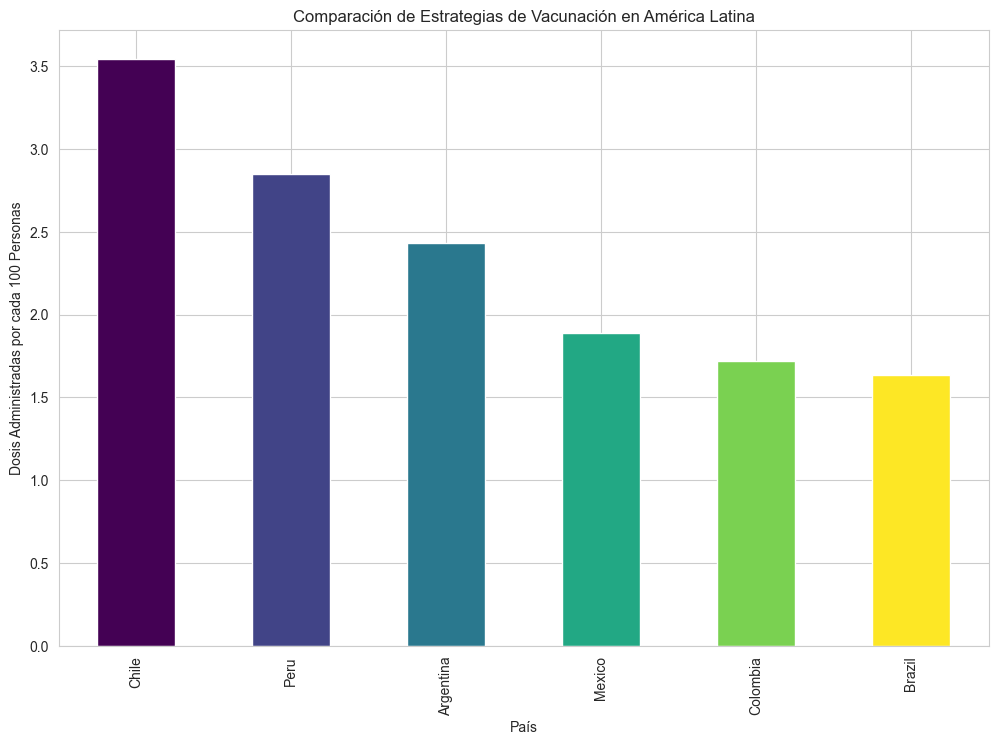

In [75]:
# Este código genera un gráfico de barras que muestra la cantidad de dosis de vacunas administradas por cada 100 personas en cada país.

# Calculamos la estrategia de vacunación por país
vaccination_strategy = df_paises_covid.groupby('country_name')['cumulative_vaccine_doses_administered'].max() / df_paises_covid.groupby('country_name')['population'].max()

# Ordenamos los valores de manera descendente
vaccination_strategy = vaccination_strategy.sort_values(ascending=False)

# Generamos una lista de colores aleatorios
colors = plt.cm.viridis(np.linspace(0, 1, len(vaccination_strategy)))

# Graficamos los datos usando un gráfico de barras con colores diferentes para cada barra
vaccination_strategy.plot(kind='bar', figsize=(12, 8), color=colors)

# Etiqueta del eje x
plt.xlabel('País')

# Etiqueta del eje y
plt.ylabel('Dosis Administradas por cada 100 Personas')

# Título del gráfico
plt.title('Comparación de Estrategias de Vacunación en América Latina')

# Mostramos el gráfico
plt.show()

Se observa que el país que más vacunados tuvo fueron Chile y Perú de acuerdo a la cantidad de vacunas y la proporcion con la población del país.

## 11. Evolución del Número de muertes diarias

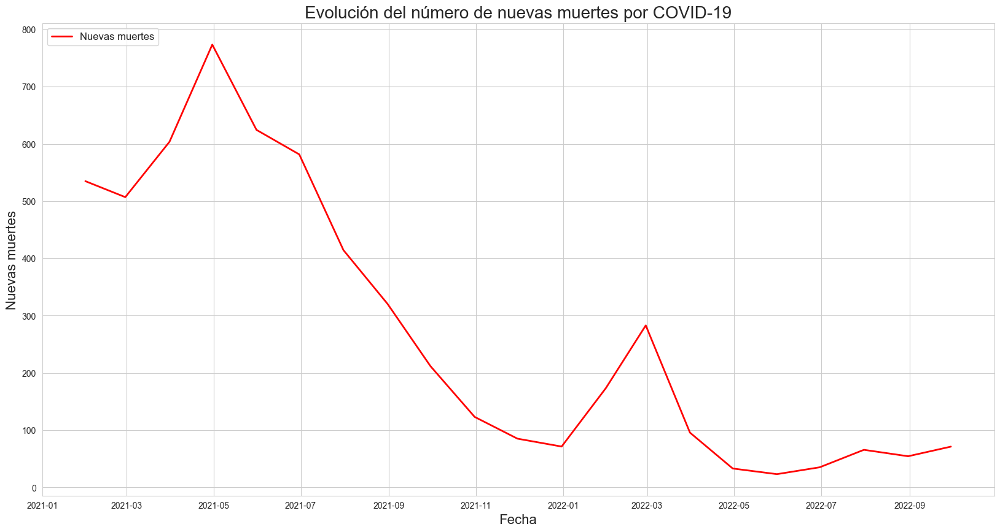

In [76]:


# Ordenar los datos por fecha
df_paises_covid.sort_index(inplace=True)

# Crear una nueva figura
plt.figure(figsize=(20, 10))

# Calcular los promedios mensuales
df_resample = df_paises_covid.resample('ME').mean(numeric_only=True)

# Graficar los nuevos casos confirmados
plt.plot(
    df_resample.index, 
    df_resample['new_deceased'], 
    color='red', 
    label='Nuevas muertes',
    linewidth=2
)

# Configurar las etiquetas de los ejes con un tamaño de fuente mayor
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Nuevas muertes', fontsize=16)

# Establecer el título del gráfico
plt.title('Evolución del número de nuevas muertes por COVID-19', fontsize=20)

# Configurar la leyenda
plt.legend(loc='upper left', fontsize=12)

# Mostrar la gráfica
plt.show()


In [78]:
df_paises_covid.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3750 entries, 2021-01-01 to 2022-09-17
Data columns (total 57 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3750 non-null   object 
 1   country_code                           3750 non-null   object 
 2   country_name                           3750 non-null   object 
 3   new_confirmed                          3750 non-null   float64
 4   new_deceased                           3750 non-null   float64
 5   cumulative_confirmed                   3750 non-null   float64
 6   cumulative_deceased                    3750 non-null   float64
 7   cumulative_vaccine_doses_administered  3750 non-null   float64
 8   population                             3750 non-null   float64
 9   population_male                        3750 non-null   float64
 10  population_female                      3750 non-null  

## 12. Prevalencia de condiciones preexistentes en paises con altas y bajas tasas de mortalidad

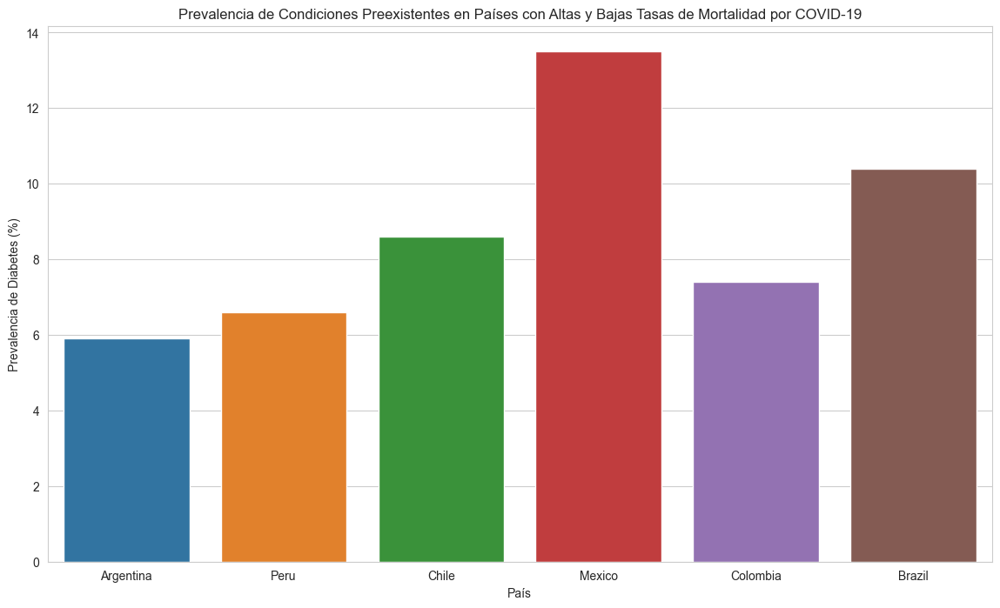

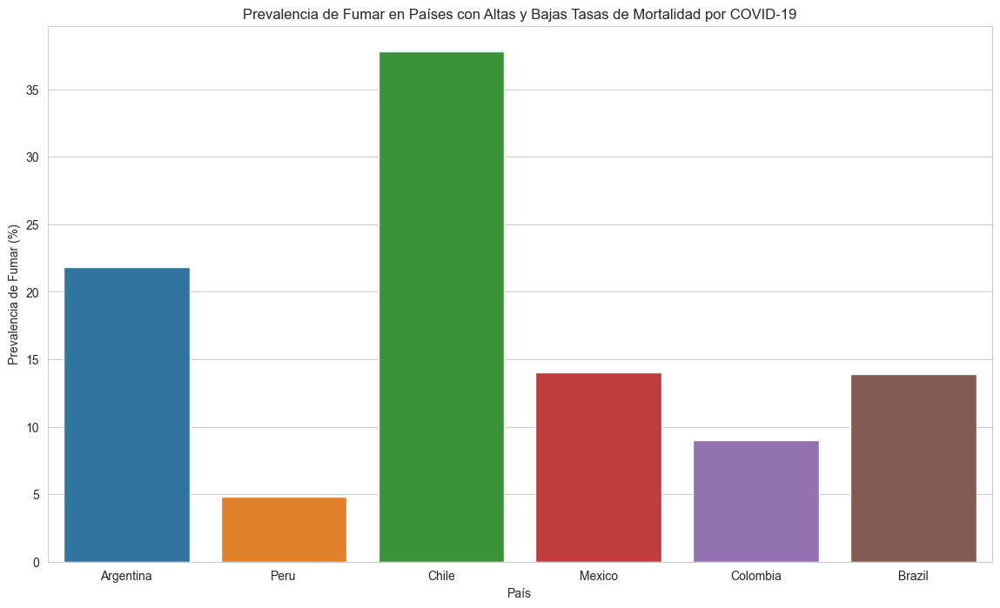

In [79]:
# Prevalencia de diabetes

# Obtener los 5 países con mayor número de fallecimientos acumulados
top_countries = df_paises_covid.groupby('country_name')['cumulative_deceased'].max().nlargest(5).index

# Obtener los 5 países con menor número de fallecimientos acumulados
bottom_countries = df_paises_covid.groupby('country_name')['cumulative_deceased'].max().nsmallest(5).index

# Filtrar los datos para incluir solo los países con las tasas más altas y más bajas de mortalidad
conditions_data = df_paises_covid[df_paises_covid['country_name'].isin(top_countries.union(bottom_countries))]

# Configuración del tamaño de la figura para el gráfico de diabetes
plt.figure(figsize=(14, 8))

# Graficar la prevalencia de diabetes
sns.barplot(data=conditions_data, x='country_name', y='diabetes_prevalence', hue='country_name')
plt.xlabel('País')
plt.ylabel('Prevalencia de Diabetes (%)')
plt.title('Prevalencia de Condiciones Preexistentes en Países con Altas y Bajas Tasas de Mortalidad por COVID-19')
plt.show()

# Prevalencia de fumar

# Configuración del tamaño de la figura para el gráfico de fumar
plt.figure(figsize=(14, 8))

# Graficar la prevalencia de fumar
sns.barplot(data=conditions_data, x='country_name', y='smoking_prevalence', hue='country_name')
plt.xlabel('País')
plt.ylabel('Prevalencia de Fumar (%)')
plt.title('Prevalencia de Fumar en Países con Altas y Bajas Tasas de Mortalidad por COVID-19')
plt.show()


## 13. Variación Mensual de Casos y Muertes 

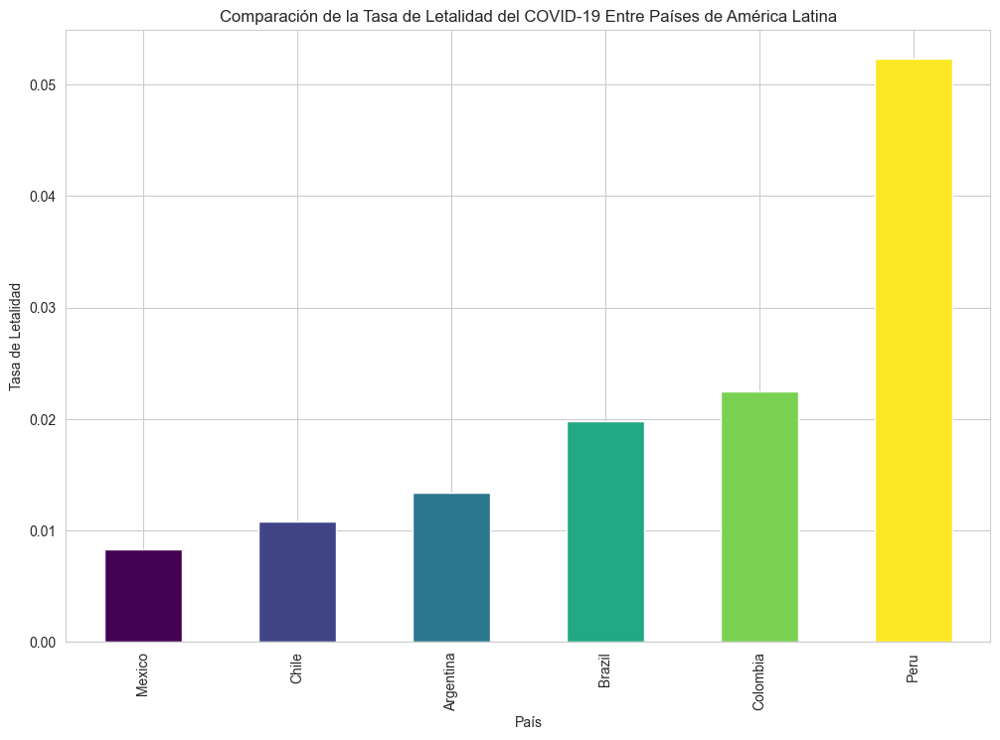

In [80]:

# Calcula la tasa de letalidad por país
df_paises_covid['case_fatality_rate'] = df_paises_covid['cumulative_deceased'] / df_paises_covid['cumulative_confirmed']
fatality_rates = df_paises_covid.groupby('country_name')['case_fatality_rate'].last().sort_values()

# Crea el gráfico de barras
plt.figure(figsize=(12, 8))

# Generamos una lista de colores aleatorios
colors = plt.cm.viridis(np.linspace(0, 1, len(fatality_rates)))

# Graficamos los datos usando un gráfico de barras con colores diferentes para cada barra
bars = fatality_rates.plot(kind='bar', color=colors)

# Configura los ejes y el título del gráfico
plt.xlabel('País')
plt.ylabel('Tasa de Letalidad')
plt.title('Comparación de la Tasa de Letalidad del COVID-19 Entre Países de América Latina')

# Muestra el gráfico
plt.show()


## 14. Analisis temporal de la Mortalidad

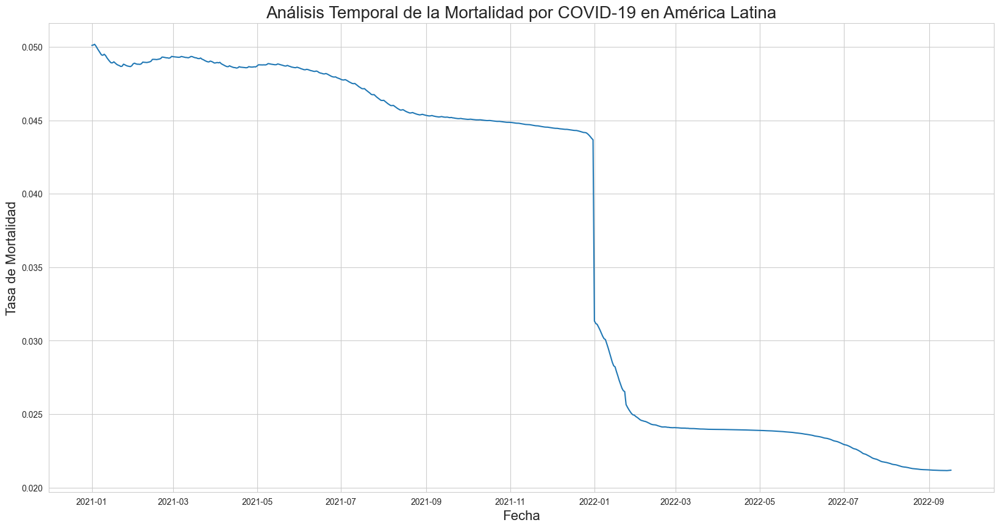

In [81]:


# Calculamos la tasa de mortalidad como el número acumulado de fallecidos dividido por el número acumulado de confirmados
df_paises_covid['mortality_rate'] = df_paises_covid['cumulative_deceased'] / df_paises_covid['cumulative_confirmed']

# Creamos una nueva figura con un tamaño más grande para mejorar la legibilidad
plt.figure(figsize=(20, 10))

# Creamos un gráfico de líneas con Seaborn
# Establecemos 'estimator' en 'mean' para mostrar solo la media de la tasa de mortalidad
sns.lineplot(data=df_paises_covid, x='date', y='mortality_rate', estimator='mean', errorbar=None)

# Aumentamos el tamaño de la fuente del título y las etiquetas de los ejes para mejorar la legibilidad
plt.title('Análisis Temporal de la Mortalidad por COVID-19 en América Latina', fontsize=20)
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Tasa de Mortalidad', fontsize=16)

# Mostramos el gráfico
plt.show()

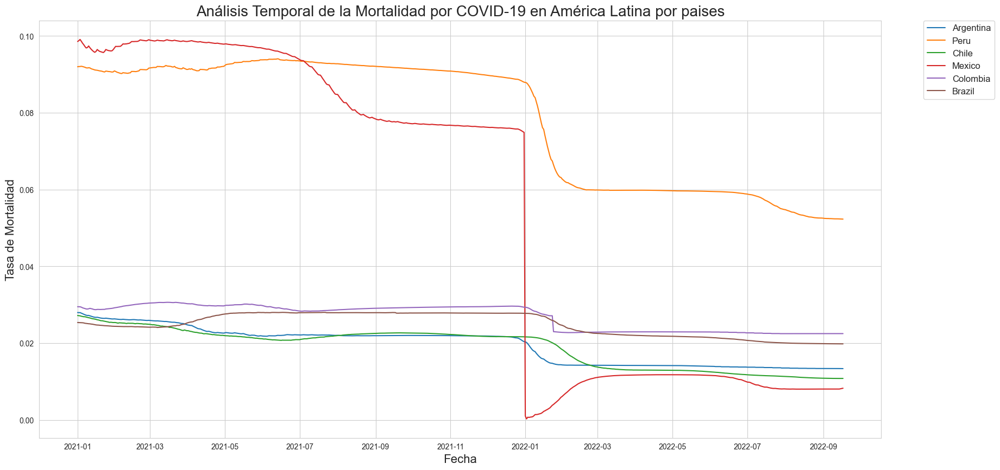

In [82]:

# Calculamos la tasa de mortalidad como el número acumulado de fallecidos dividido por el número acumulado de confirmados
df_paises_covid['mortality_rate'] = df_paises_covid['cumulative_deceased'] / df_paises_covid['cumulative_confirmed']

# Creamos una nueva figura con un tamaño más grande para mejorar la legibilidad
plt.figure(figsize=(20, 10))

# Creamos un gráfico de líneas con Seaborn, donde cada línea representa un país
# Usamos el argumento 'hue' para diferenciar los países por color
sns.lineplot(data=df_paises_covid, x='date', y='mortality_rate', hue='country_name', estimator='mean', errorbar=None)

# Aumentamos el tamaño de la fuente del título y las etiquetas de los ejes para mejorar la legibilidad
plt.title('Análisis Temporal de la Mortalidad por COVID-19 en América Latina por paises', fontsize=20)
plt.xlabel('Fecha', fontsize=16)
plt.ylabel('Tasa de Mortalidad', fontsize=16)

# Movemos la leyenda fuera del área del gráfico para evitar la superposición
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)

# Mostramos el gráfico
plt.show()

## 15 Comparación de Situación Actual (Contexto de los datos)

<Figure size 600x400 with 0 Axes>

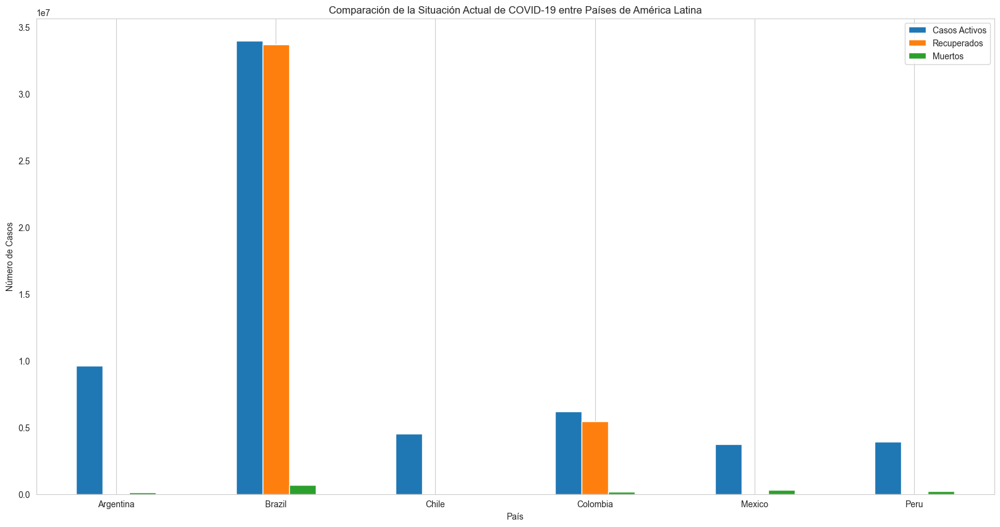

In [83]:
# No hay datos de recuperados y muertes en algunos países

# Agrupa los datos por nombre del país y obtiene el valor máximo para 'active_cases', 'cumulative_recovered' y 'cumulative_deceased'
situacion_actual = df_paises_covid.groupby('country_name').max()[['active_cases', 'cumulative_recovered', 'cumulative_deceased']]

# Crea el gráfico de barras
plt.figure(figsize=(6, 4))  # Configura el tamaño de la figura del gráfico
situacion_actual.plot(kind='bar', stacked=False, figsize=(20, 10))  # Grafica los datos en un gráfico de barras no apiladas con colores específicos

# Configura el título y etiquetas del gráfico

plt.title('Comparación de la Situación Actual de COVID-19 entre Países de América Latina')
# Etiqueta del eje X
plt.xlabel('País')  
# Etiqueta del eje Y
plt.ylabel('Número de Casos')  
# Leyenda para cada barra
plt.legend(['Casos Activos', 'Recuperados', 'Muertos'])  
# Agregar líneas solo en el eje Y
plt.grid(axis='y')  
# Rotación de las etiquetas en el eje X
plt.xticks(rotation=0) 

# Muestra el gráfico en pantalla
plt.show()  


In [84]:
#guardamos el dataframe en un archivo CSV para trabajarlo en Power BI
#se guardan incluyendo los indices
df_paises_covid.to_csv('DatosFinalesFiltradoPowerBI.csv')

In [85]:
df_paises_covid.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3750 entries, 2021-01-01 to 2022-09-17
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3750 non-null   object 
 1   country_code                           3750 non-null   object 
 2   country_name                           3750 non-null   object 
 3   new_confirmed                          3750 non-null   float64
 4   new_deceased                           3750 non-null   float64
 5   cumulative_confirmed                   3750 non-null   float64
 6   cumulative_deceased                    3750 non-null   float64
 7   cumulative_vaccine_doses_administered  3750 non-null   float64
 8   population                             3750 non-null   float64
 9   population_male                        3750 non-null   float64
 10  population_female                      3750 non-null  

# Geolocalización - EXTRA CREDIT

In [86]:
# Importamos las librerías necesarias para crear el mapa
import folium
from folium.plugins import HeatMap

# Seleccionamos las columnas que vamos a utilizar
columns = ['latitude', 'longitude', 'cumulative_confirmed', 'cumulative_deceased', 
           'cumulative_vaccine_doses_administered', 'cumulative_recovered']
data_map = df_paises_covid[columns].dropna()

# Creamos un mapa centrado en América Latina
map = folium.Map(location=[-14.235004, -51.92528], zoom_start=3)

# Creamos un mapa de calor para los casos confirmados
heat_map_confirmed = HeatMap(data=data_map[['latitude', 'longitude', 'cumulative_confirmed']], radius=20)
map.add_child(heat_map_confirmed)

# Creamos un mapa de calor para las muertes
heat_map_deceased = HeatMap(data=data_map[['latitude', 'longitude', 'cumulative_deceased']], radius=20)
map.add_child(heat_map_deceased)

# Creamos un mapa de calor para las vacunas administradas
heat_map_vaccine = HeatMap(data=data_map[['latitude', 'longitude', 'cumulative_vaccine_doses_administered']], radius=20)
map.add_child(heat_map_vaccine)

# Creamos un mapa de calor para los recuperados
heat_map_recovered = HeatMap(data=data_map[['latitude', 'longitude', 'cumulative_recovered']], radius=20)
map.add_child(heat_map_recovered)

map
